# Splicing coordination among more samples

We begin by importing all the libraries that we will need and setting some basic logger configurations.

In [1]:
from isotools import Transcriptome
from isotools import __version__ as isotools_version
from isotools._utils import _filter_event

import os
from pathlib import Path
import logging
from collections import Counter
from urllib.request import urlretrieve
import itertools
from tqdm.notebook import tqdm_notebook as tqdm

import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pysam

logging.basicConfig(format='%(levelname)s:%(message)s', level=logging.INFO)
logger=logging.getLogger('isotools')
logger.info(f'This is isootools version {isotools_version}')

INFO:This is isootools version 0.2.11rc1


Then we assume the data are in the `./data` directory and we check for all the experiments availabel on encode. If the experiments are not yet downloaded they will be downloaded in the `./data` directory.

If the `./data` directory does not exist we create it.

In [2]:
Path('./data').mkdir(parents=True, exist_ok=True)

Then we open a csv file with metadata on all the experiments on encode as a pandas dataframe `metadata`.

In [3]:
#first, check what samples are present
metadata_link="https://www.encodeproject.org/metadata/?type=Experiment&assay_title=long+read+RNA-seq&replicates.library.biosample.donor.organism.scientific_name=Homo+sapiens&files.file_type=bam&files.file_type=fastq&advancedQuery=date_released%3A%5B2009-02-01+TO+2021-12-31%5D&searchTerm=long+read+RNA-seq"
metadata=pd.read_csv(metadata_link, sep='\t')
platform=metadata.set_index('Experiment accession').Platform.dropna().to_dict()
for pf,count in Counter(platform.values()).items():
    logging.info(f'{pf}: In total {count} experiments from ENCODE')

INFO:Pacific Biosciences Sequel: In total 16 experiments from ENCODE
INFO:Pacific Biosciences Sequel II: In total 60 experiments from ENCODE
INFO:Oxford Nanopore MinION: In total 11 experiments from ENCODE
INFO:Oxford Nanopore PromethION: In total 4 experiments from ENCODE


Here we create another pandas dataframe with the entries that we actually want to download.

In [4]:
#Select the samples from the metadata, make sure there are only bam files are in the table
samples=metadata[(metadata['Output type']=='alignments') & (metadata['File Status']=='released')].copy()
samples['Platform']=[platform.get(ea,'unknown') for ea in samples['Experiment accession']] #This info is missing for some files
samples=samples[['File accession','Output type','Biosample term name','Biosample type','Technical replicate(s)','Platform']].reset_index(drop=True)
samples=samples.query('Platform == "Pacific Biosciences Sequel II"')

make supplementary material table

In [5]:
supl=metadata[(metadata['Output type']=='alignments') & (metadata['File Status']=='released')].copy()
supl['Platform']=[platform.get(ea,'unknown') for ea in supl['Experiment accession']] #This info is missing for some files
supl=supl[['File accession','Biosample term name','Biosample type','Platform']].reset_index(drop=True)
supl=supl.query('Platform == "Pacific Biosciences Sequel II"')
supl=supl[['File accession','Biosample term name','Biosample type']].reset_index(drop=True)
supl.to_csv("./tables/data_used.csv",index=False)

In [6]:
# define the paths for reference and annotation files
genome='/project/hfa_work/ceraolo/theco/ref/GRCh38_no_alt_analysis_set_GCA_000001405.15.fasta'
anno='/project/hfa_work/ceraolo/theco/ref/gencode.v29.primary_assembly.annotation_UCSC_names_sorted'
chrom=[f'chr{i+1}'for i in range(22)]+['chrX','chrY']

And ultimately we download the data.

In [7]:
#download and index the selected files, if not present
for accession in samples['File accession']:
    bam=f"data/{accession}.bam"
    bai=bam+'.bai'
    if not os.path.isfile(bam):
        logger.info(f'downloading bam file for {accession}')
        url=metadata.loc[metadata['File accession']==accession,'File download URL'].values[0]
        file=os.path.split(url)[1]
        urlretrieve(url, f"data/{file}")
    if not os.path.isfile(bai) or os.path.getmtime(bam)>os.path.getmtime(bai):
        logger.info(f'indexing {accession}')
        pysam.index(bam)

We create or load the isotools object here.

In [8]:
try:
    isoseq=Transcriptome.load("./theco_isotools.pkl")
    
except FileNotFoundError:    
    try:
        isoseq=Transcriptome.from_reference(anno+".isotools.pkl")
        
    except:
        isoseq=Transcriptome.from_reference(anno+".gtf.gz")
        isoseq.save_reference(anno+'.isotools.pkl')

INFO:loading transcriptome from ./theco_isotools.pkl


In [8]:
for g in isoseq.iter_genes(progress_bar=True):
    _=g.coverage
    for tr in g.transcripts:
        tr.pop('TSS', None)
        tr.pop('PAS', None)
        tr.pop('strand', None)
        tr.pop('coverage', None)
        tr.pop('direct_repeat_len', None)
isoseq.save("./theco_isotools_light.pkl") 

100%|██████████████████████████████| 695092/695092 [11:08<00:00, 1040.54genes/s]
INFO:saving transcriptome to ./theco_isotools_light.pkl


In [ ]:
isoseq=Transcriptome.load("./theco_isotools_light.pkl")

INFO:loading transcriptome from ./theco_isotools_light.pkl


### loading the samples

In [8]:
for i,row in samples.iterrows():
    sname=f"{row['Biosample term name']}_{row['File accession']}".replace(' ','_')
    if sname in isoseq.samples:
        logger.info(f'{sname} loaded')
    logger.info(f'{len(isoseq.samples)}/86 samples loaded')
    if sname not in isoseq.samples:
        isoseq.add_sample_from_bam(f"data/{row['File accession']}.bam",
                                   use_satag=True,
                                   sample_name=sname ,
                                   sample_subtype=row['Biosample term name'],
                                   sample_type=row['Biosample type'],
                                   platform=row['Platform'])
        isoseq.make_index()
        isoseq.save("./theco_isotools.pkl")
        logger.info(f'{sname} loaded.    {len(isoseq.samples)}/86 samples loaded')

INFO:WTC11_ENCFF373TKM loaded
INFO:86/86 samples loaded
INFO:WTC11_ENCFF985LGZ loaded
INFO:86/86 samples loaded
INFO:WTC11_ENCFF388HXU loaded
INFO:86/86 samples loaded
INFO:HepG2_ENCFF814ABW loaded
INFO:86/86 samples loaded
INFO:IMR-90_ENCFF545PJV loaded
INFO:86/86 samples loaded
INFO:lower_lobe_of_left_lung_ENCFF924HBV loaded
INFO:86/86 samples loaded
INFO:HCT116_ENCFF400LRT loaded
INFO:86/86 samples loaded
INFO:right_cardiac_atrium_ENCFF875QHC loaded
INFO:86/86 samples loaded
INFO:chondrocyte_ENCFF439BVT loaded
INFO:86/86 samples loaded
INFO:chondrocyte_ENCFF545CXA loaded
INFO:86/86 samples loaded
INFO:chondrocyte_ENCFF469ATL loaded
INFO:86/86 samples loaded
INFO:psoas_muscle_ENCFF698UNA loaded
INFO:86/86 samples loaded
INFO:left_colon_ENCFF886FZQ loaded
INFO:86/86 samples loaded
INFO:MCF-7_ENCFF118JEI loaded
INFO:86/86 samples loaded
INFO:PC-3_ENCFF044LIA loaded
INFO:86/86 samples loaded
INFO:heart_right_ventricle_ENCFF660UTF loaded
INFO:86/86 samples loaded
INFO:K562_ENCFF322UJU lo

### continuing the analysis

In [9]:
#isoseq.add_qc_metrics(genome)
#isoseq.save("./theco_isotools.pkl")

In [9]:
stbl=isoseq.sample_table
stbl

,name,file,group,nonchimeric_reads,chimeric_reads,platform,sample_subtype,sample_type
0,MCF-7_ENCFF118JEI,data/ENCFF118JEI.bam,NaN,1628772,12589,Pacific Biosciences Sequel II,MCF-7,cell line
1,K562_ENCFF322UJU,data/ENCFF322UJU.bam,NaN,1896354,10365,Pacific Biosciences Sequel II,K562,cell line
2,heart_right_ventricle_ENCFF660UTF,data/ENCFF660UTF.bam,NaN,1253093,14813,Pacific Biosciences Sequel II,heart right ventricle,tissue
3,GM12878_ENCFF219UJG,data/ENCFF219UJG.bam,NaN,1490038,4430,Pacific Biosciences Sequel II,GM12878,cell line
4,heart_right_ventricle_ENCFF018PZX,data/ENCFF018PZX.bam,NaN,1028295,9887,Pacific Biosciences Sequel II,heart right ventricle,tissue
...,...,...,...,...,...,...,...,...
81,HL-60_ENCFF810FRP,data/ENCFF810FRP.bam,NaN,2774419,721,Pacific Biosciences Sequel II,HL-60,cell line
82,HL-60_ENCFF600MGT,data/ENCFF600MGT.bam,NaN,2366965,386,Pacific Biosciences Sequel II,HL-60,cell line
83,left_cardiac_atrium_ENCFF344KQF,data/ENCFF344KQF.bam,NaN,738914,249,Pacific Biosciences Sequel II,left cardiac atrium,tissue
84,neural_crest_cell_ENCFF319JFG,data/ENCFF319JFG.bam,NaN,866597,238,Pacific Biosciences Sequel II,neural crest cell,in vitro differentiated cells


# Sample types

In [10]:
groups={}

for stype in ('cell line', 'in vitro differentiated cells', 'primary cell', 'tissue'):
    groups[stype]=list(stbl.name[stbl.sample_type==stype])

In [11]:
groups.keys()

dict_keys(['cell line', 'in vitro differentiated cells', 'primary cell', 'tissue'])

In [12]:
def eval_trid(df):
    df.priA_priB_trID=[eval(e) for e in df.priA_priB_trID]
    df.priA_altB_trID=[eval(e) for e in df.priA_altB_trID]
    df.altA_priB_trID=[eval(e) for e in df.altA_priB_trID]
    df.altA_altB_trID=[eval(e) for e in df.altA_altB_trID]
    pass

In [13]:
tbl_path="./tables/sample_type/"
files=[x.name for x in Path(tbl_path).iterdir()]

In [14]:
#isoseq.add_filter("REFERENCE", "reference", context='gene')

In [15]:
if not all([f in files for f in ('coor_cell_line.csv', 'coor_invitro_diff.csv', 'coor_primary_cell.csv', 'coor_tissue.csv')]):
    coor_cell_line=isoseq.coordination_test(samples=groups["cell line"], query="not NOVEL_GENE",
                                            event_type=("ES","3AS", "5AS","IR","ME", "TSS", "PAS"),test="fisher")
    coor_cell_line.to_csv("./tables/sample_type/coor_cell_line.csv",index=False)
    
    coor_invitro_diff=isoseq.coordination_test(samples=groups["in vitro differentiated cells"],query="not NOVEL_GENE",
                                        event_type=("ES","3AS", "5AS","IR","ME", "TSS", "PAS"),test="fisher")
    coor_invitro_diff.to_csv("./tables/sample_type/coor_invitro_diff.csv",index=False)
    
    coor_primary_cell=isoseq.coordination_test(samples=groups["primary cell"],query="not NOVEL_GENE",
                                           event_type=("ES","3AS", "5AS","IR","ME", "TSS", "PAS"),test="fisher")
    coor_primary_cell.to_csv("./tables/sample_type/coor_primary_cell.csv",index=False)
    
    coor_tissue=isoseq.coordination_test(samples=groups["tissue"],query="not NOVEL_GENE",
                                           event_type=("ES","3AS", "5AS","IR","ME", "TSS", "PAS"),test="fisher")
    coor_tissue.to_csv("./tables/sample_type/coor_tissue.csv",index=False)
    
else:
    coor_cell_line=pd.read_csv("./tables/sample_type/coor_cell_line.csv")
    eval_trid(coor_cell_line)
    
    coor_invitro_diff=pd.read_csv("./tables/sample_type/coor_invitro_diff.csv")
    eval_trid(coor_invitro_diff)
    
    coor_primary_cell=pd.read_csv("./tables/sample_type/coor_primary_cell.csv")
    eval_trid(coor_primary_cell)
    
    coor_tissue=pd.read_csv("./tables/sample_type/coor_tissue.csv")
    eval_trid(coor_tissue)

In [16]:
tabl_dict={"cell_line":coor_cell_line,"invitro_diff":coor_invitro_diff, "primary_cell":coor_primary_cell, "tissue":coor_tissue}

## General stats

In [18]:
def coor_stats(coor_tbl):
    
    n_events=coor_tbl.shape[0]
    n_genes=len(set(coor_tbl.gene_name))
    
    n_coor=sum(coor_tbl.adj_p_value<0.05)
    n_coor_genes=len(set(coor_tbl.loc[coor_tbl.adj_p_value<0.05].gene_name))
    
    p1=f"total pairs: {n_events} in {n_genes} genes\n"
    p2=f"coordinated pairs: {n_coor} ({round((n_coor/n_events)*100,2)}%) in {n_coor_genes} genes ({round((n_coor_genes/n_genes)*100,2)}%) \n"
    print(p1+p2)
    return n_events, n_coor, n_genes, n_coor_genes 

In [19]:
res=[]
for k in tabl_dict.keys():
    print(f"=== {k} ===")
    res.append(coor_stats(tabl_dict[k]))

=== cell_line ===
total pairs: 84323 in 8672 genes
coordinated pairs: 21778 (25.83%) in 5272 genes (60.79%) 

=== invitro_diff ===
total pairs: 50072 in 6438 genes
coordinated pairs: 11662 (23.29%) in 3496 genes (54.3%) 

=== primary_cell ===
total pairs: 11635 in 2684 genes
coordinated pairs: 2112 (18.15%) in 861 genes (32.08%) 

=== tissue ===
total pairs: 64484 in 7765 genes
coordinated pairs: 17677 (27.41%) in 4736 genes (60.99%) 



In [20]:
print(f"There are on average {np.mean([e[0] for e in res])} events on the sa")

There are on average 52628.5 events on the sa


In [21]:
np.mean([0.2583,0.2329,0.1815,0.2741]),np.std([0.2583,0.2329,0.1815,0.2741])

(0.2367, 0.035095583767762006)

In [22]:
np.mean([8672,6438,2684,7765]),np.std([8672,6438,2684,7765])

(6389.75, 2282.2625150275767)

In [23]:
np.mean([0.6079,0.543,0.3208,0.6099]),np.std([0.6079,0.543,0.3208,0.6099])

(0.5204, 0.11833999746493154)

In [24]:
tags=list(set(stbl.sample_type))
tags

weights=[]

for t in tags:
    print(t,stbl[stbl.sample_type==t].shape[0])

in vitro differentiated cells 21
primary cell 4
cell line 28
tissue 33


In [29]:
figures="figures/sample_type/"
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 200
plt.style.use("seaborn-whitegrid")

In [49]:
def bar_events(sample_dict,significance=0.05,ha="center",rotation=0, ax=None,weights=None):
    
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
    
    n_events=[]
    n_coor=[]
    snames=[]
    
    for k in sample_dict.keys():
        n_events.append(sum(sample_dict[k].adj_p_value>=significance))
        n_coor.append(sum(sample_dict[k].adj_p_value<significance))
        snames.append(k)
        
    if weights is None:
        weights=[1 for _ in range(len(snames))]
        
    n_events=np.array(n_events)/np.array(weights)
    n_coor=np.array(n_coor)/np.array(weights)
    
    ax.bar(snames,n_coor,color='#ff7f0e',width=0.7,label="coordinated pairs")
    ax.bar(snames,n_events,bottom=n_coor,width=0.7,color='#1f77b4',label="uncoordinated pairs")
    
    ax.set_xticklabels(snames, rotation=rotation, ha=ha)

    ax.legend(frameon=True)
    

/scratch/local/ipykernel_111383/3002510682.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(snames, rotation=rotation, ha=ha)


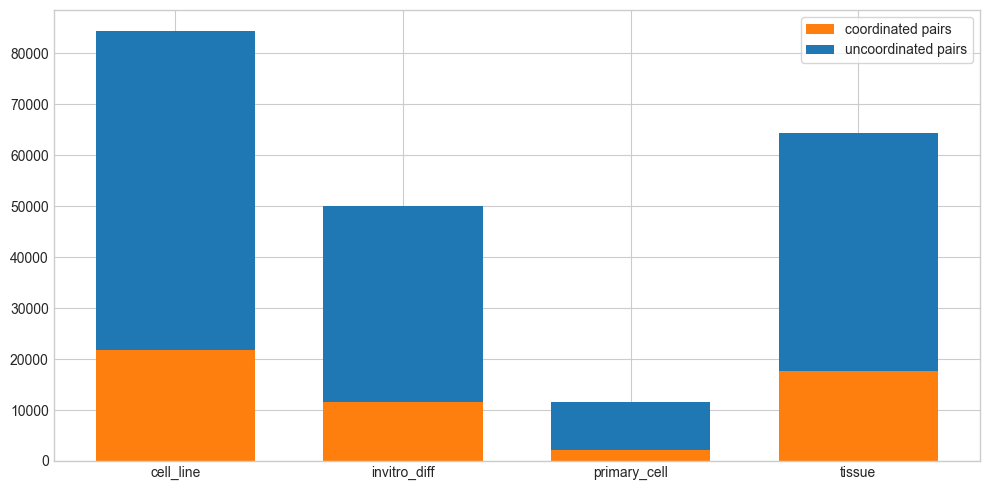

In [50]:
fig,ax=plt.subplots(figsize=(10,5))
bar_events(tabl_dict,ax=ax)
fig.tight_layout()
plt.savefig(figures+"bar_sample_type_prop.png")

/scratch/local/ipykernel_111383/3002510682.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(snames, rotation=rotation, ha=ha)


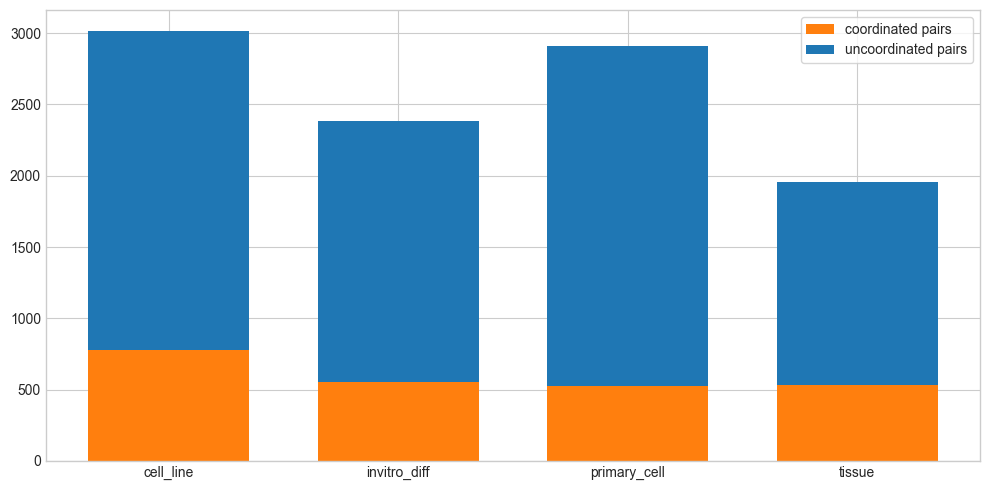

In [51]:
fig,ax=plt.subplots(figsize=(10,5))
bar_events(tabl_dict,ax=ax,weights=[28,21,4,33])
fig.tight_layout()
plt.savefig(figures+"bar_sample_type_prop_weighted.png")

In [26]:
def count_event_pairs(coor_tbl,coordination=False,significance=0.05):
    
    counts={}
    
    pairs=list(itertools.combinations_with_replacement(("ES","3AS", "5AS","IR","ME", "TSS", "PAS"),2))
    
    for p in tqdm(pairs):
        for i,r in coor_tbl.iterrows():
            if p == (r.ase1_type,r.ase2_type) or p == (r.ase2_type,r.ase1_type):
                i = 1 if r.adj_p_value<significance else 2
                if counts.get(p) is None:
                    counts[p]=[1,0,0]
                    counts[p][i]+=1
                else:
                    counts[p][0]+=1
                    counts[p][i]+=1
    counts=[(c,t) for t,c in counts.items()]
    counts.sort()
    return counts
                    

In [27]:
pair_counts_dict={}

for k in tabl_dict.keys():
    logger.info(f"computing pairs for {k}")
    pair_counts_dict[k]=count_event_pairs(tabl_dict[k])

INFO:computing pairs for cell_line


  0%|          | 0/28 [00:00<?, ?it/s]

INFO:computing pairs for invitro_diff


  0%|          | 0/28 [00:00<?, ?it/s]

INFO:computing pairs for primary_cell


  0%|          | 0/28 [00:00<?, ?it/s]

INFO:computing pairs for tissue


  0%|          | 0/28 [00:00<?, ?it/s]

In [56]:
def bar_event_pairs(pair_counts,colors=('#ff7f0e','#1f77b4'),ax=None,title="",frac=False,filter_out=()):
            
    pc_type=["\n".join(t) for c,t in pair_counts if t not in filter_out]
    pc_counts_coor=np.array([c[1] for c,t in pair_counts if t not in filter_out])
    pc_counts_uncoor=np.array([c[2] for c,t in pair_counts if t not in filter_out])
    
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
        
    if frac==False:
        
        ax.bar(pc_type, pc_counts_coor, color=colors[0], label="coordinated")
        ax.bar(pc_type, pc_counts_uncoor, bottom=pc_counts_coor, color=colors[1], label="uncoordinated")
    
    else:
        ax.bar(pc_type,pc_counts_coor/(pc_counts_coor+pc_counts_uncoor),color="green",label="fraction of coordinated events")
    
    ax.set_title(title)
    ax.legend(frameon=True,loc="best")

Test

In [23]:
pair_counts_primary_cell=pair_counts_dict["primary_cell"]

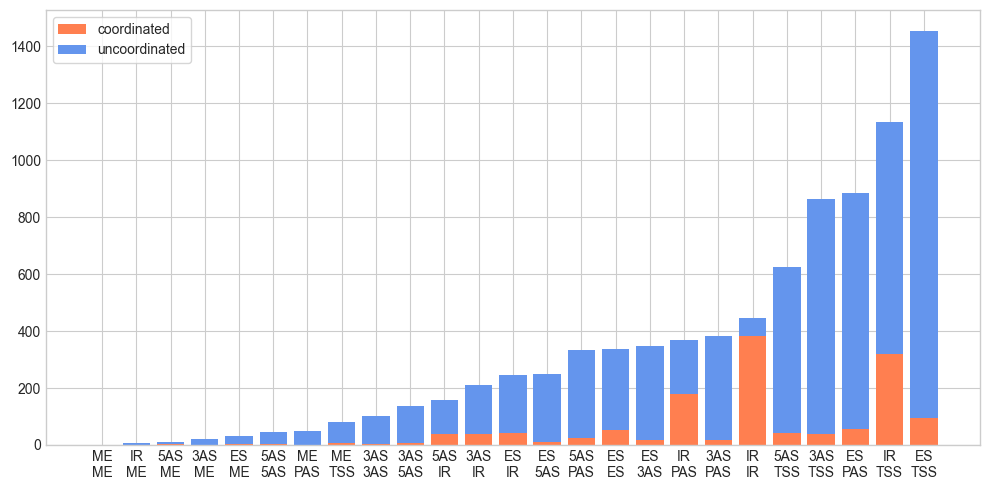

In [24]:
fig,ax=plt.subplots(figsize=(10,5))
bar_event_pairs(pair_counts_primary_cell,ax=ax,colors=("coral","cornflowerblue"),filter_out=[("TSS","PAS")])
fig.tight_layout()

In [57]:
plt.rc("xtick",labelsize=5)

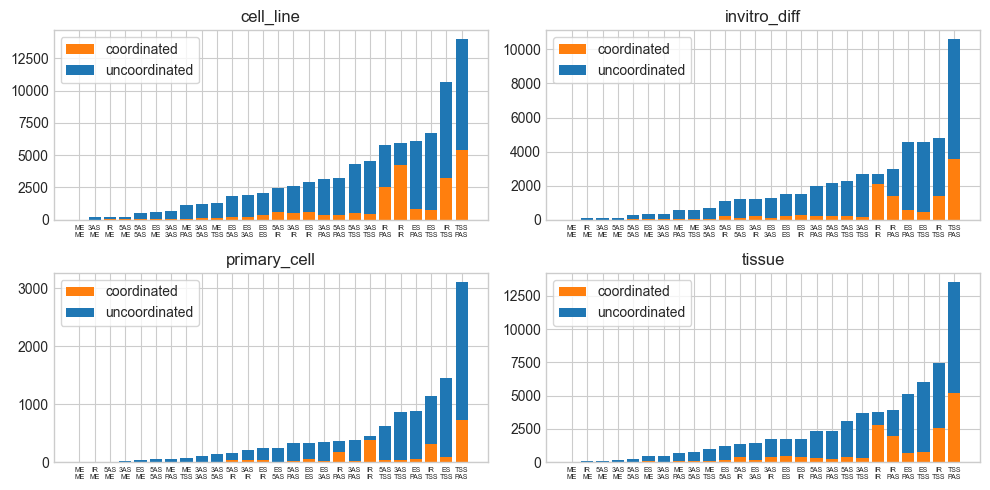

In [58]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0
for k in pair_counts_dict.keys():
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_sample_type.png")

In [76]:
for k in pair_counts_dict.keys():
    ck=pair_counts_dict[k]
    print(k)
    for e in ck:
        if e[1]==('IR', 'IR'):
            print(e,e[0][1]/e[0][0])


cell_line
([5962, 4230, 1732], ('IR', 'IR')) 0.7094934585709494
invitro_diff
([2709, 2117, 592], ('IR', 'IR')) 0.781469176818014
primary_cell
([447, 381, 66], ('IR', 'IR')) 0.8523489932885906
tissue
([3792, 2812, 980], ('IR', 'IR')) 0.7415611814345991


In [73]:
2812/3792

0.7415611814345991

In [28]:
for k in pair_counts_dict.keys():
    ck=pair_counts_dict[k]
    print(f"==={k}===")
    print(f"Total number of events:  {ck[-1][0][0]}    coordinated:  {ck[-1][0][1]} ({round((ck[-1][0][1]/ck[-1][0][0])*100,2)}%)    uncoordinated:  {ck[-1][0][2]}    event type: {ck[-1][1]}\n")
    

===cell_line===
Total number of events:  13969    coordinated:  5438 (38.93%)    uncoordinated:  8531    event type: ('TSS', 'PAS')

===invitro_diff===
Total number of events:  10586    coordinated:  3550 (33.53%)    uncoordinated:  7036    event type: ('TSS', 'PAS')

===primary_cell===
Total number of events:  3111    coordinated:  726 (23.34%)    uncoordinated:  2385    event type: ('TSS', 'PAS')

===tissue===
Total number of events:  13552    coordinated:  5225 (38.56%)    uncoordinated:  8327    event type: ('TSS', 'PAS')



In [44]:
pairs=list(itertools.combinations_with_replacement(("ES","3AS", "5AS","IR","ME", "TSS", "PAS"),2))
pairs
counts=[]
for p in pairs:
    m=[]
    c=[[0,0,0],p]
    for k in pair_counts_dict.keys():
        ck=pair_counts_dict[k]
        for t in ck:
            if t[1]==p:
                m.append(t[0])
    c[0][0]=np.mean([e[0] for e in m])
    c[0][1]=np.mean([e[1] for e in m])
    c[0][2]=np.mean([e[2] for e in m])
    if np.isnan(c[0]).any():
        continue
    counts.append(c)
counts.sort()

In [45]:
counts[::-1]

[[[10304.5, 3734.75, 6569.75], ('TSS', 'PAS')],
 [[6014.5, 1882.75, 4131.75], ('IR', 'TSS')],
 [[4688.0, 525.25, 4162.75], ('ES', 'TSS')],
 [[4162.75, 543.25, 3619.5], ('ES', 'PAS')],
 [[3252.5, 1508.5, 1744.0], ('IR', 'PAS')],
 [[3227.5, 2385.0, 842.5], ('IR', 'IR')],
 [[2948.5, 236.25, 2712.25], ('3AS', 'TSS')],
 [[2577.25, 287.25, 2290.0], ('5AS', 'TSS')],
 [[2002.75, 237.75, 1765.0], ('5AS', 'PAS')],
 [[1967.75, 194.0, 1773.75], ('3AS', 'PAS')],
 [[1607.0, 346.5, 1260.5], ('ES', 'IR')],
 [[1445.75, 295.0, 1150.75], ('3AS', 'IR')],
 [[1402.5, 279.25, 1123.25], ('ES', 'ES')],
 [[1275.25, 314.5, 960.75], ('5AS', 'IR')],
 [[1251.25, 111.5, 1139.75], ('ES', '3AS')],
 [[1130.5, 123.5, 1007.0], ('ES', '5AS')],
 [[720.75, 64.75, 656.0], ('ME', 'TSS')],
 [[683.75, 67.25, 616.5], ('3AS', '5AS')],
 [[606.25, 49.75, 556.5], ('ME', 'PAS')],
 [[403.25, 29.0, 374.25], ('3AS', '3AS')],
 [[335.0, 32.0, 303.0], ('ES', 'ME')],
 [[267.0, 31.25, 235.75], ('5AS', '5AS')],
 [[120.0, 11.25, 108.75], ('5AS

In [46]:
[p for p in counts[::-1] if (set(p[1]) & {"TSS","PAS"}) == set()]

[[[3227.5, 2385.0, 842.5], ('IR', 'IR')],
 [[1607.0, 346.5, 1260.5], ('ES', 'IR')],
 [[1445.75, 295.0, 1150.75], ('3AS', 'IR')],
 [[1402.5, 279.25, 1123.25], ('ES', 'ES')],
 [[1275.25, 314.5, 960.75], ('5AS', 'IR')],
 [[1251.25, 111.5, 1139.75], ('ES', '3AS')],
 [[1130.5, 123.5, 1007.0], ('ES', '5AS')],
 [[683.75, 67.25, 616.5], ('3AS', '5AS')],
 [[403.25, 29.0, 374.25], ('3AS', '3AS')],
 [[335.0, 32.0, 303.0], ('ES', 'ME')],
 [[267.0, 31.25, 235.75], ('5AS', '5AS')],
 [[120.0, 11.25, 108.75], ('5AS', 'ME')],
 [[120.0, 4.25, 115.75], ('3AS', 'ME')],
 [[110.0, 12.75, 97.25], ('IR', 'ME')],
 [[4.25, 0.0, 4.25], ('ME', 'ME')]]

In [47]:
for c in counts[::-1]:
    nc=[round((c[0][1]/c[0][0])*100,2)]
    nc.extend(c[0])
    c[0]=nc
counts.sort()

In [48]:
counts[::-1]

[[[73.9, 3227.5, 2385.0, 842.5], ('IR', 'IR')],
 [[46.38, 3252.5, 1508.5, 1744.0], ('IR', 'PAS')],
 [[36.24, 10304.5, 3734.75, 6569.75], ('TSS', 'PAS')],
 [[31.3, 6014.5, 1882.75, 4131.75], ('IR', 'TSS')],
 [[24.66, 1275.25, 314.5, 960.75], ('5AS', 'IR')],
 [[21.56, 1607.0, 346.5, 1260.5], ('ES', 'IR')],
 [[20.4, 1445.75, 295.0, 1150.75], ('3AS', 'IR')],
 [[19.91, 1402.5, 279.25, 1123.25], ('ES', 'ES')],
 [[13.05, 4162.75, 543.25, 3619.5], ('ES', 'PAS')],
 [[11.87, 2002.75, 237.75, 1765.0], ('5AS', 'PAS')],
 [[11.7, 267.0, 31.25, 235.75], ('5AS', '5AS')],
 [[11.59, 110.0, 12.75, 97.25], ('IR', 'ME')],
 [[11.2, 4688.0, 525.25, 4162.75], ('ES', 'TSS')],
 [[11.15, 2577.25, 287.25, 2290.0], ('5AS', 'TSS')],
 [[10.92, 1130.5, 123.5, 1007.0], ('ES', '5AS')],
 [[9.86, 1967.75, 194.0, 1773.75], ('3AS', 'PAS')],
 [[9.84, 683.75, 67.25, 616.5], ('3AS', '5AS')],
 [[9.55, 335.0, 32.0, 303.0], ('ES', 'ME')],
 [[9.38, 120.0, 11.25, 108.75], ('5AS', 'ME')],
 [[8.98, 720.75, 64.75, 656.0], ('ME', 'TSS

In [49]:
[p for p in counts[::-1] if (set(p[1]) & {"TSS","PAS"}) == set()]

[[[73.9, 3227.5, 2385.0, 842.5], ('IR', 'IR')],
 [[24.66, 1275.25, 314.5, 960.75], ('5AS', 'IR')],
 [[21.56, 1607.0, 346.5, 1260.5], ('ES', 'IR')],
 [[20.4, 1445.75, 295.0, 1150.75], ('3AS', 'IR')],
 [[19.91, 1402.5, 279.25, 1123.25], ('ES', 'ES')],
 [[11.7, 267.0, 31.25, 235.75], ('5AS', '5AS')],
 [[11.59, 110.0, 12.75, 97.25], ('IR', 'ME')],
 [[10.92, 1130.5, 123.5, 1007.0], ('ES', '5AS')],
 [[9.84, 683.75, 67.25, 616.5], ('3AS', '5AS')],
 [[9.55, 335.0, 32.0, 303.0], ('ES', 'ME')],
 [[9.38, 120.0, 11.25, 108.75], ('5AS', 'ME')],
 [[8.91, 1251.25, 111.5, 1139.75], ('ES', '3AS')],
 [[7.19, 403.25, 29.0, 374.25], ('3AS', '3AS')],
 [[3.54, 120.0, 4.25, 115.75], ('3AS', 'ME')],
 [[0.0, 4.25, 0.0, 4.25], ('ME', 'ME')]]

How much do TSS and PAS account for?

In [55]:
sum([p[0][1] for p in counts[::-1]])

52628.5

In [53]:
sum([p[0][1] for p in counts[::-1] if (set(p[1]) & {"TSS","PAS"}) != set()])

39245.5

In [56]:
39245.5/52628.5

0.7457081239252497

In [61]:
sum([p[0][1] for p in counts[::-1] if "TSS" in p[1]])

27253.5

In [62]:
27253.5/52628.5

0.5178467940374512

In [63]:
sum([p[0][1] for p in counts[::-1] if "PAS" in p[1]])

22296.5

How much do IR account for?

In [59]:
sum([p[0][1] for p in counts[::-1] if "IR" in p[1]])

16932.5

In [64]:
22296.5/52628.5

0.4236582840096146

In [60]:
16932.5/52628.5

0.32173632157481213

How much do TSS and PAS account for? with coordination

In [65]:
sum([p[0][2] for p in counts[::-1]])

13307.25

In [66]:
sum([p[0][2] for p in counts[::-1] if (set(p[1]) & {"TSS","PAS"}) != set()])

9264.25

In [67]:
9264.25/13307.25

0.69618065340322

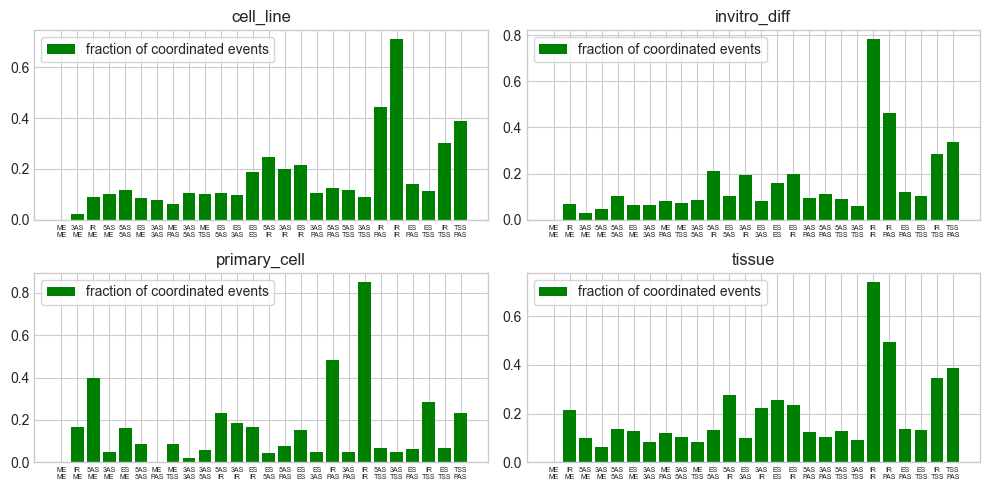

In [30]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0
for k in pair_counts_dict.keys():
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,frac=True)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_frac_sample_type.png")

In [31]:
plt.rc("xtick",labelsize=10)

Let's repeat the same plots but without PAS. TSS and IR.

In [32]:
ipt=[x[1] for x in pair_counts_dict["tissue"] if x[1][0] in ("TSS","PAS","IR") or x[1][1] in ("TSS","PAS","IR")]

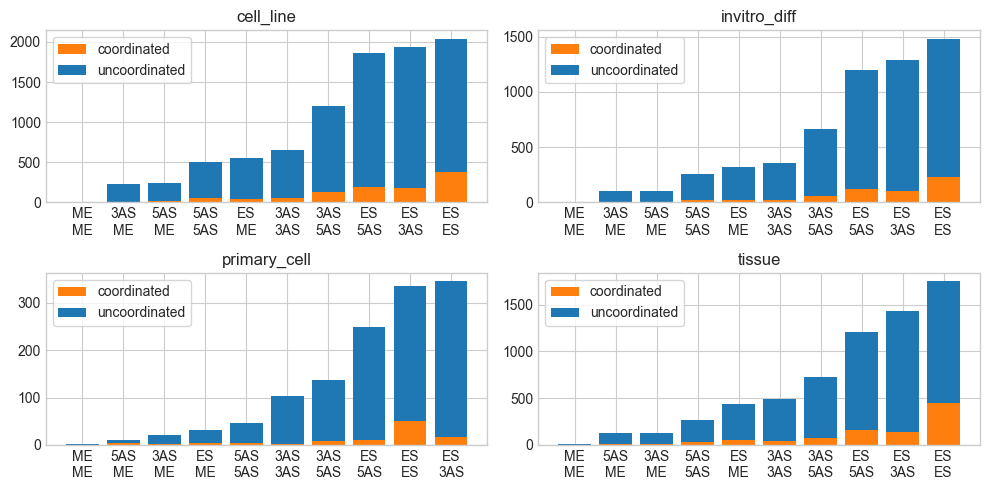

In [33]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0
for k in pair_counts_dict.keys():
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,filter_out=ipt)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_sample_type_filtered.png")

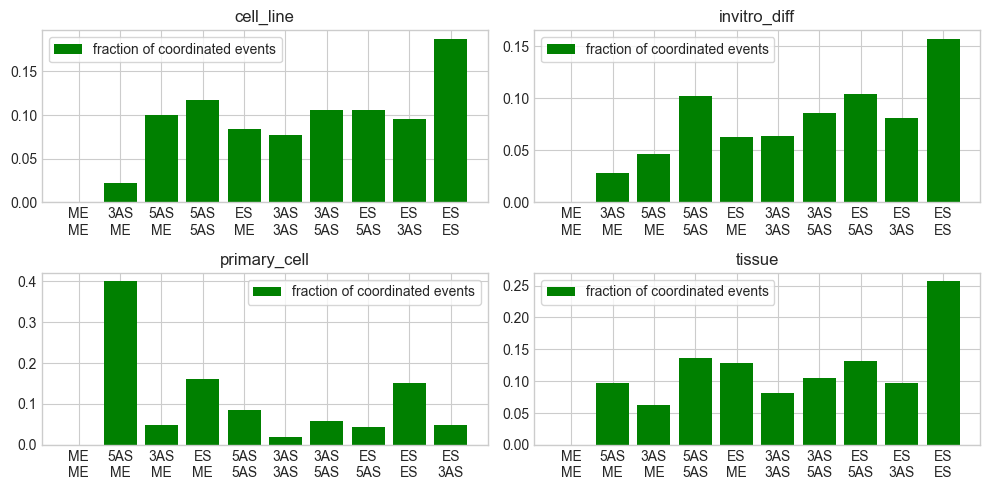

In [34]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0
for k in pair_counts_dict.keys():
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,frac=True,filter_out=ipt)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_frac_sample_type_filtered.png")

## Coverage

In [77]:
def get_cov(row,cov_type="std"):
    
    if cov_type=="std":
        return sum((row.priA_priB,row.priA_altB,row.altA_priB,row.altA_altB))
    
    elif cov_type=="min":
        return min(row.priA_priB+row.priA_altB, row.altA_priB+row.altA_altB,
                   row.priA_priB+row.altA_priB, row.priA_altB+row.altA_altB)
    
    elif cov_type=="mean":
        return np.mean([row.priA_priB+row.priA_altB, row.altA_priB+row.altA_altB,
                   row.priA_priB+row.altA_priB, row.priA_altB+row.altA_altB])
    
    elif cov_type=="max":
        return max(row.priA_priB+row.priA_altB, row.altA_priB+row.altA_altB,
                   row.priA_priB+row.altA_priB, row.priA_altB+row.altA_altB)  

In [78]:
def plot_cov(coor_tbl,significance=0.05,ax=None,title="",colors=('#ff7f0e','#1f77b4'),cov_type="std"):
    
    cov=[get_cov(r,cov_type) for i,r in coor_tbl.iterrows()]
    
    coor_tbl["coverage"]=cov
    coor_tbl_sig=coor_tbl.loc[coor_tbl.adj_p_value<significance]
    
    x=list(set(cov))
    y=[coor_tbl.value_counts(subset="coverage")[c] for c in x]
    y_sig=[coor_tbl_sig.value_counts(subset="coverage").get(c,0) for c in x]
    
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
    
    ax.scatter(x,y,label="total pairs",color=colors[1])
    ax.scatter(x,y_sig,label="coordinated pairs",color=colors[0])
    ax.set_xscale("log")
    ax.set_title(title)
    ax.set_xlabel("log(coverage)")
    ax.set_ylabel("#event pairs")
    ax.legend(frameon=True)


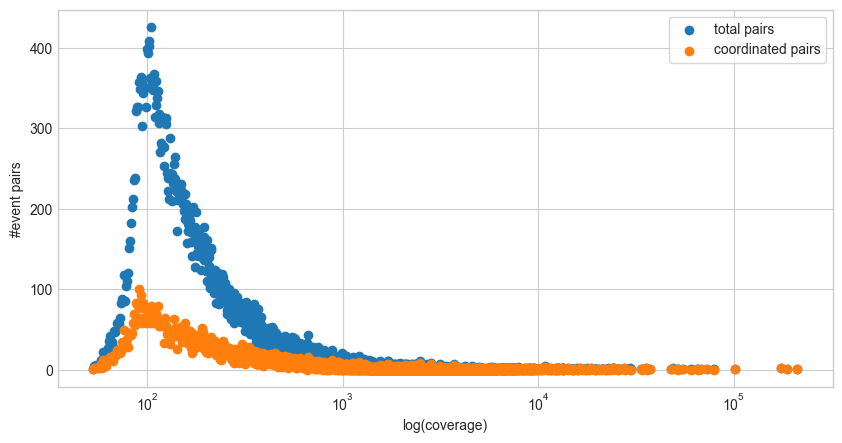

In [81]:
plot_cov(coor_tissue,cov_type="max")

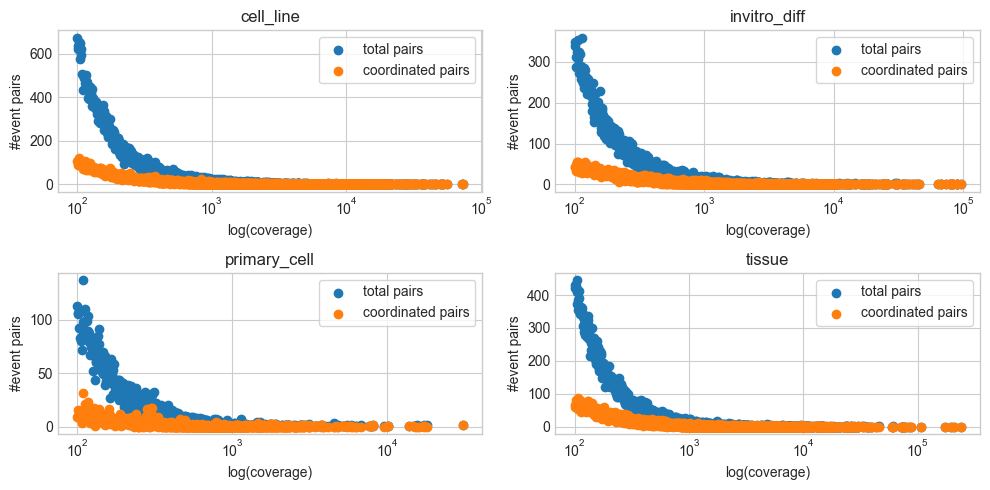

In [82]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov(tabl_dict[k],title=k,ax=axs[loc[i]])
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_sample_type.png")

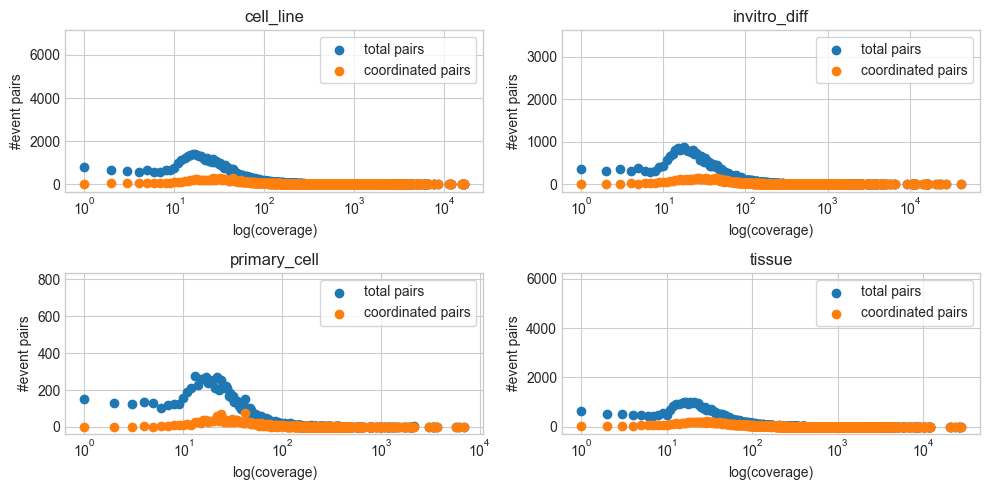

In [83]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_minmar_sample_type.png")

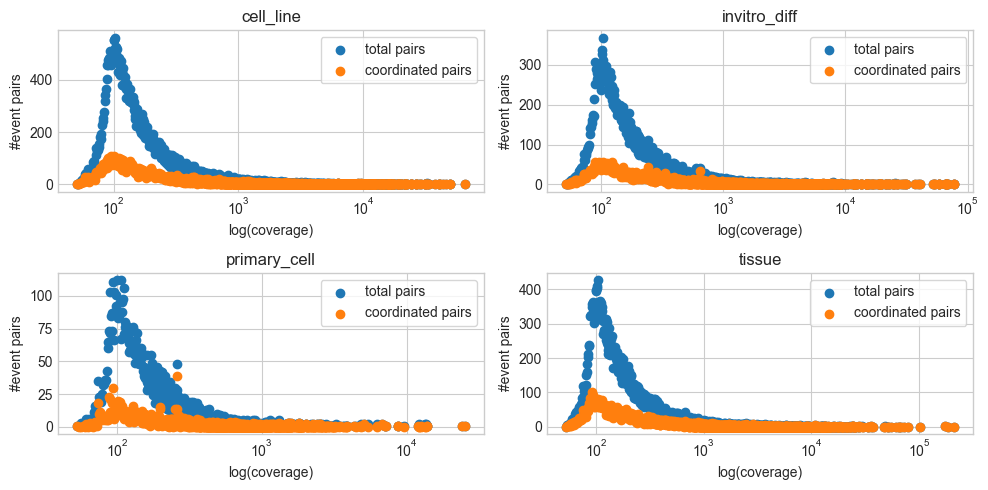

In [84]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="max")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_maxmar_sample_type.png")

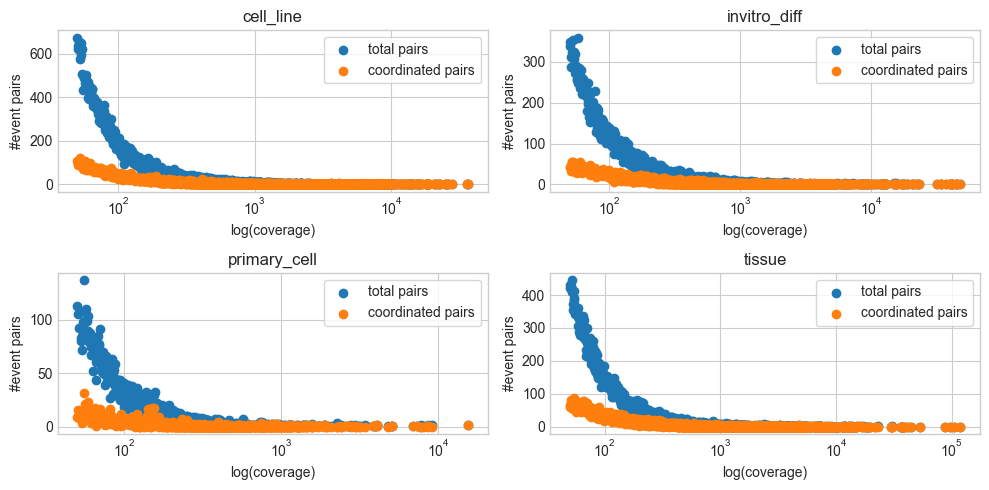

In [85]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_meanmar_sample_type.png")

In [86]:
def plot_cov_bin(coor_tbl,significance=0.05,event_types=None,step=0.05,ax=None,title="",
                 color="green",cov_type="std"):
    
    cov=[get_cov(r,cov_type) for i,r in coor_tbl.iterrows()]

    coor_tbl["coverage"]=cov
    bins=coor_tbl["coverage"].quantile(np.arange(0,1+step,step))
    coor_tbl["cov_bins"]=pd.cut(x=coor_tbl.coverage,bins=bins,duplicates="drop")
    gb_obj=coor_tbl.groupby("cov_bins")
    x=gb_obj.mean()["coverage"]
    n=gb_obj.size()

    coor_tbl_sig=coor_tbl.loc[coor_tbl.adj_p_value<significance]
    
    label=None
    if event_types is not None:
        # filter indeces
        i_filter_l=[r.ase1_type in event_types for i,r in coor_tbl.iterrows()]
        i_filter_r=[r.ase2_type in event_types for i,r in coor_tbl.iterrows()]         
        i_filter=np.array(i_filter_l) & np.array(i_filter_r)
        
        coor_tbl=coor_tbl.loc[i_filter]
        gb_obj=coor_tbl.groupby("cov_bins")
        n=gb_obj.size()
        
        i_filter_l=[r.ase1_type in event_types for i,r in coor_tbl_sig.iterrows()]
        i_filter_r=[r.ase2_type in event_types for i,r in coor_tbl_sig.iterrows()]         
        i_filter=np.array(i_filter_l) & np.array(i_filter_r)
        
        coor_tbl_sig=coor_tbl_sig.loc[i_filter]
        label=', '.join(event_types)

    s=coor_tbl_sig.groupby("cov_bins").size()
    
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
    
    ax.plot(x,s/n,color=color,label=label)
    ax.set_title(title)
    ax.set_xlabel("coverage")
    ax.set_ylabel("fraction of coordinated pairs")
    
    if event_types is not None:
        ax.legend(frameon=True)

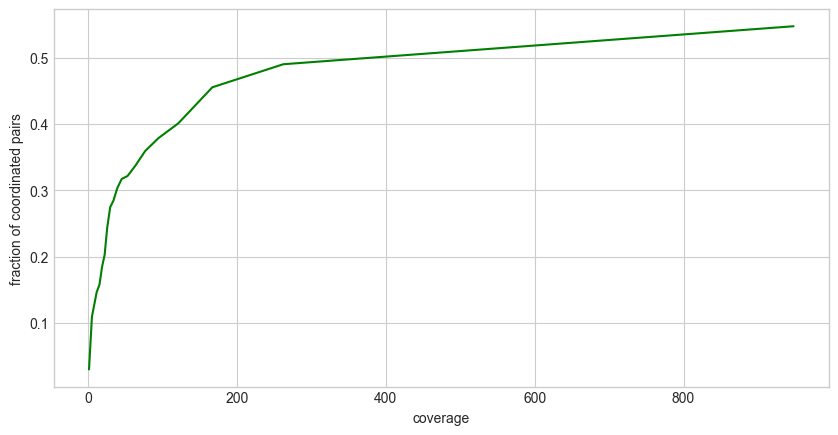

In [87]:
plot_cov_bin(coor_tissue,cov_type="min")

In [88]:
def plot_cov_bin_labeled(coor_tbl,significance=0.05,event_types=None,step=0.05,
                         ax=None,title="",cov_type="std"):
    
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
        
    for c,es in [('green',['IR','TSS','PAS']),('coral',['ES','ME','5AS','3AS'])]:
        plot_cov_bin(coor_tbl,cov_type=cov_type,title=title,ax=ax, event_types=es, color=c)

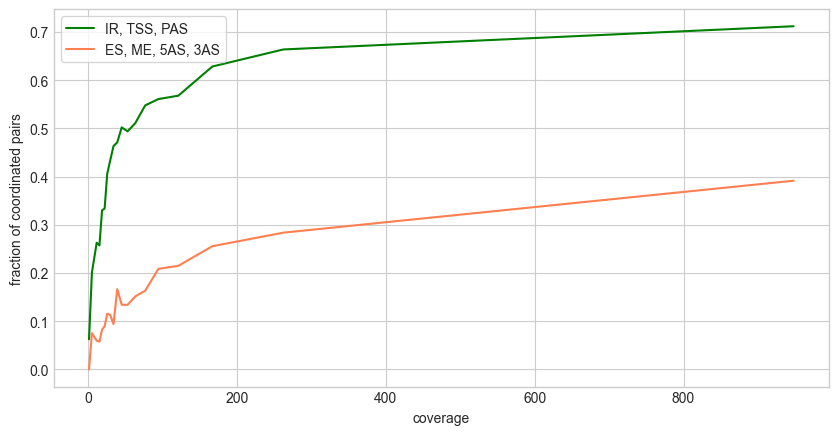

In [89]:
#fig,ax=plt.subplots(figsize=(10,5))

plot_cov_bin_labeled(coor_tissue,cov_type="min")

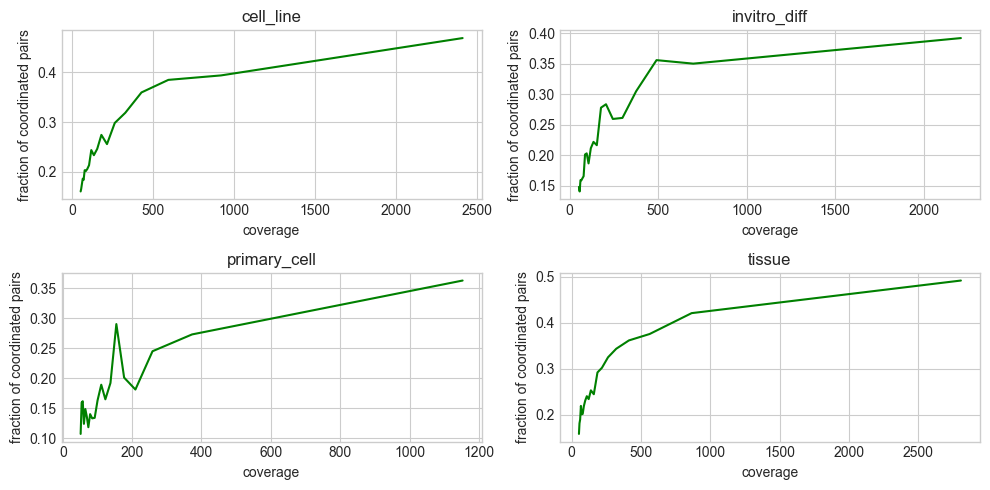

In [67]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov_bin(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_meanmar_sample_type.png")

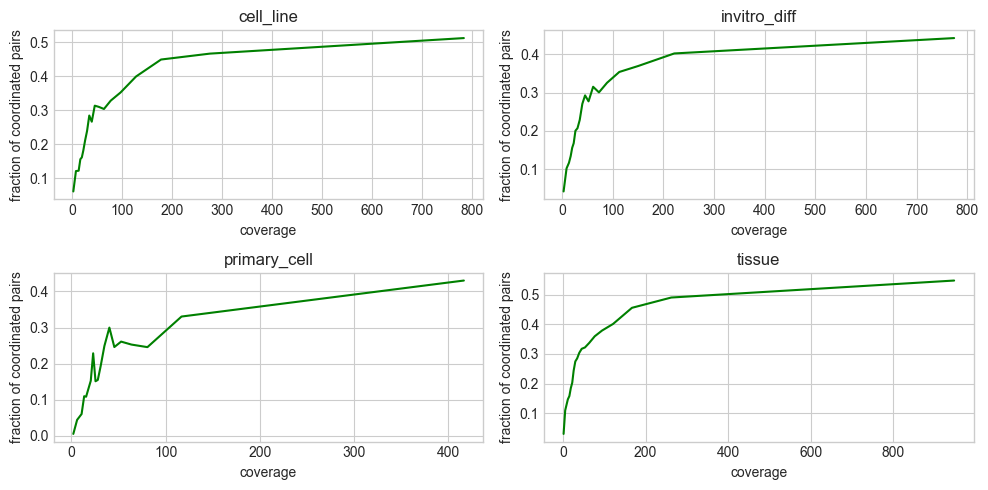

In [68]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov_bin(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_minmar_sample_type.png")

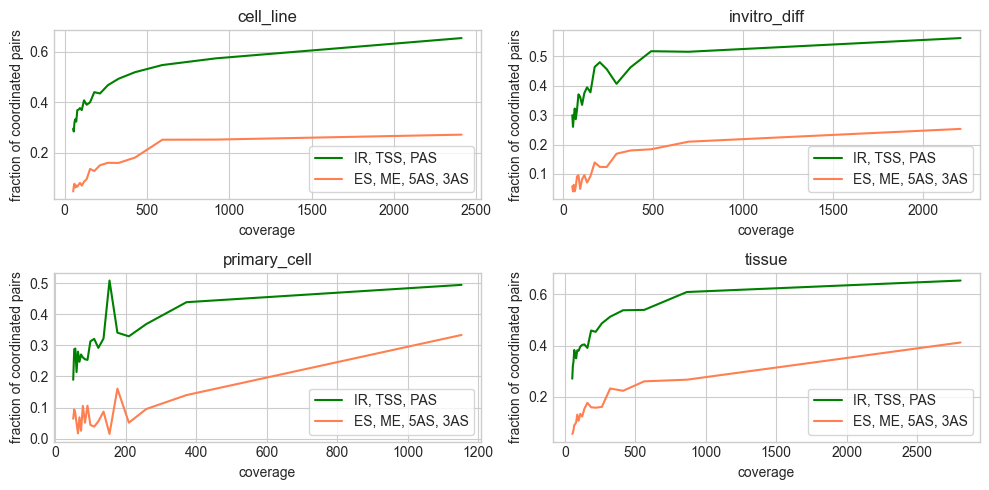

In [90]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov_bin_labeled(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_meanmar_sample_type.png")

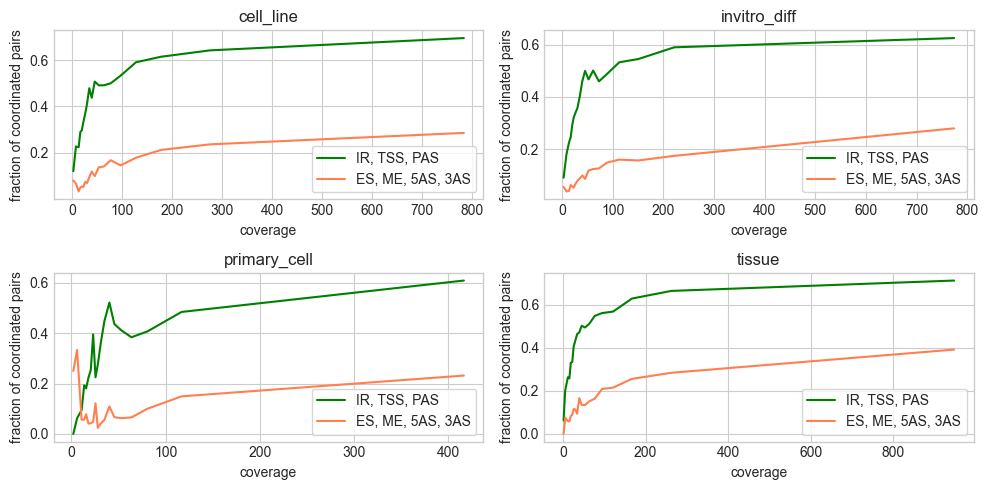

In [91]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov_bin_labeled(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_minmar_sample_type.png")

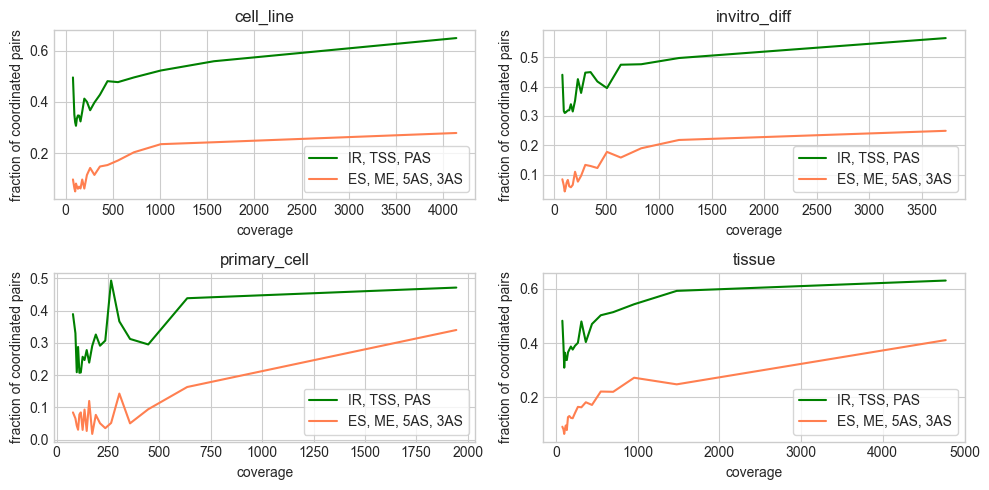

In [92]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov_bin_labeled(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="max")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_maxmar_sample_type.png")

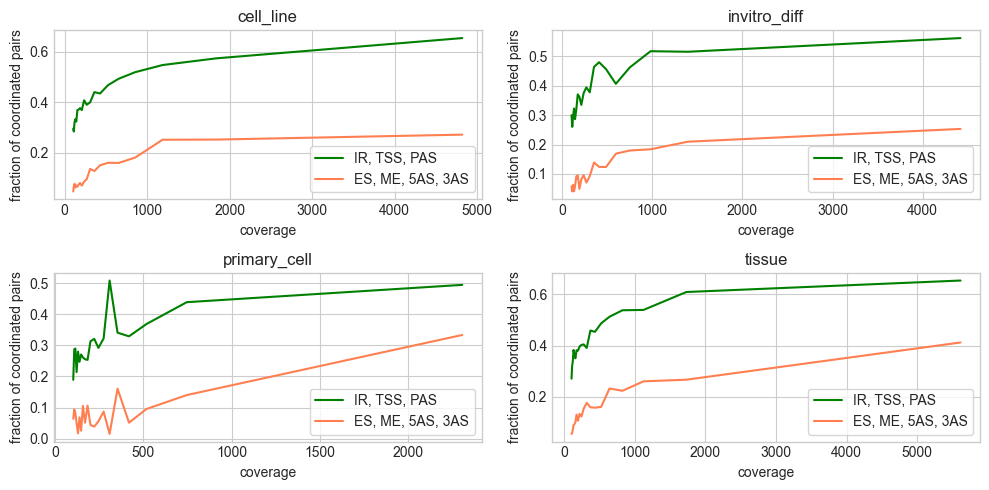

In [93]:
fig,axs=plt.subplots(figsize=(10,5),nrows=2,ncols=2)

loc=((0,0),(0,1),(1,0),(1,1))
i=0

for k in tabl_dict.keys():
    plot_cov_bin_labeled(tabl_dict[k],title=k,ax=axs[loc[i]],cov_type="std")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_stdmar_sample_type.png")

## Intersection event pairs

In [34]:
def make_event_ids(coor_tbl,progress_bar=True,filter_out=[]):
    
    event_ids=[]
    
    if progress_bar==True:
        for i,r in tqdm(coor_tbl.iterrows(),total=coor_tbl.shape[0]):
            if (r.ase1_type not in filter_out) & (r.ase2_type not in filter_out):
                event_ids.append(':'.join([r.ase1_type,r.ase2_type,str(r.ase1_start),
                                           str(r.ase1_end),str(r.ase2_start),str(r.ase2_end)]))
    else:
        for i,r in coor_tbl.iterrows():
            if (r.ase1_type not in filter_out) & (r.ase2_type not in filter_out):
                event_ids.append(':'.join([r.ase1_type,r.ase2_type,str(r.ase1_start),
                                           str(r.ase1_end),str(r.ase2_start),str(r.ase2_end)]))
        
    return event_ids

In [20]:
tissue_ids=make_event_ids(coor_tissue)

  0%|          | 0/64484 [00:00<?, ?it/s]

In [32]:
tissue_ids_filtered=make_event_ids(coor_tissue, filter_out=["TSS","PAS"])

  0%|          | 0/64484 [00:00<?, ?it/s]

In [35]:
def make_group_ids(tabl_dict,filter_out=[],progress_bar=True):
    group_ids={}
    
    if progress_bar==True:
        for k in tqdm(tabl_dict.keys()):
            group_ids[k]=make_event_ids(tabl_dict[k],filter_out=filter_out,progress_bar=False)
    else:
        for k in tabl_dict.keys():
            group_ids[k]=make_event_ids(tabl_dict[k],filter_out=filter_out,progress_bar=False)
    return group_ids

In [24]:
sample_type_ids=make_group_ids(tabl_dict)

  0%|          | 0/4 [00:00<?, ?it/s]

In [36]:
sample_type_ids_filtered=make_group_ids(tabl_dict,filter_out=["TSS","PAS"])

  0%|          | 0/4 [00:00<?, ?it/s]

In [37]:
def set_share(a,b,method="std"):
    
    if method=="std":
        res=(len(a)*len(a & b)+len(b)*len(a & b))/(2*len(a)*len(b))
    
    if method=="min":
        res=len(a & b) / min(len(a),len(b))
    
    if method=="union":
        res=len(a&b) /len(a|b)
    
    return res

In [39]:
def intersection_map(tabl_dict,group_ids=None,filter_out=[],figsize=(10,10),method="std"):
    
    if group_ids is None:
        group_ids=make_group_ids(tabl_dict,filter_out=filter_out)
        
    d={k:[] for k in tabl_dict.keys()}
    keys=list(d.keys())
    
    for r in itertools.product(keys,keys):
        #entry=len((set(group_ids[r[0]]) & set(group_ids[r[1]])))/len((set(group_ids[r[0]]) | set(group_ids[r[1]])))
        #entry=len((set(group_ids[r[0]]) & set(group_ids[r[1]])))/min(len((set(group_ids[r[0]]))),len(set(group_ids[r[1]])))
        entry=set_share(set(group_ids[r[0]]), set(group_ids[r[1]]), method=method)
        d[r[0]].append(entry)
        
    df=pd.DataFrame(d,index=keys)
    
    sns.clustermap(df,figsize=figsize)

  0%|          | 0/4 [00:00<?, ?it/s]

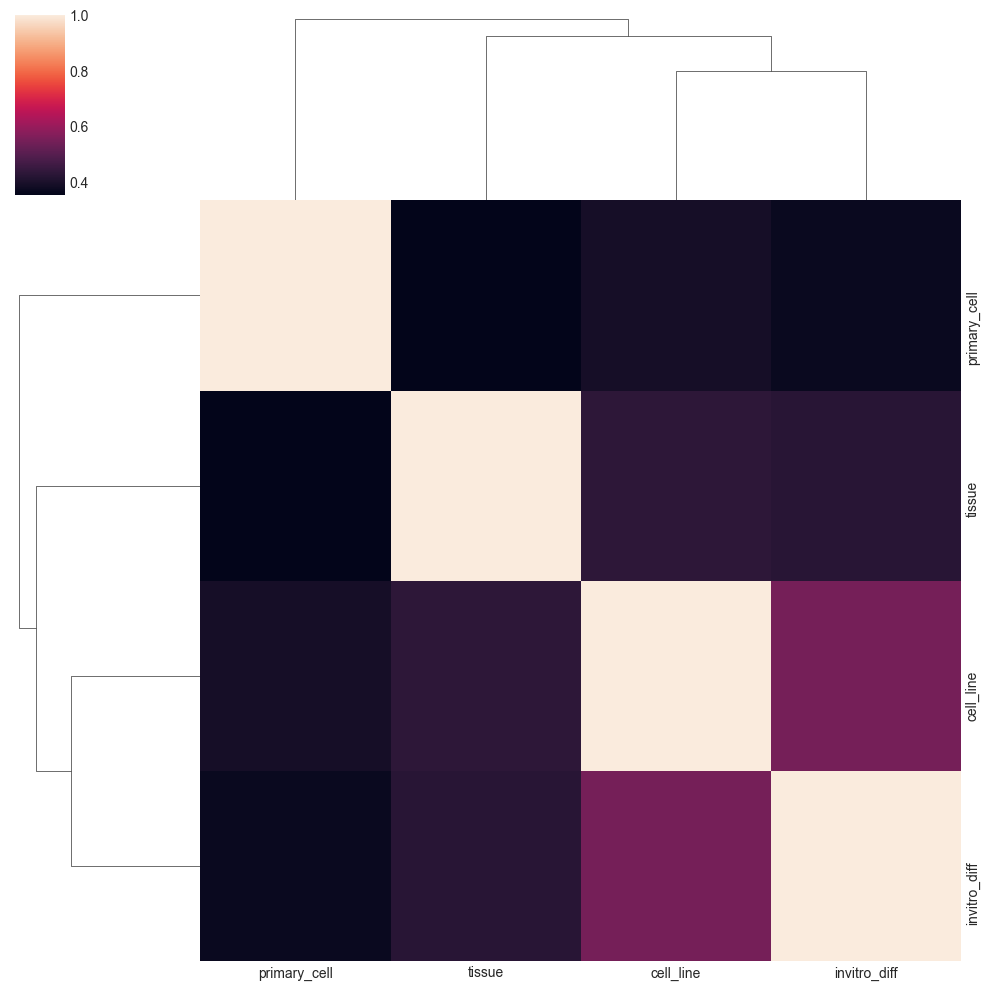

In [30]:
#cm=sns.clustermap(df)
cm=intersection_map(tabl_dict)
plt.savefig(figures+"cluster_map_sample_type.png")

  0%|          | 0/4 [00:00<?, ?it/s]

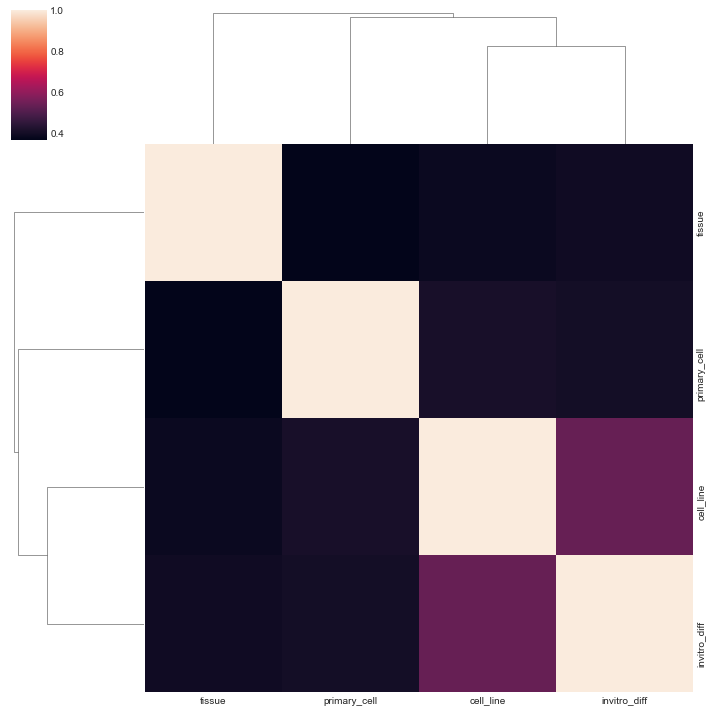

In [40]:
cm=intersection_map(tabl_dict,filter_out=["PAS","TSS"])

# Tissues

In [17]:
tissue_names=list(set(stbl[stbl.sample_type=="tissue"].sample_subtype))

In [18]:
groups={}

for tissue in tissue_names:
    groups[tissue]=list(stbl.name[stbl.sample_subtype==tissue])

In [33]:
import pickle

try:
    with open("./events_dict.pkl","rb") as f:
        events_dict=pickle.load(f)
    
except FileNotFoundError:
    events_dict=isoseq.precompute_events_dict(event_type=("ES","3AS", "5AS","IR","ME", "TSS", "PAS"))
    with open("./events_dict.pkl","wb") as f:
        pickle.dump(events_dict,f)

KeyboardInterrupt: 

In [19]:
tbl_path="./tables/tissue/"
files=[x.name for x in Path(tbl_path).iterdir()]

tissue_dict={}

for tissue in tissue_names:
    
    tissue_key=tissue.replace(' ','_')
    fname=tissue_key+'.csv'
    
    if fname not in files:
        logger.info(f"computing {fname}")
        tissue_dict[tissue]=isoseq.coordination_test(samples=groups[tissue], test='fisher',
                                                     events_dict=events_dict,query="not NOVEL_GENE")
        tissue_dict[tissue].to_csv(tbl_path+fname,index=False)
    else:
        logger.info(f"reading {fname}")
        tissue_dict[tissue]=pd.read_csv(tbl_path+fname)
        eval_trid(tissue_dict[tissue])

INFO:reading mesenteric_fat_pad.csv
INFO:reading aorta.csv
INFO:reading upper_lobe_of_right_lung.csv
INFO:reading right_cardiac_atrium.csv
INFO:reading cardiac_septum.csv
INFO:reading heart_left_ventricle.csv
INFO:reading posterior_vena_cava.csv
INFO:reading Right_ventricle_myocardium_superior.csv
INFO:reading left_ventricle_myocardium_inferior.csv
INFO:reading left_cardiac_atrium.csv
INFO:reading adrenal_gland.csv
INFO:reading heart_right_ventricle.csv
INFO:reading psoas_muscle.csv
INFO:reading ovary.csv
INFO:reading left_ventricle_myocardium_superior.csv
INFO:reading kidney.csv
INFO:reading Right_ventricle_myocardium_inferior.csv
INFO:reading lower_lobe_of_left_lung.csv
INFO:reading lower_lobe_of_right_lung.csv
INFO:reading left_colon.csv
INFO:reading mucosa_of_descending_colon.csv


## General stats

In [15]:
for k in tissue_dict.keys():
    print(f"=== {k} ===")
    coor_stats(tissue_dict[k])

=== lower lobe of left lung ===
total pairs: 6271 in 1485 genes
coordinated pairs: 1375 (21.93%) in 573 genes

=== right cardiac atrium ===
total pairs: 10726 in 2250 genes
coordinated pairs: 2024 (18.87%) in 836 genes

=== left cardiac atrium ===
total pairs: 788 in 198 genes
coordinated pairs: 170 (21.57%) in 72 genes

=== adrenal gland ===
total pairs: 1866 in 504 genes
coordinated pairs: 409 (21.92%) in 141 genes

=== lower lobe of right lung ===
total pairs: 2554 in 752 genes
coordinated pairs: 576 (22.55%) in 268 genes

=== posterior vena cava ===
total pairs: 2273 in 679 genes
coordinated pairs: 456 (20.06%) in 249 genes

=== heart left ventricle ===
total pairs: 7328 in 1630 genes
coordinated pairs: 1255 (17.13%) in 587 genes

=== Right ventricle myocardium inferior ===
total pairs: 424 in 134 genes
coordinated pairs: 48 (11.32%) in 24 genes

=== left ventricle myocardium inferior ===
total pairs: 1744 in 446 genes
coordinated pairs: 190 (10.89%) in 79 genes

=== Right ventricl

In [60]:
figures="figures/tissue/"
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 200
plt.style.use("seaborn-whitegrid")

/scratch/local/ipykernel_48957/3158205155.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(snames, rotation=rotation, ha=ha)


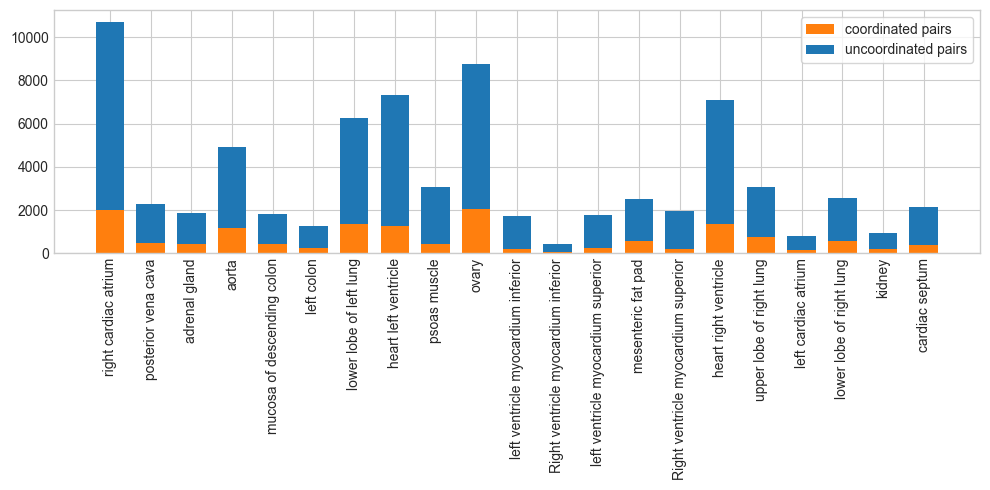

In [26]:
fig,ax=plt.subplots(figsize=(10,5))
bar_events(tissue_dict,ax=ax,rotation=90)
fig.tight_layout()
plt.savefig(figures+"bar_tissue_prop.png")

In [31]:
pair_counts_dict={}

for k in tissue_dict.keys():
    logger.info(f"computing pairs for {k}")
    pair_counts_dict[k]=count_event_pairs(tissue_dict[k])

INFO:computing pairs for right cardiac atrium


  0%|          | 0/28 [00:00<?, ?it/s]

INFO:computing pairs for posterior vena cava


  0%|          | 0/28 [00:00<?, ?it/s]

INFO:computing pairs for adrenal gland


  0%|          | 0/28 [00:00<?, ?it/s]

INFO:computing pairs for aorta


  0%|          | 0/28 [00:00<?, ?it/s]

INFO:computing pairs for mucosa of descending colon


  0%|          | 0/28 [00:00<?, ?it/s]

INFO:computing pairs for left colon


  0%|          | 0/28 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [37]:
batch_heart=[k for k in tissue_dict.keys() if "card" in k or "ventr" in k]
batch_lung=[k for k in tissue_dict.keys() if "lung" in k]
batch_mix=list(set(tissue_dict.keys())-set(batch_heart)-set(batch_lung))

In [38]:
plt.rc("xtick",labelsize=6)

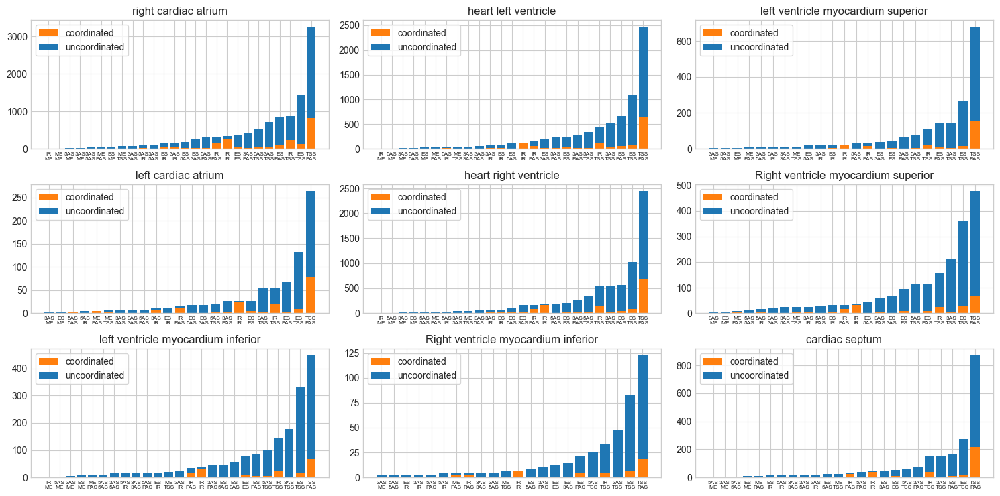

In [94]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_tissue_heart.png")
plt.savefig(figures+"bar_tissue_heart.pdf") # for printing

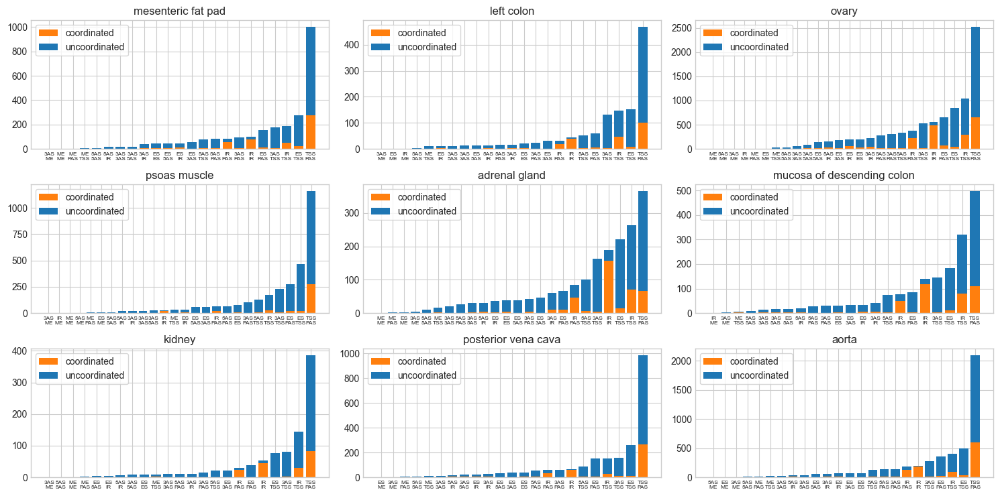

In [95]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(3),range(3)))
i=0
for k in batch_mix:
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_tissue_mix.png")
plt.savefig(figures+"bar_tissue_mix.pdf") # for printing

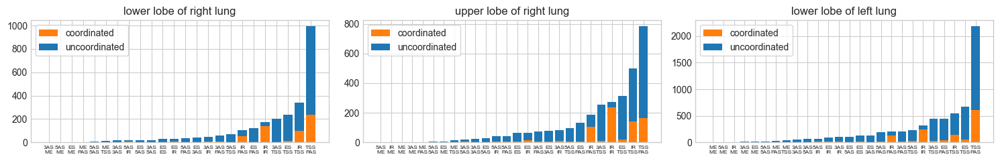

In [96]:
fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    bar_event_pairs(pair_counts_dict[k],ax=axs[i],title=k)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_tissue_lung.png")
plt.savefig(figures+"bar_tissue_lung.pdf") # for printing

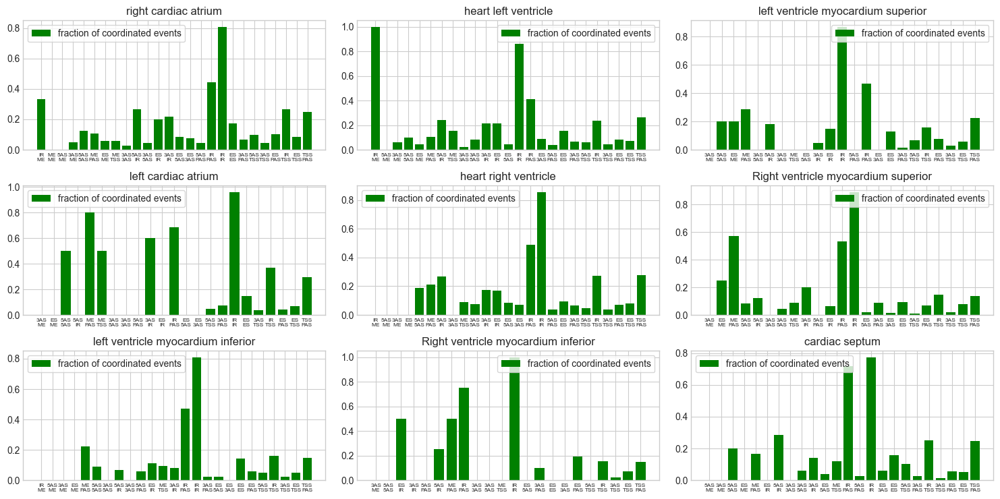

In [97]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,frac=True)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_frac_tissue_heart.png")
plt.savefig(figures+"bar_frac_tissue_heart.pdf") # for printing

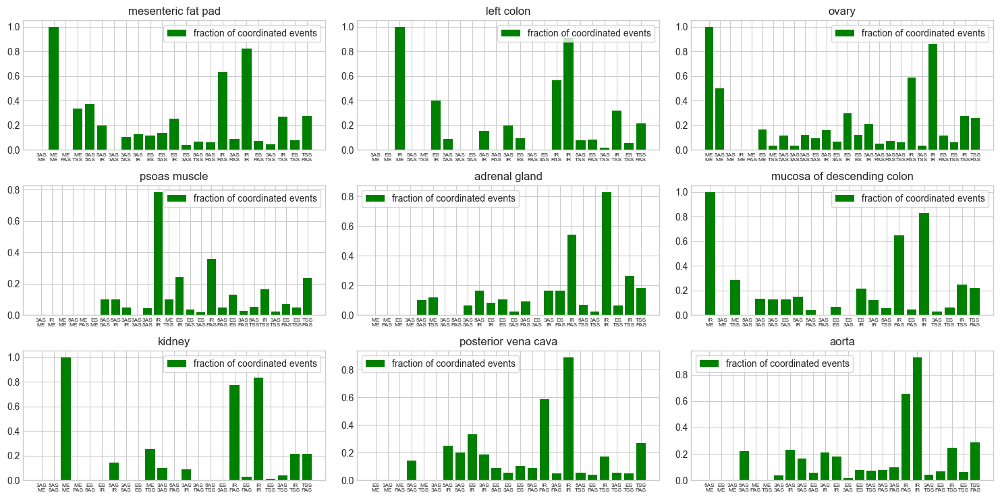

In [98]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(3),range(3)))
i=0
for k in batch_mix:
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,frac=True)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_frac_tissue_mix.png")
plt.savefig(figures+"bar_frac_tissue_mix.pdf") # for printing

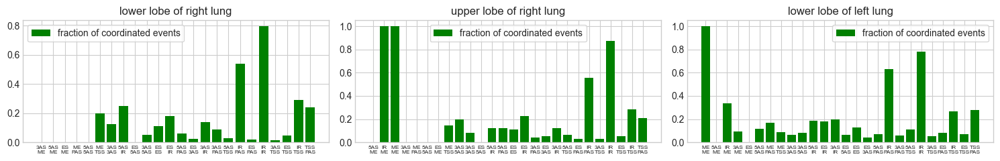

In [99]:
fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    bar_event_pairs(pair_counts_dict[k],ax=axs[i],title=k,frac=True)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_frac_tissue_lung.png")
plt.savefig(figures+"bar_frac_tissue_lung.pdf") # for printing

For print

In [100]:
plt.rc("xtick",labelsize=10)

In [101]:
ipt=[x[1] for x in pair_counts_dict["aorta"] if x[1][0] in ("TSS","PAS","IR") or x[1][1] in ("TSS","PAS","IR")]

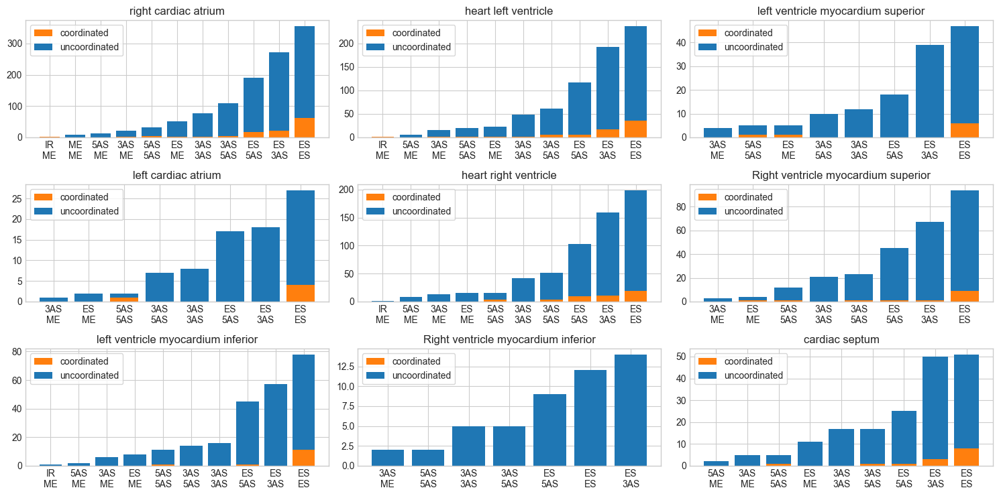

In [102]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,filter_out=ipt)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_tissue_heart_filtered.png")

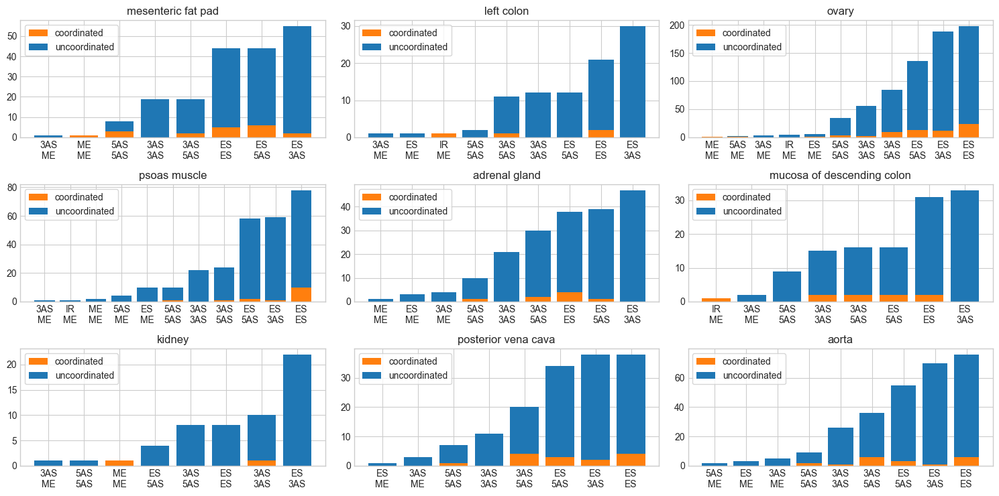

In [103]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(3),range(3)))
i=0
for k in batch_mix:
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,filter_out=ipt)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_tissue_mix_filtered.png")

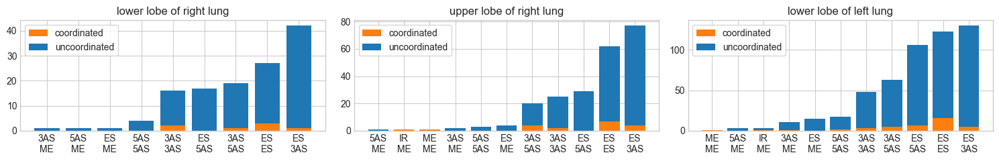

In [106]:
fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    bar_event_pairs(pair_counts_dict[k],ax=axs[i],title=k,filter_out=ipt)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_tissue_lung_filtered.png")

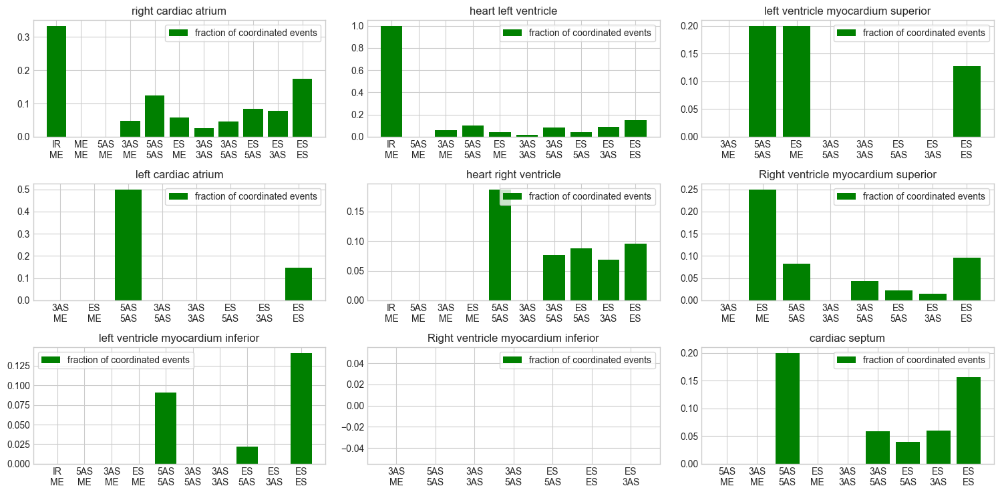

In [107]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,frac=True,filter_out=ipt)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_frac_tissue_heart_filtered.png")

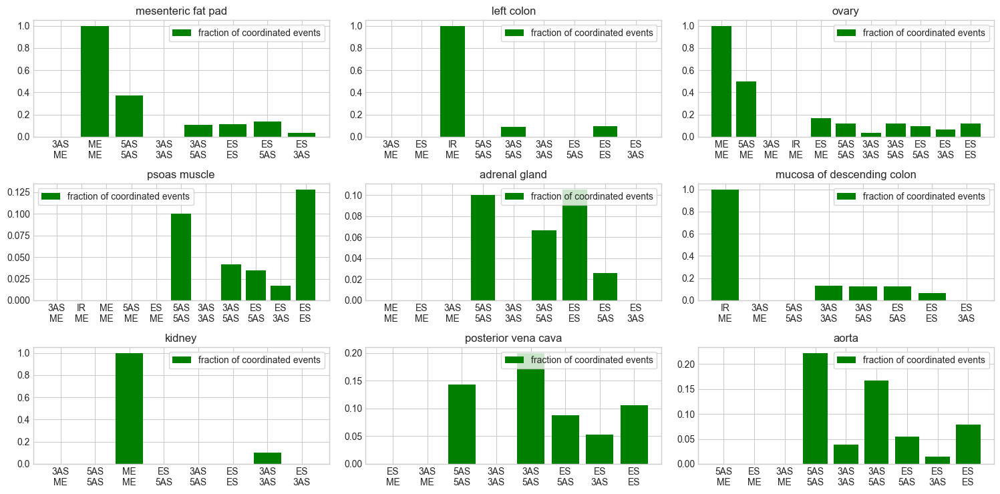

In [108]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(3),range(3)))
i=0
for k in batch_mix:
    bar_event_pairs(pair_counts_dict[k],ax=axs[loc[i]],title=k,frac=True,filter_out=ipt)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_frac_tissue_mix_filtered.png")

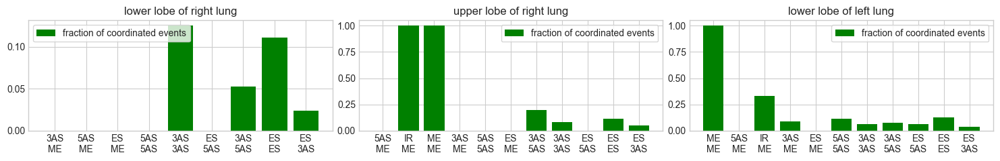

In [109]:
fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    bar_event_pairs(pair_counts_dict[k],ax=axs[i],title=k,frac=True,filter_out=ipt)
    i+=1

fig.tight_layout()
plt.savefig(figures+"bar_frac_tissue_lung_filtered.png")

## Coverage

In [39]:
batch_heart=[k for k in tissue_dict.keys() if "card" in k or "ventr" in k]
batch_lung=[k for k in tissue_dict.keys() if "lung" in k]
batch_mix=list(set(tissue_dict.keys())-set(batch_heart)-set(batch_lung))

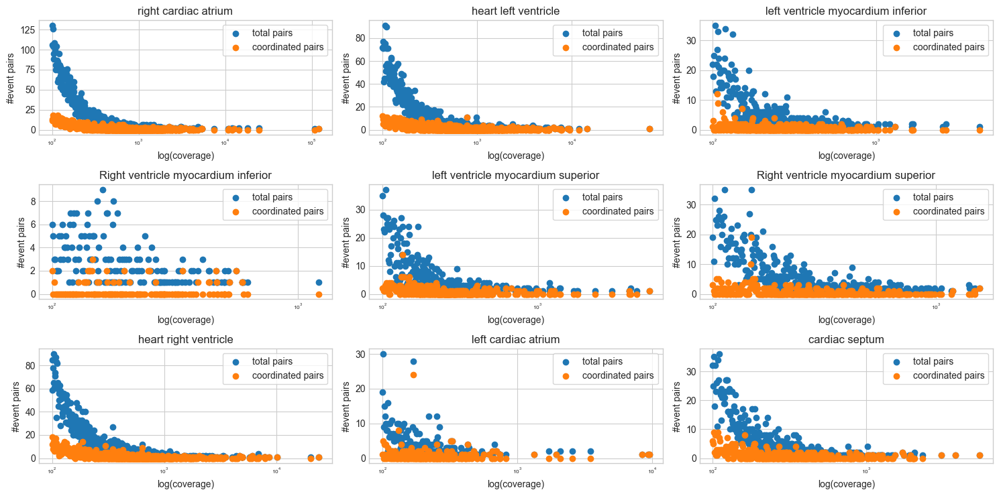

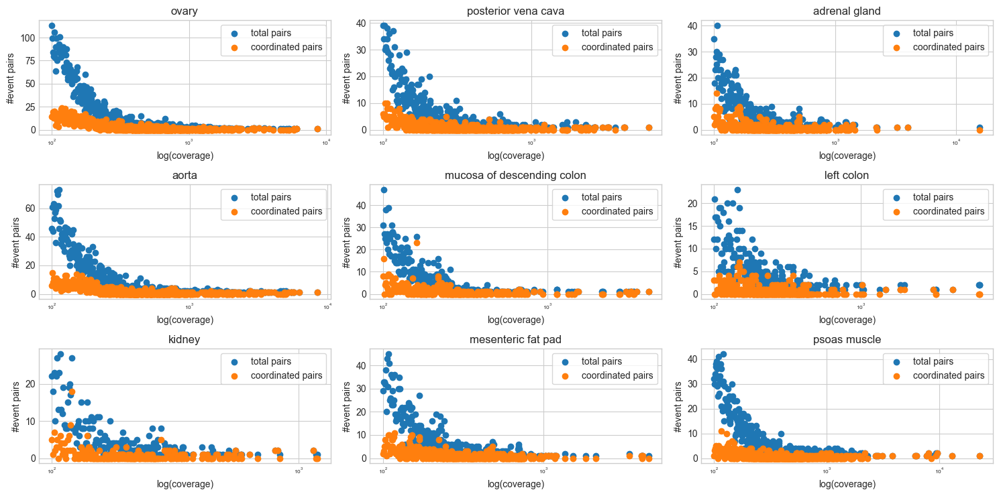

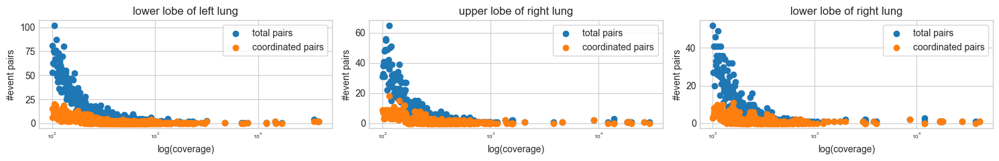

In [40]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    plot_cov(tissue_dict[k],ax=axs[loc[i]],title=k)
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_tissue_heart.png")

fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_mix:
    plot_cov(tissue_dict[k],ax=axs[loc[i]],title=k)
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_tissue_mix.png")

fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    plot_cov(tissue_dict[k],ax=axs[i],title=k)
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_tissue_lung.png")

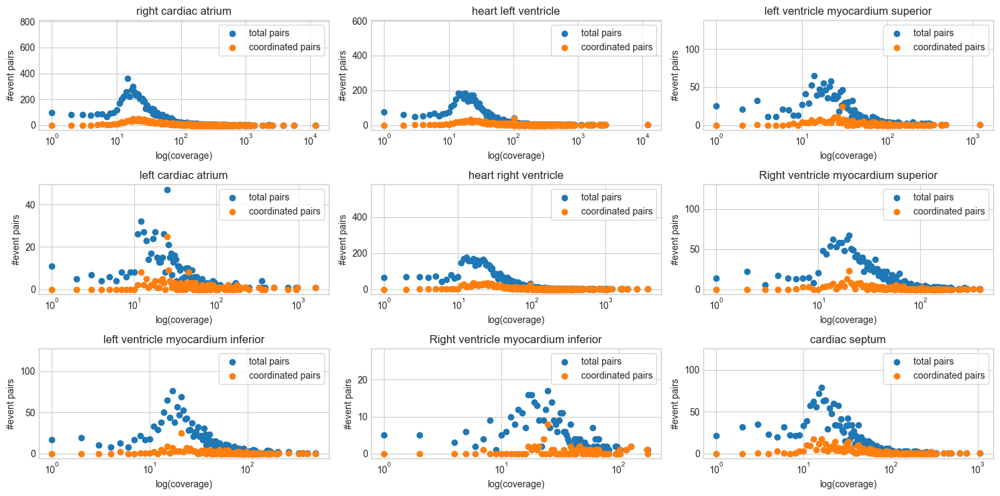

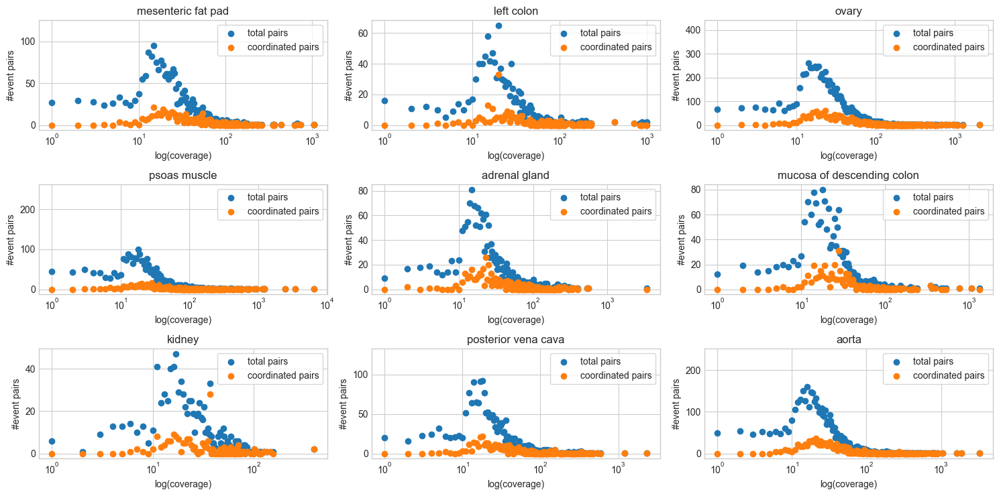

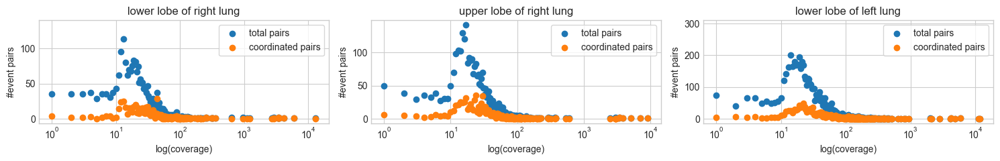

In [112]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    plot_cov(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_minmar_tissue_heart.png")

fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_mix:
    plot_cov(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_minmar_tissue_mix.png")

fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    plot_cov(tissue_dict[k],ax=axs[i],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_minmar_tissue_lung.png")

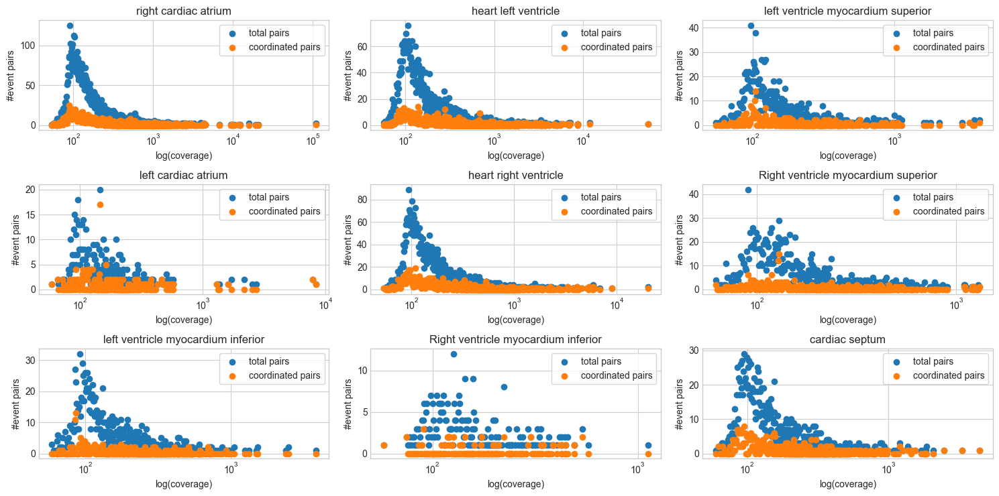

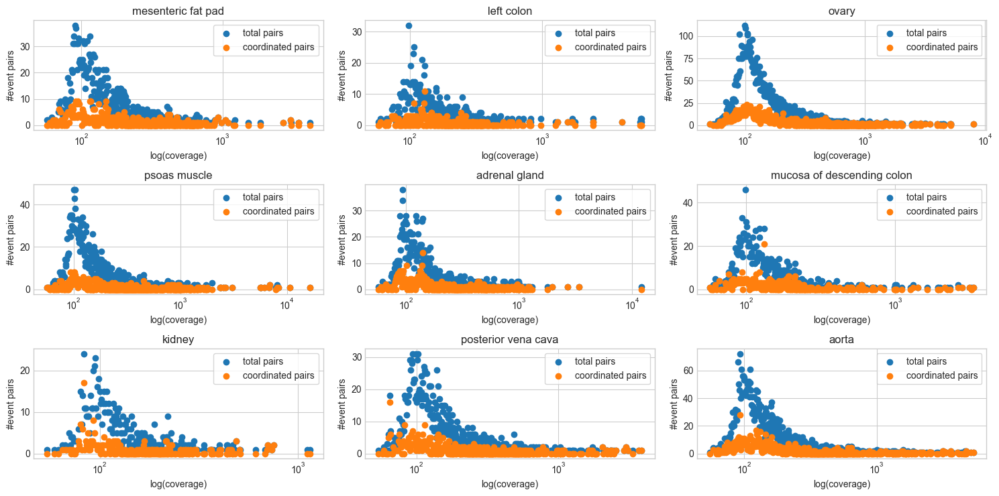

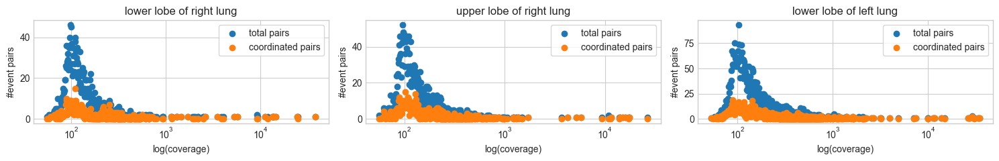

In [113]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    plot_cov(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="max")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_maxmar_tissue_heart.png")

fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_mix:
    plot_cov(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="max")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_maxmar_tissue_mix.png")

fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    plot_cov(tissue_dict[k],ax=axs[i],title=k,cov_type="max")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_maxmar_tissue_lung.png")

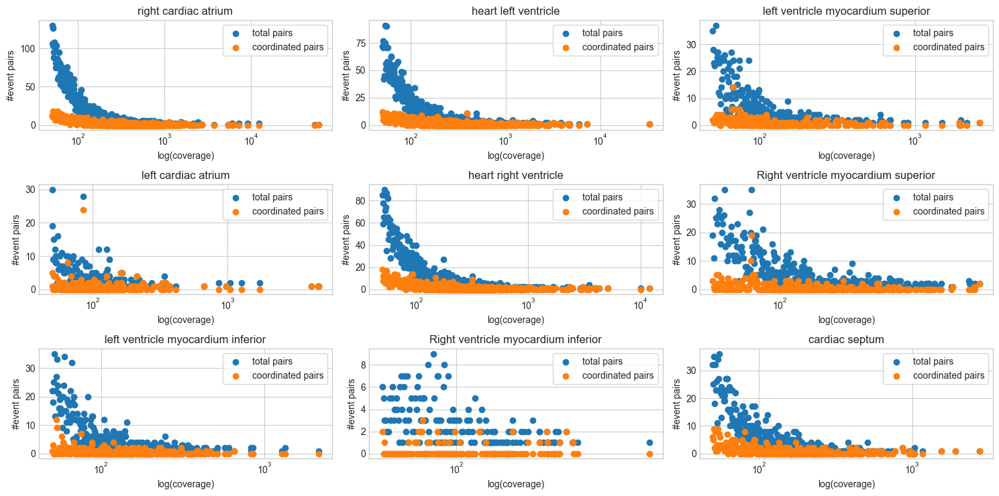

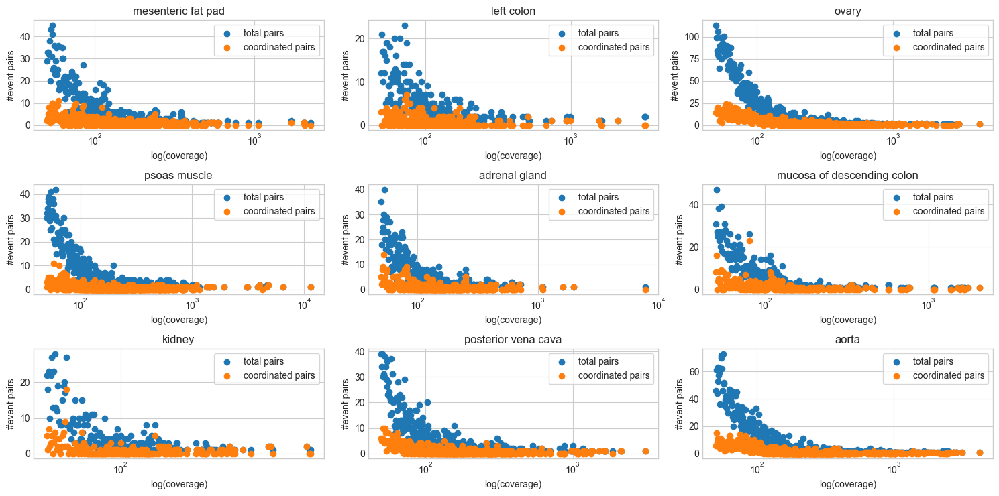

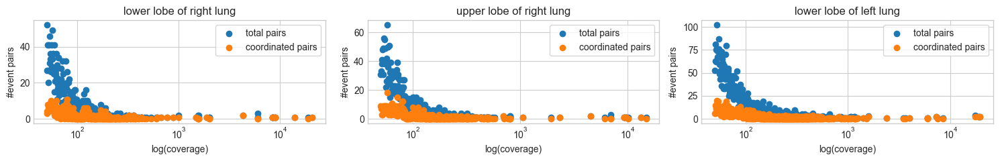

In [114]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    plot_cov(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_meanmar_tissue_heart.png")

fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_mix:
    plot_cov(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_meanmar_tissue_mix.png")

fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    plot_cov(tissue_dict[k],ax=axs[i],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_meanmar_tissue_lung.png")

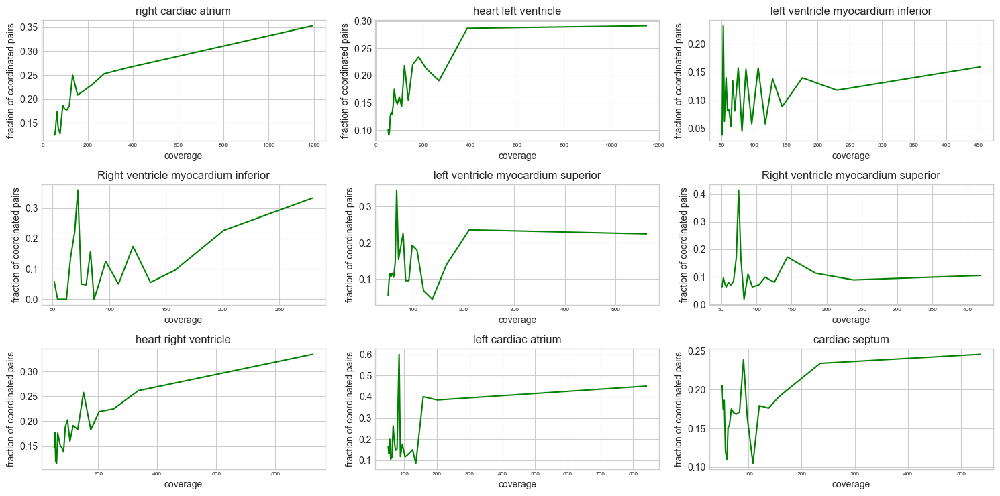

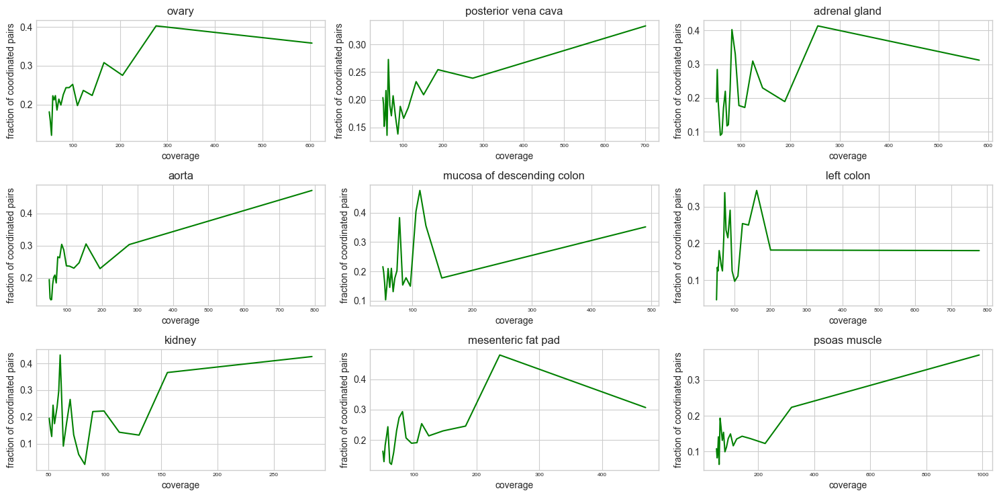

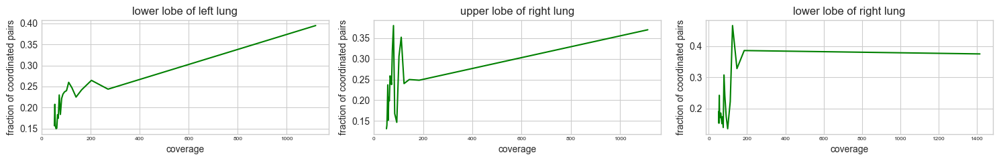

In [41]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    plot_cov_bin(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_meanmar_tissue_heart.png")

fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_mix:
    plot_cov_bin(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_meanmar_tissue_mix.png")

fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    plot_cov_bin(tissue_dict[k],ax=axs[i],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_meanmar_tissue_lung.png")

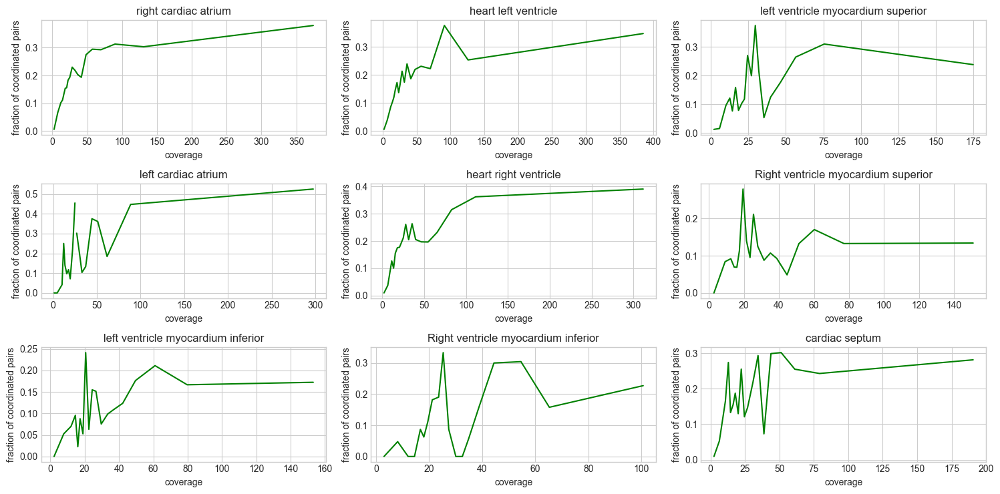

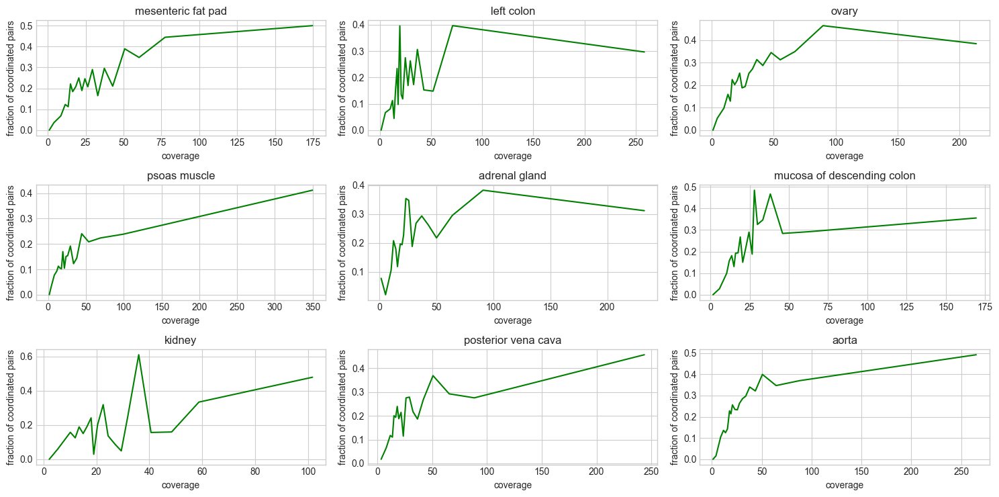

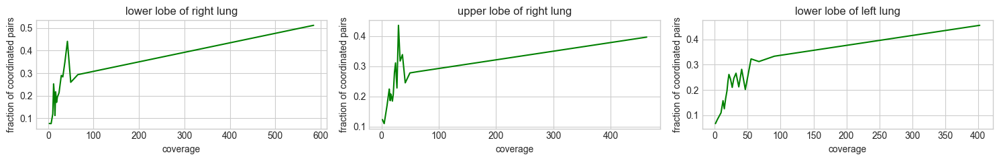

In [116]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    plot_cov_bin(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_minmar_tissue_heart.png")

fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_mix:
    plot_cov_bin(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_minmar_tissue_mix.png")

fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    plot_cov_bin(tissue_dict[k],ax=axs[i],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_minmar_tissue_lung.png")

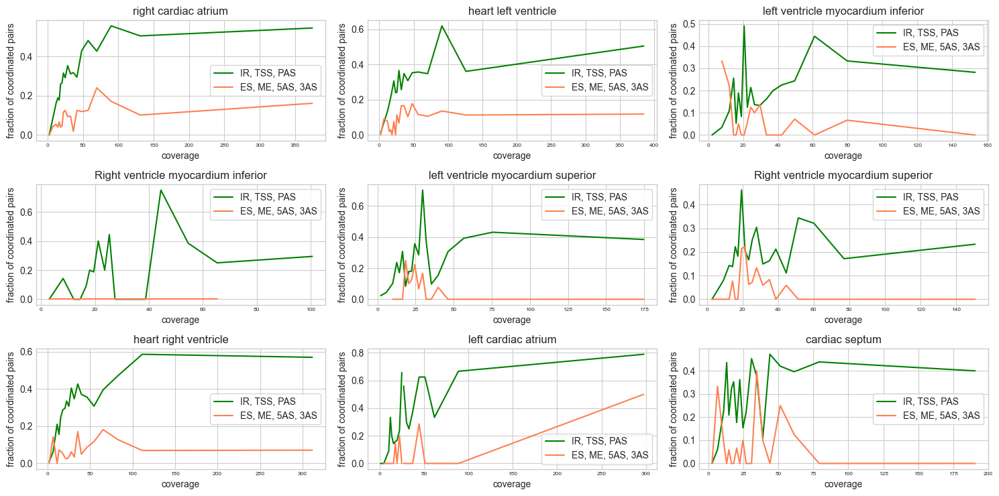

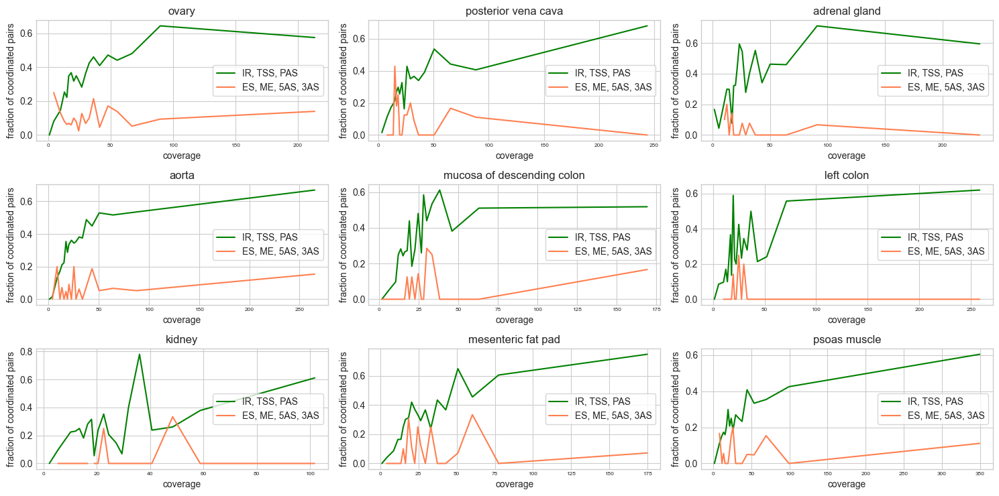

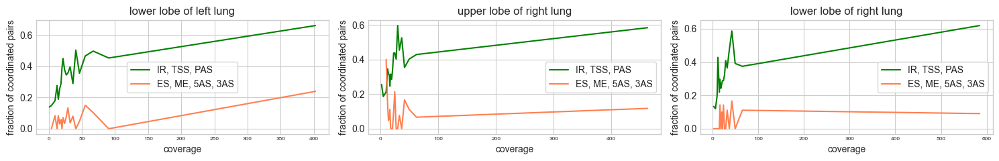

In [42]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    plot_cov_bin_labeled(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_meanmar_tissue_heart.png")

fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_mix:
    plot_cov_bin_labeled(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_meanmar_tissue_mix.png")

fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    plot_cov_bin_labeled(tissue_dict[k],ax=axs[i],title=k,cov_type="mean")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_meanmar_tissue_lung.png")

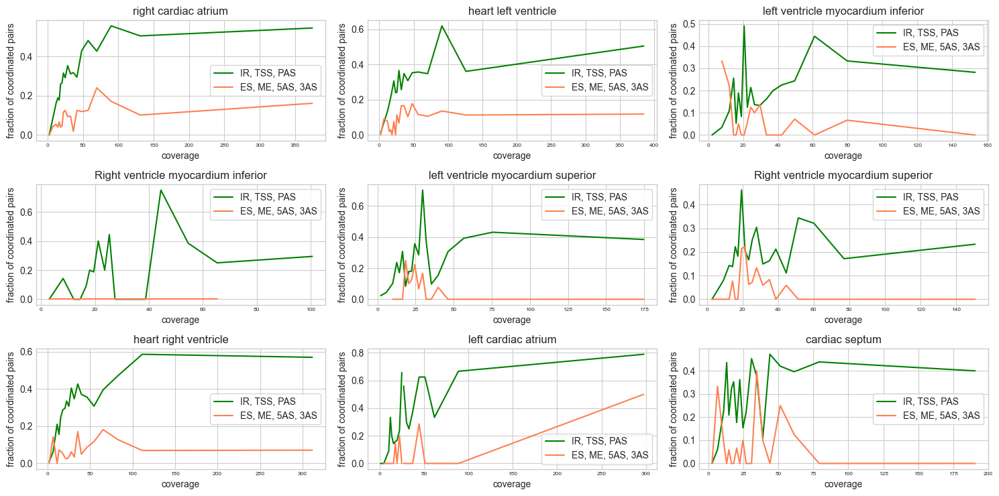

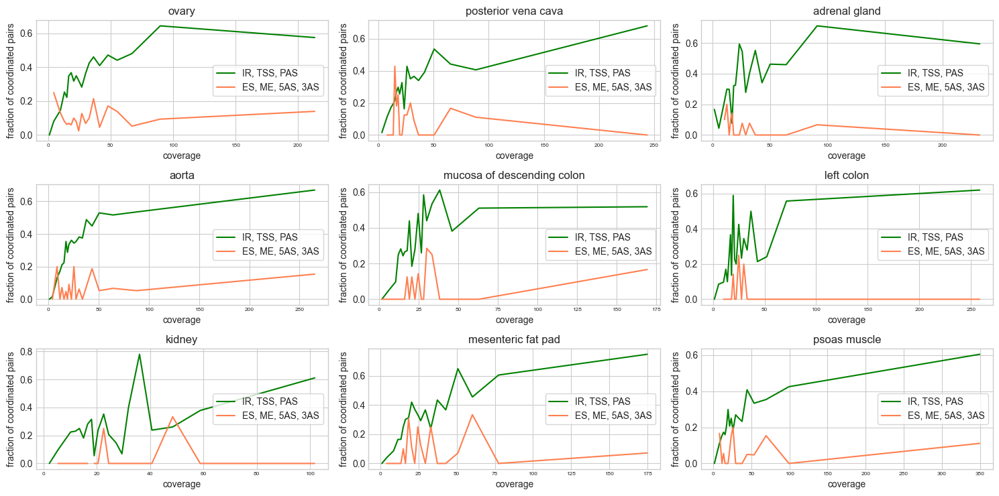

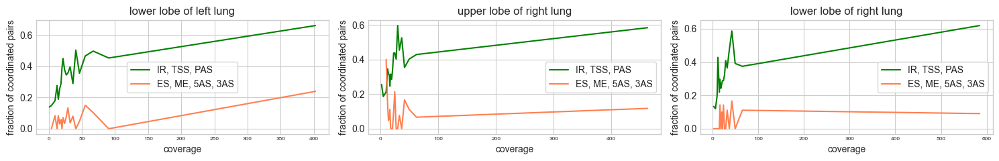

In [43]:
fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_heart:
    plot_cov_bin_labeled(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_minmar_tissue_heart.png")

fig,axs=plt.subplots(figsize=(15,2.5*3),nrows=3,ncols=3)

loc=list(itertools.product(range(7),range(3)))
i=0
for k in batch_mix:
    plot_cov_bin_labeled(tissue_dict[k],ax=axs[loc[i]],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_minmar_tissue_mix.png")

fig,axs=plt.subplots(figsize=(15,2.5),ncols=3)

i=0
for k in batch_lung:
    plot_cov_bin_labeled(tissue_dict[k],ax=axs[i],title=k,cov_type="min")
    i+=1

fig.tight_layout()
plt.savefig(figures+"cov_bin_labeled_minnmar_tissue_lung.png")

## Intersection

In [36]:
tissue_ids=make_group_ids(tissue_dict)

  0%|          | 0/21 [00:00<?, ?it/s]

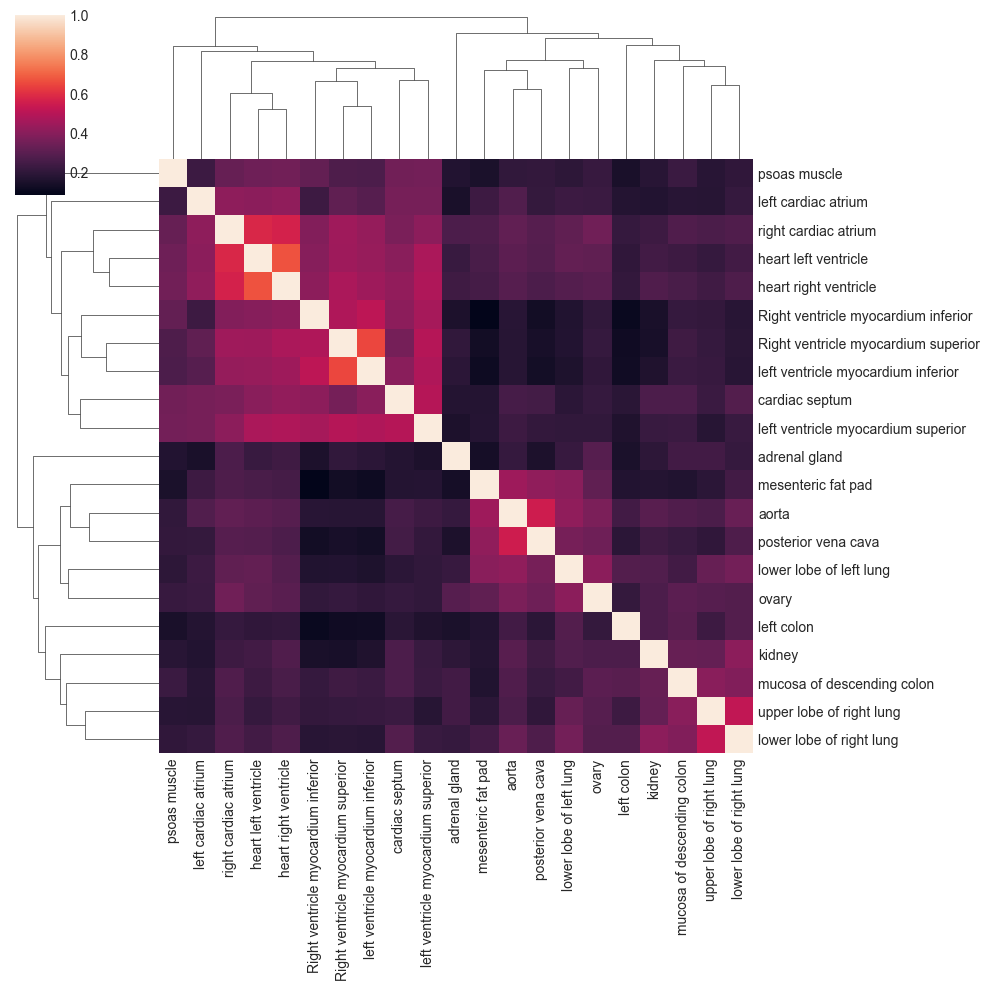

In [37]:
intersection_map(tissue_dict,group_ids=tissue_ids)
plt.savefig(figures+"clustermap_tissue.png")

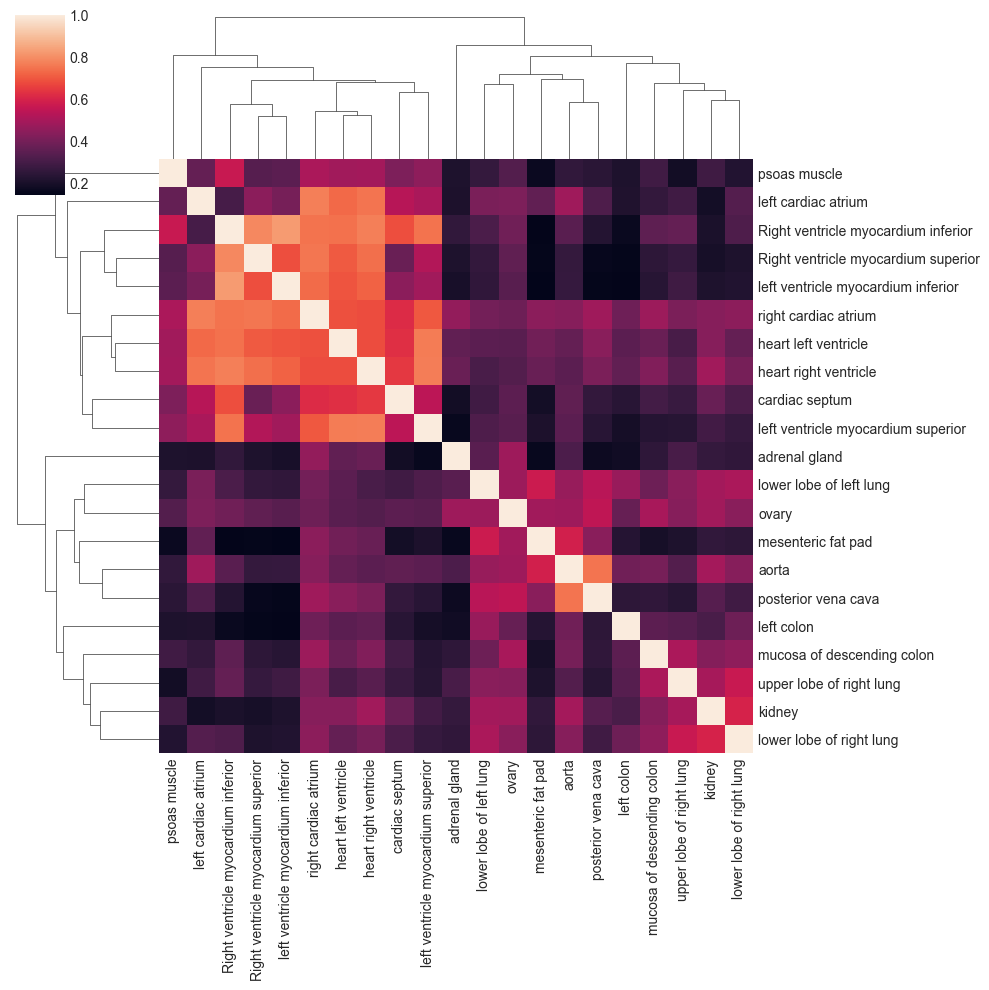

In [38]:
intersection_map(tissue_dict,group_ids=tissue_ids,method="min")
plt.savefig(figures+"clustermap_min_tissue.png")

Without PAS and TSS

In [64]:
tissue_ids=make_group_ids(tissue_dict,filter_out=["TSS","PAS"])

  0%|          | 0/21 [00:00<?, ?it/s]

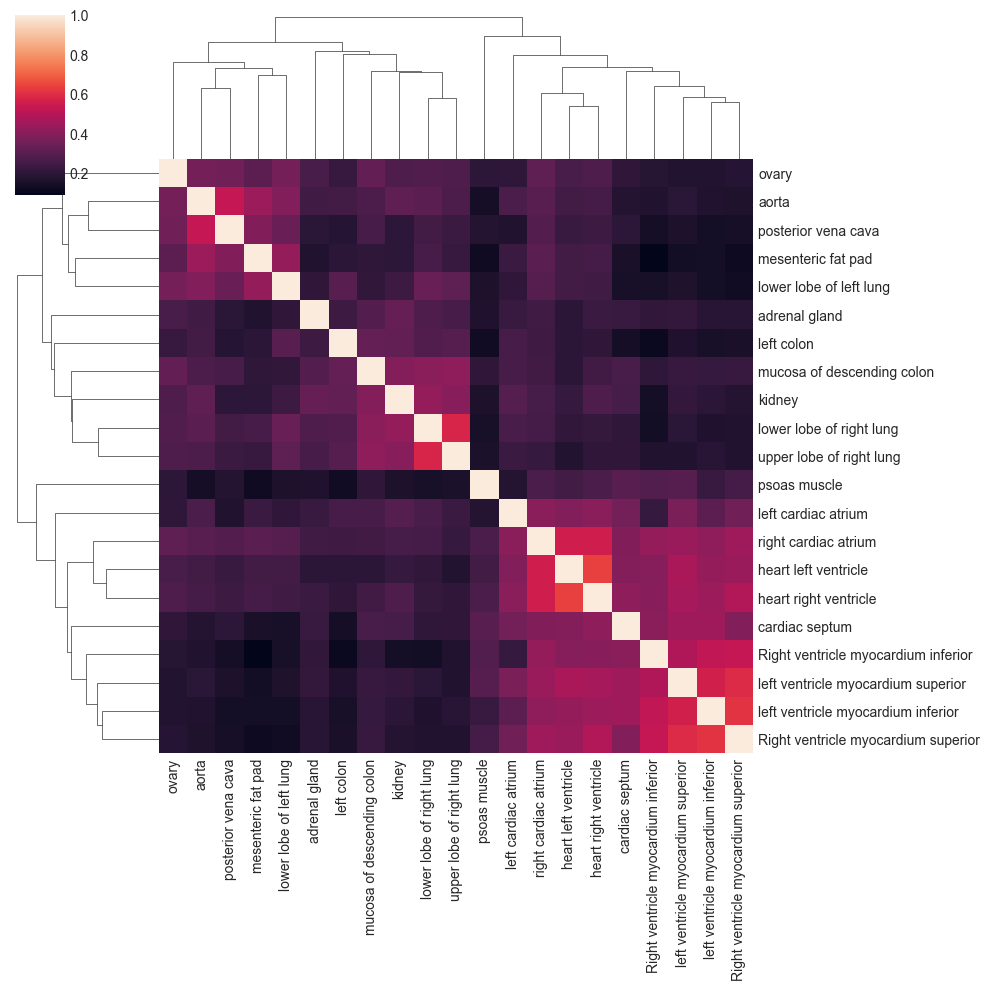

In [65]:
intersection_map(tissue_dict,group_ids=tissue_ids)
plt.savefig(figures+"clustermap_tissue_no_TSS_PAS.png")

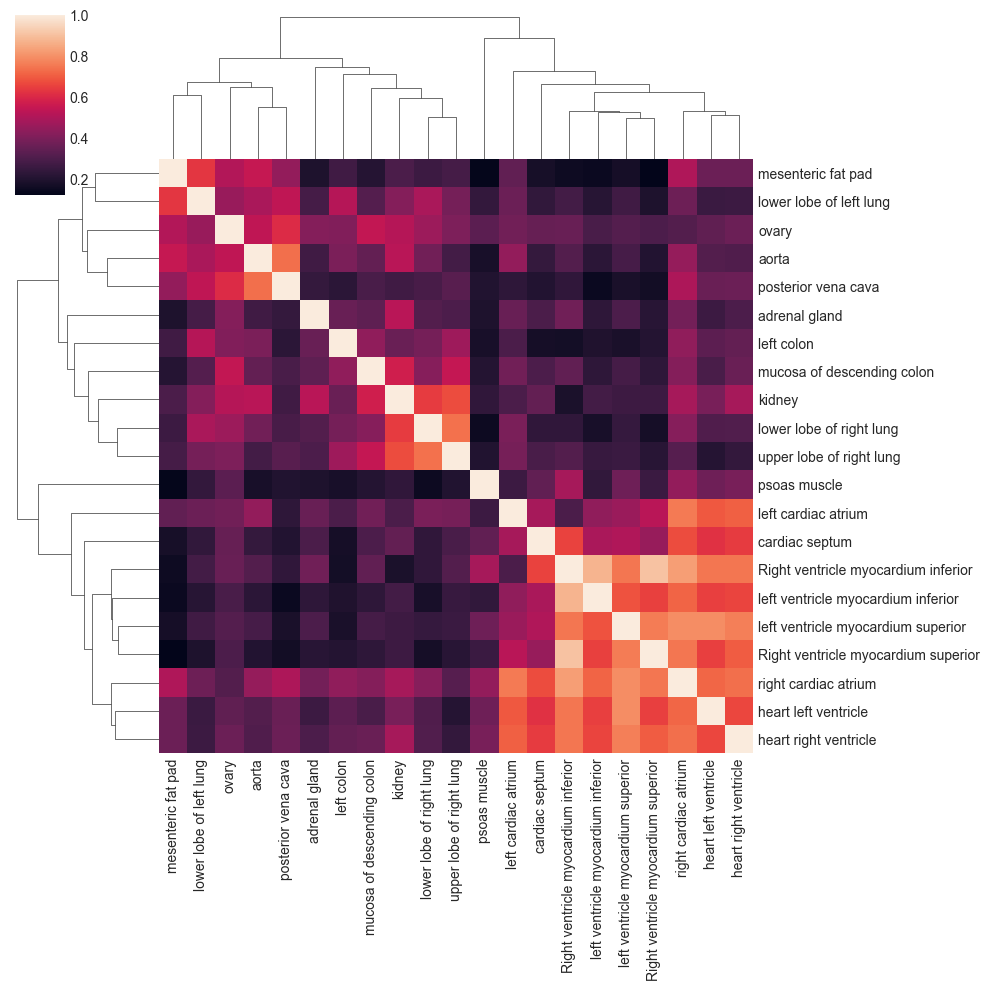

In [66]:
intersection_map(tissue_dict,group_ids=tissue_ids,method="min")
plt.savefig(figures+"clustermap_min_tissue_no_TSS_PAS.png")

In [45]:
import itertools
v=(3,1,1,1)

con_tab=np.zeros((2, 2), dtype=int)

i=0
for m,n in itertools.product(range(2), range(2)):
    con_tab[n,m]=v[i]
    i+=1
        
con_tab

array([[3, 1],
       [1, 1]])

In [39]:
import numpy as np

In [40]:
np.log2((a)*d) - np.log2(c*b)

/scratch/local/ipykernel_54875/2228676795.py:1: RuntimeWarning: divide by zero encountered in log2
  np.log2((a)*d) - np.log2(c*b)


-inf

In [43]:
def corrected_log2OR(con_tab):
    con_tab_copy = np.zeros((2, 2), dtype=float)
    
    for m, n in itertools.product(range(2), range(2)):
        if con_tab[n,m]==0:
            con_tab_copy[n,m]=10**-9
        else:
            con_tab_copy[n,m]=con_tab[n,m]
    log2OR = np.log2((con_tab_copy[0, 0]*con_tab_copy[1, 1])) - np.log2((con_tab_copy[0, 1]*con_tab_copy[1, 0]))
    return log2OR

In [46]:
corrected_log2OR(con_tab)

1.584962500721156

## Volcano plot

In [30]:
figures="figures/tissue/"
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 200
plt.style.use("seaborn-whitegrid")

In [96]:
def volcano_plot(tbl,ax=None):
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
        
    tbl=tbl[tbl.adj_p_value>10**(-50)]
    
    col_dict={True:"coral",False:"cornflowerblue"}
    
    colors=[col_dict[t] for t in tbl.adj_p_value<0.05]

    ax.scatter(tbl.log2OR,-np.log10(tbl.adj_p_value),c=colors)
    ax.set_ylabel("-log10(p_value)")
    ax.set_xlabel("log2OR")

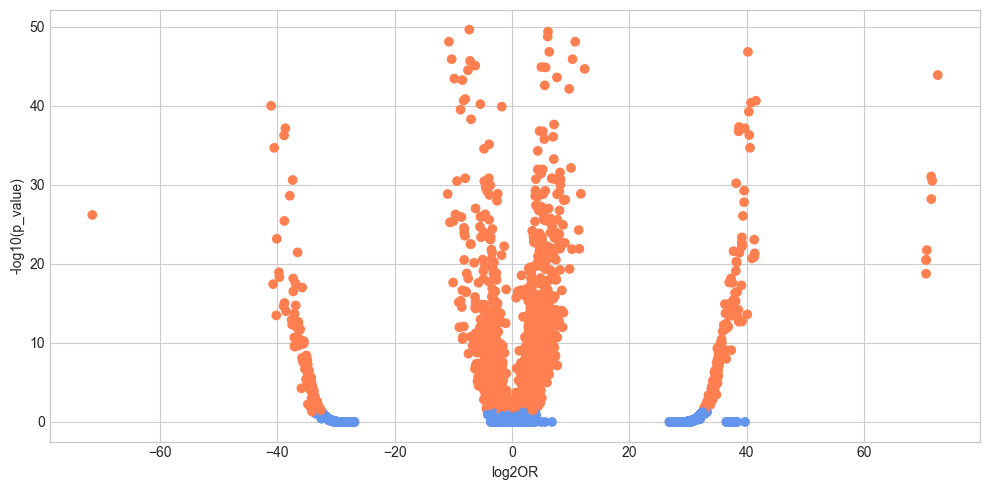

In [101]:
fig,ax=plt.subplots(figsize=(10,5))

volcano_plot(tissue_dict["ovary"],ax=ax)

fig.tight_layout()
plt.savefig(figures+"volcano_plot_ovary.png")

# How to find the most commonly coordinated genes?

## Threshold-based

In [96]:
tissue_od={}

for k,tbl in tissue_dict.items():
    tbl_sig=tbl[tbl.adj_p_value<0.05].copy()
    tbl_sig["abslog2OR"]=abs(tbl_sig.log2OR)
    t=tbl_sig.sort_values(by="abslog2OR",ascending=False)
    tissue_od[k]=t.gene_name

In [92]:
tissue_od["aorta"]

TypeError: 'set' object is not subscriptable

In [98]:
common_genes=set(tissue_od["aorta"])

for k,l in tissue_od.items():
    common_genes=common_genes & set(l)

In [99]:
common_genes

{'MYL6'}

In [104]:
def common_genes(tbl_dict,groups=None):
    
    tissue_od={}
    
    if groups is None:
        keys=list(tissue_dict.keys())
    else:
        keys=groups

    for k in keys:
        tbl_sig=tbl_dict[k][tbl_dict[k].adj_p_value<0.05].copy()
        tbl_sig["abslog2OR"]=abs(tbl_sig.log2OR)
        t=tbl_sig.sort_values(by="abslog2OR",ascending=False)
        tissue_od[k]=t.gene_name
        
    common_genes=set(tissue_od[keys[0]])
    
    for k,l in tissue_od.items():
        common_genes=common_genes & set(l)
    
    return common_genes

In [105]:
common_genes(tissue_dict)

{'MYL6'}

In [114]:
len(list(tissue_dict.keys()))
from scipy.special import binom

par_sum=0

for k in range(1,22):
    par_sum+=binom(21,k)

par_sum

2097151.0

There are 2,097,151 different combinations of tissues. We cannot try all of them.´, so we will proceed with more educated guesses. We first look at the groups that we indentified visually using the cluster maps. 

In [121]:
common_genes(tissue_dict,groups=['psoas muscle','left cardiac atrium','right cardiac atrium','heart left ventricle',
                                 'heart right ventricle','Right ventricle myocardium inferior','Right ventricle myocardium superior',
                                 'left ventricle myocardium inferior','left ventricle myocardium superior','cardiac septum'])

{'MYL6', 'OBSL1'}

In [122]:
common_genes(tissue_dict,groups=['right cardiac atrium','heart left ventricle',
                                 'heart right ventricle','Right ventricle myocardium inferior','Right ventricle myocardium superior',
                                 'left ventricle myocardium inferior','left ventricle myocardium superior'])

{'C12orf57',
 'CD36',
 'FADS3',
 'FLNA',
 'MKNK2',
 'MYL6',
 'OBSL1',
 'PDLIM5',
 'PHPT1',
 'QKI',
 'TMEM259',
 'TPM2'}

In [127]:
common_genes(tissue_dict,groups=["mesenteric fat pad","aorta","posterior vena cava","ovary","lower lobe of left lung"])

{'ABTB1',
 'ACADVL',
 'AL391244.1',
 'ANKRD10',
 'C7',
 'CALD1',
 'CAST',
 'CCNL2',
 'CDK10',
 'COL4A1',
 'COPS8',
 'DCAF7',
 'DDX39A',
 'DPP7',
 'DUSP1',
 'DYNC1H1',
 'EIF3A',
 'EIF4G1',
 'FBLN1',
 'FLII',
 'GAS5',
 'GGNBP2',
 'GUK1',
 'HDLBP',
 'HEIH',
 'HNRNPR',
 'HPS1',
 'HSP90AA1',
 'ID3',
 'ILF3',
 'IRF7',
 'ITGB1BP1',
 'JAK1',
 'LINC00667',
 'MAP4',
 'MATR3',
 'MYH11',
 'MYL6',
 'MYLK',
 'OSBPL1A',
 'PHYKPL',
 'PRPF38B',
 'QSOX1',
 'RHOT2',
 'RNH1',
 'RPS8',
 'SDR39U1',
 'SEC31A',
 'SEC63',
 'SMARCA4',
 'SOD2',
 'SPATA20',
 'SPTAN1',
 'SRSF11',
 'SRSF5',
 'STAT1',
 'SUPT16H',
 'TM9SF1',
 'TRA2A',
 'TRPC4AP',
 'TYMP',
 'UBE2I',
 'UTRN',
 'VPS28',
 'WDR73',
 'ZNF106'}

Our second attempt is to use a greedy algorithm to find the best group of common genes.

In [128]:
def yu(tbl_dict,n,start,groups=None):
    
    if groups is None:
        groups=list(tissue_dict.keys())
    
    included_groups=[start] # the group name
    best_int={}
    
    while len(included_groups)<n:
        
        next_included_groups=included_groups
        next_best_int={}
        
        not_included_groups=[g for g in groups if g not in included_groups]
        
        for g in not_included_groups:
            candidate= common_genes(tbl_dict,included_groups+[g])
            if len(candidate)>len(next_best_int):
                next_best_int=candidate
                next_included_groups=included_groups+[g]
                
        included_groups=next_included_groups
        best_int=next_best_int
        
    return(best_int,included_groups)
    

Now we can find all best groups of size n(=3) for all tissues. Then reconstruct a topology.

In [137]:
top=[]
for k in tissue_dict.keys():
    top.append((k,yu(tissue_dict,3,k)[1]))

In [138]:
top

[('left colon',
  ['left colon', 'lower lobe of left lung', 'right cardiac atrium']),
 ('Right ventricle myocardium superior',
  ['Right ventricle myocardium superior',
   'right cardiac atrium',
   'heart right ventricle']),
 ('aorta', ['aorta', 'ovary', 'right cardiac atrium']),
 ('lower lobe of left lung',
  ['lower lobe of left lung', 'ovary', 'right cardiac atrium']),
 ('kidney', ['kidney', 'aorta', 'lower lobe of right lung']),
 ('heart right ventricle',
  ['heart right ventricle', 'right cardiac atrium', 'heart left ventricle']),
 ('lower lobe of right lung',
  ['lower lobe of right lung', 'lower lobe of left lung', 'aorta']),
 ('left ventricle myocardium superior',
  ['left ventricle myocardium superior',
   'heart right ventricle',
   'heart left ventricle']),
 ('ovary', ['ovary', 'right cardiac atrium', 'heart right ventricle']),
 ('adrenal gland',
  ['adrenal gland', 'right cardiac atrium', 'heart right ventricle']),
 ('posterior vena cava', ['posterior vena cava', 'aorta', 

#### reflections on log2OR correction

In [257]:
t=tissue_dict["right cardiac atrium"].copy()

alt_log2OR=[]

for _,r in t.iterrows():
    a= r.priA_priB if r.priA_priB!=0 else 1
    b= r.altA_priB if r.altA_priB!=0 else 1
    c= r.priA_altB if r.priA_altB!=0 else 1
    d= r.altA_altB if r.altA_altB!=0 else 1
    alt_log2OR.append(np.log2((a*d)/(b*c)))

In [258]:
t["alt"]="current"
z=t.copy()
z.log2OR=alt_log2OR
z.alt="alternative"
t=pd.concat([t,z])
t.reset_index(drop=True)

,gene_id,gene_name,strand,ase1_type,ase2_type,ase1_start,ase1_end,ase2_start,ase2_end,p_value,...,log2OR,priA_priB,priA_altB,altA_priB,altA_altB,priA_priB_trID,priA_altB_trID,altA_priB_trID,altA_altB_trID,alt
0,ENSG00000182670.13,TTC3,+,5AS,PAS,37073364,37087246,37165549,37166598,1.000000,...,-0.077557,93,17,127,22,"[9, 140, 55, 45, 4, 440, 60, 31, 1372, 1371, 1...","[17, 934, 41, 1517, 1279, 1272, 1237, 1181, 11...","[25, 36, 33, 8, 366, 343, 88, 77, 13, 1375, 46...","[32, 39, 1538, 1522, 1382, 1299, 1293, 1284, 1...",current
1,ENSG00000182670.13,TTC3,+,5AS,PAS,37073364,37087246,37151892,37152008,1.000000,...,-0.042169,59,51,81,68,"[17, 140, 55, 45, 4, 440, 60, 31, 1372, 1371, ...","[9, 1368, 1366, 1361, 137, 125, 1518, 1481, 13...","[32, 36, 33, 8, 366, 343, 88, 1375, 468, 233, ...","[25, 77, 13, 1374, 1305, 961, 236, 203, 189, 1...",current
2,ENSG00000182670.13,TTC3,+,ES,PAS,37073364,37108391,37165549,37166598,0.037052,...,-0.967361,113,41,97,18,"[11, 2, 7, 64, 133, 180, 169, 53, 1369, 1349, ...","[3, 686, 939, 260, 194, 80, 1523, 1520, 1509, ...","[9, 140, 55, 45, 4, 440, 60, 31, 1373, 1372, 1...","[17, 1370, 934, 41, 1517, 1393, 1288, 1279, 12...",current
3,ENSG00000182670.13,TTC3,+,ES,PAS,37073364,37108391,37151892,37152008,0.804875,...,0.100014,87,67,63,52,"[3, 2, 7, 64, 133, 686, 180, 53, 1369, 1349, 9...","[11, 169, 955, 85, 1543, 1508, 1437, 1436, 141...","[17, 140, 55, 45, 4, 440, 60, 31, 1373, 1372, ...","[9, 1368, 1366, 1361, 463, 137, 125, 1518, 148...",current
4,ENSG00000182670.13,TTC3,+,5AS,PAS,37073364,37108391,37165549,37166598,0.118204,...,-0.624836,113,41,153,36,"[11, 2, 7, 64, 133, 180, 169, 53, 1369, 1349, ...","[3, 686, 939, 260, 194, 80, 1523, 1520, 1509, ...","[25, 18, 36, 33, 8, 366, 88, 77, 13, 1375, 954...","[32, 15, 39, 962, 960, 334, 147, 1538, 1522, 1...",current
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21447,ENSG00000168306.12,ACOX2,-,IR,TSS,58534145,58534359,58526465,58526777,1.000000,...,2.911066,173,0,23,0,"[1, 2, 60, 28, 4, 152, 69, 55, 251, 158, 156, ...",[],"[33, 26, 10, 248, 201, 199, 147, 135, 134, 131...",[],alternative
21448,ENSG00000168306.12,ACOX2,-,IR,TSS,58534522,58534946,58537118,58537400,0.483228,...,1.665581,23,145,1,20,"[2, 153, 151, 135, 242, 178, 165, 142, 93, 89,...","[1, 60, 4, 152, 69, 55, 251, 158, 155, 136, 13...","[23, 265, 262, 232, 229, 187, 180, 170, 122, 1...","[33, 26, 10, 248, 217, 201, 199, 147, 131, 74,...",alternative
21449,ENSG00000168306.12,ACOX2,-,IR,TSS,58534522,58534946,58526465,58526777,1.000000,...,3.070389,168,0,20,0,"[1, 2, 60, 4, 152, 69, 55, 251, 158, 155, 153,...",[],"[33, 26, 10, 248, 201, 199, 147, 131, 74, 23, ...",[],alternative
21450,ENSG00000041880.14,PARP3,+,IR,TSS,51944578,51944777,51942269,51942708,0.477564,...,-0.556293,64,77,11,9,"[6, 15, 19, 13, 207, 166, 121, 119, 49, 239, 2...","[1, 4, 5, 208, 206, 164, 120, 75, 74, 33, 3, 2...","[8, 14, 210, 209, 66, 42, 17, 233, 202, 199, 1...","[21, 30, 122, 118, 113, 0, 232, 230, 224, 223,...",alternative


In [259]:
t=t.reset_index(drop=True)

In [268]:
t2=tissue_dict["right cardiac atrium"].copy()
t2.log2OR-alt_log2OR

0        1.290634e-15
1        1.720846e-15
2        4.440892e-16
3       -1.748601e-15
4        4.440892e-16
             ...     
10721   -1.776357e-15
10722    4.440892e-16
10723    0.000000e+00
10724    0.000000e+00
10725    2.220446e-16
Name: log2OR, Length: 10726, dtype: float64

In [28]:
import seaborn as sns

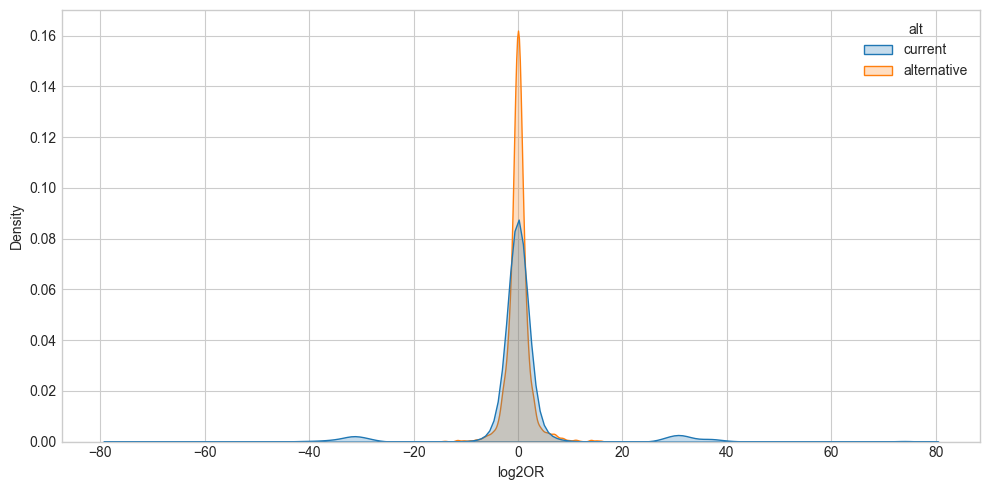

In [263]:
fig,ax=plt.subplots(figsize=(10,5))

sns.kdeplot(data=t,x="log2OR",fill=True,hue="alt",ax=ax)

fig.tight_layout()

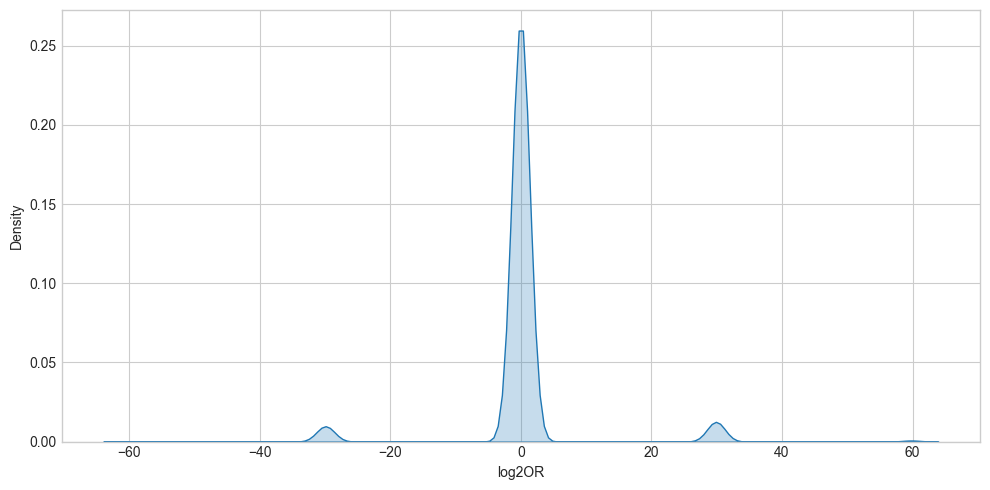

In [269]:
t2=tissue_dict["right cardiac atrium"].copy()

fig,ax=plt.subplots(figsize=(10,5))

sns.kdeplot(t2.log2OR-alt_log2OR,fill=True,ax=ax)

fig.tight_layout()

In [191]:
ns=[]

for k,tbl in tissue_dict.items():
    tbl_sig=tbl[tbl.adj_p_value<0.05]
    genes=list(set(tbl_sig.gene_id))
    ns.append(len(genes))
    for gid in genes:
        g=tbl_sig[tbl_sig.gene_id==gid]
        g=g[g.adj_p_value==min(g.adj_p_value)].iloc[0,:]
        g.log2OR
    

In [190]:
plt.hist(ns,bins=100)
plt.tight_layout()

In [182]:
g

gene_id                                           ENSG00000262655.3
gene_name                                                     SPON1
strand                                                            +
ase1_type                                                       TSS
ase2_type                                                       PAS
ase1_start                                                 13962506
ase1_end                                                   13963142
ase2_start                                                 14265523
ase2_end                                                   14268131
p_value                                                         0.0
adj_p_value                                                     0.0
stat                                                       0.052381
log2OR                                                    -4.254814
priA_priB                                                         4
priA_altB                                       

In [193]:
min(ns)

24

In [35]:
t3=tissue_dict["right cardiac atrium"].copy()
t3["significant"]=t3.adj_p_value<0.05

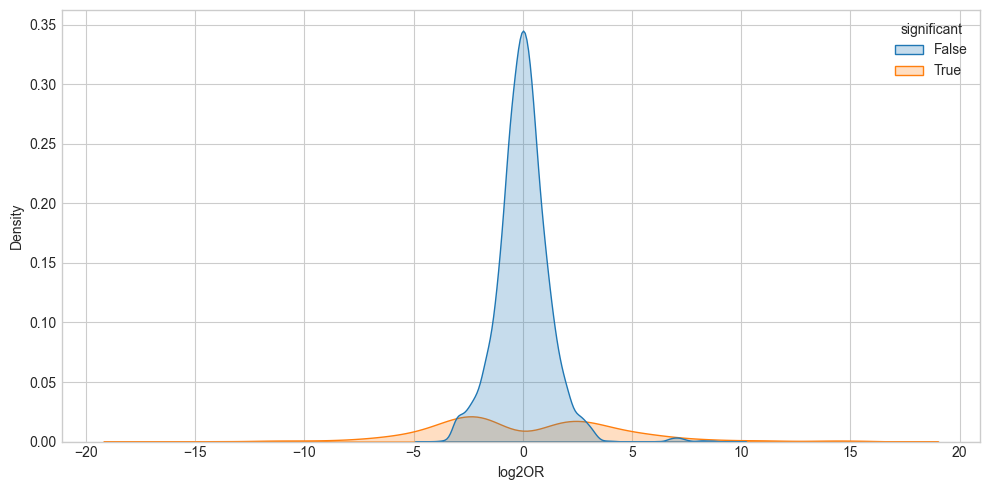

In [36]:
fig,ax=plt.subplots(figsize=(10,5))

sns.kdeplot(data=t3,x="log2OR",fill=True,ax=ax,hue="significant")

fig.tight_layout()

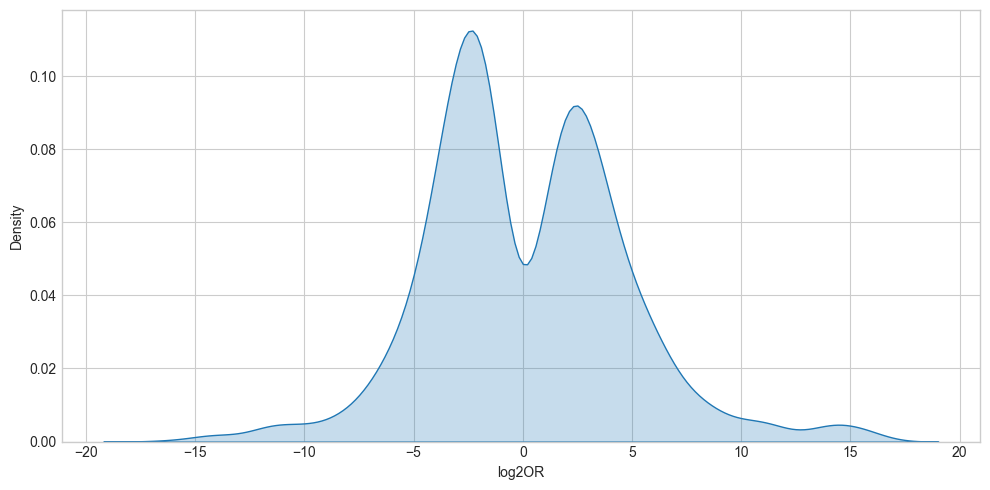

In [57]:
fig,ax=plt.subplots(figsize=(10,5))

x=t3[t3.significant].log2OR

sns.kdeplot(x,fill=True,ax=ax)

fig.tight_layout()

## Score-based

In [16]:
def zero_correction(x):
    no_zeros=x[x!=0]
    no_zeros=no_zeros if len(no_zeros)!=0 else [10**(-20)]
    new_x=[]
    for e in x:
        if e==0:
            new_x.append(min(no_zeros))
        else:
            new_x.append(e)
    return np.array(new_x)

In [17]:
def gene_stats(tbl,gene,weighted=True):
    
    tbl=tbl[tbl.gene_id==gene]
    
    n=tbl.shape[0]
    n_coor=sum(tbl.adj_p_value<0.05) 
    
    if n==0:
        return ()
    
    e=np.array(tbl.log2OR) #effect sizes
    p=np.array(tbl.adj_p_value) # adjusted p_values
    p=zero_correction(p) # correct zero values in p values
    s=abs(e)*np.log10(p) # sum
    
    if weighted==True:
        score=sum(s)/sum(np.log10(p))
    else:
        score=-sum(s)/n   
    
    return (gene,tbl.gene_name.iloc[0],score,n,n_coor,min(e),max(e),np.mean(e),np.median(e),min(p),max(p),np.mean(p),np.median(p))

In [18]:
gene_stats(tissue_dict["aorta"],"ENSG00000182670.13")

('ENSG00000182670.13',
 'TTC3',
 1.1156888373762162,
 8,
 0,
 -1.3267290811511838,
 0.9892735934069403,
 0.05748915733870419,
 0.18209525713815466,
 0.08654220832189782,
 1.0,
 0.7535993336324656,
 0.8521886608536917)

In [19]:
gene_stats(tissue_dict["aorta"],"ENSG00000092841.18")

('ENSG00000092841.18',
 'MYL6',
 6.3304270924692,
 13,
 11,
 -11.990786541009184,
 12.865255658925326,
 0.9713653316197632,
 0.8304368677806266,
 3.359023546773382e-13,
 0.723510045498936,
 0.0769939151759847,
 0.0001957163786119631)

In [20]:
def all_genes_stats(tbl,weighted=True):
    
    genes=list(set(tbl.gene_id))
    
    data=[]
    
    for g in genes:
        try:
            data.append(gene_stats(tbl,g,weighted=weighted))
        except:
            print(f"error on {g}")
    
    columns=["gene_id","gene_name","score","n_events","n_coor_events","min(log2OR)","max(log2OR)","mean(log2OR)","median(log2OR)",
            "min(adj_p_value)","max(adj_p_value)","mean(adj_p_value)","median(adj_p_value)"]
    df=pd.DataFrame(data,columns=columns)
    df.dropna()
    
    return df

In [21]:
res=all_genes_stats(tissue_dict["aorta"])
print(f"the result is a {res.shape} dataframe")
res=res.dropna()
print(f"after dropping na the result is a {res.shape} dataframe")      

/scratch/local/ipykernel_128662/3439413962.py:17: RuntimeWarning: invalid value encountered in double_scalars
  score=sum(s)/sum(np.log10(p))


the result is a (1284, 13) dataframe
after dropping na the result is a (1182, 13) dataframe


In [22]:
res

,gene_id,gene_name,score,n_events,n_coor_events,min(log2OR),max(log2OR),mean(log2OR),median(log2OR),min(adj_p_value),max(adj_p_value),mean(adj_p_value),median(adj_p_value)
0,ENSG00000129460.15,NGDN,7.235312,9,3,-2.754888,8.967226,0.983872,-1.552541,5.526471e-11,1.000000,0.271151,0.154018
1,ENSG00000060237.16,WNK1,2.252685,2,0,1.684498,2.510058,2.097278,2.097278,7.396340e-02,0.307395,0.190679,0.190679
2,ENSG00000188313.12,PLSCR1,1.104621,1,0,1.104621,1.104621,1.104621,1.104621,4.502443e-01,0.450244,0.450244,0.450244
3,ENSG00000164733.20,CTSB,0.700440,1,0,-0.700440,-0.700440,-0.700440,-0.700440,7.284990e-01,0.728499,0.728499,0.728499
4,ENSG00000205609.12,EIF3CL,3.172257,2,1,3.058894,3.269805,3.164350,3.164350,4.055018e-02,0.063416,0.051983,0.051983
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279,ENSG00000146223.14,RPL7L1,0.659925,2,0,0.018147,0.659925,0.339036,0.339036,7.638197e-01,1.000000,0.881910,0.881910
1280,ENSG00000184432.9,COPB2,1.181069,2,0,-1.215013,1.070912,-0.072051,-0.072051,7.991514e-02,0.459051,0.269483,0.269483
1281,ENSG00000008513.15,ST3GAL1,2.930835,1,1,2.930835,2.930835,2.930835,2.930835,1.812478e-03,0.001812,0.001812,0.001812
1282,ENSG00000149564.11,ESAM,0.748006,1,0,-0.748006,-0.748006,-0.748006,-0.748006,1.066847e-01,0.106685,0.106685,0.106685


### Comparing weighted and unweighted scores

In [23]:
res_unw=all_genes_stats(tissue_dict["aorta"],weighted=False)
print(f"the result is a {res.shape} dataframe")
res_unw=res_unw.dropna()
print(f"after dropping na the result is a {res.shape} dataframe")      

the result is a (1182, 13) dataframe
after dropping na the result is a (1182, 13) dataframe


In [24]:
from scipy.stats import spearmanr

def correlation_plot(attr):
    
    fig,axs=plt.subplots(figsize=(10,5),ncols=2)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    
    x=abs(res[attr])
    y=res.score
    xu=abs(res_unw[attr])
    yu=res_unw.score
    
    axs[0].scatter(x,y)
    axs[0].set_title("weighted")
    textstr=f"pearson={round(np.corrcoef(x,y)[0,1],2)}\nspearman={round(spearmanr(x,y)[0],2)}"
    axs[0].text(0.6, 0.9, textstr, transform=axs[0].transAxes, fontsize=14,
                verticalalignment='top', bbox=props)
    axs[0].set_xlabel(attr)
    axs[0].set_ylabel("score")

    
    axs[1].scatter(xu,yu)
    axs[1].set_title("unweighted")
    textstr=f"pearson={round(np.corrcoef(xu,yu)[0,1],2)}\nspearman={round(spearmanr(xu,yu)[0],2)}"
    axs[1].text(0.6, 0.9, textstr, transform=axs[1].transAxes, fontsize=14,
                verticalalignment='top', bbox=props)
    axs[1].set_xlabel(attr)
    axs[1].set_ylabel("score")

    
    fig.tight_layout()

#### How do the scores correlate to the number of events?

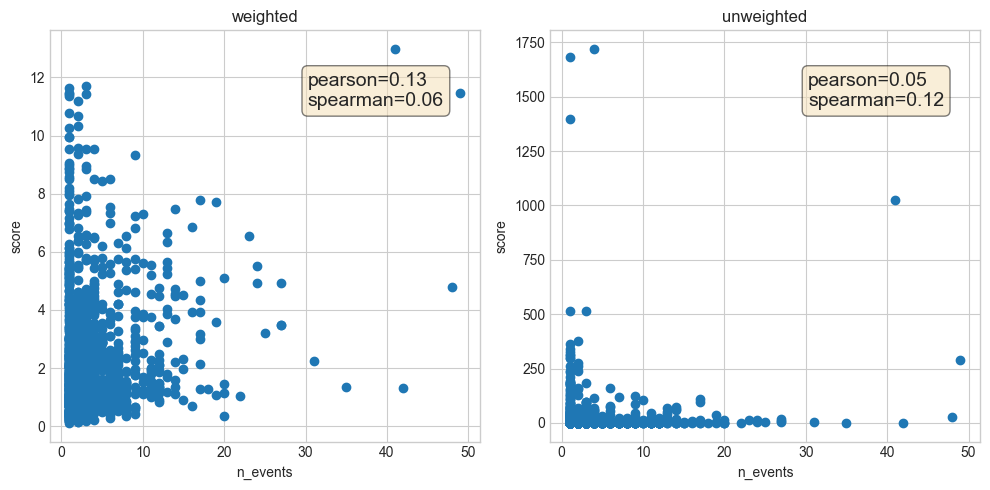

In [27]:
correlation_plot("n_events")

#### How do the scores correlate to the number of coordinated events?

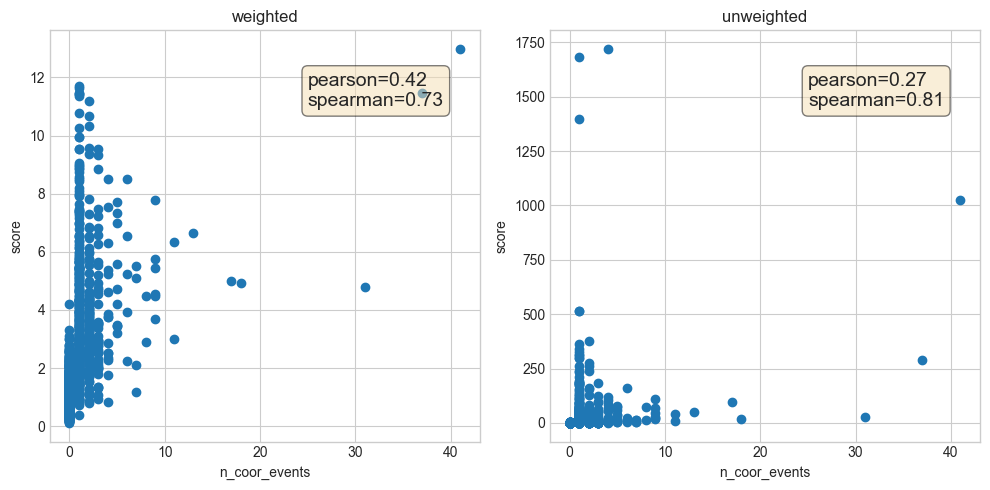

In [28]:
correlation_plot("n_coor_events")

#### How do the scores correlate to the p-values?

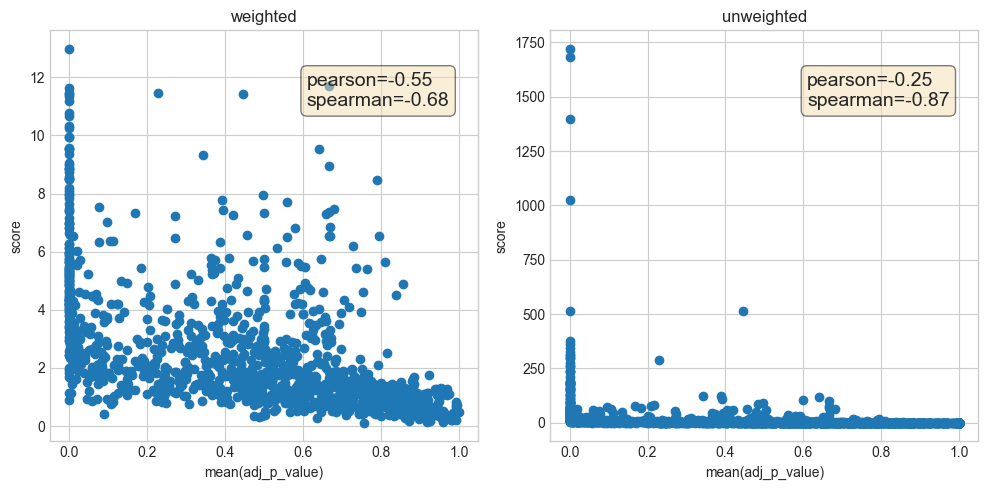

In [29]:
correlation_plot("mean(adj_p_value)")

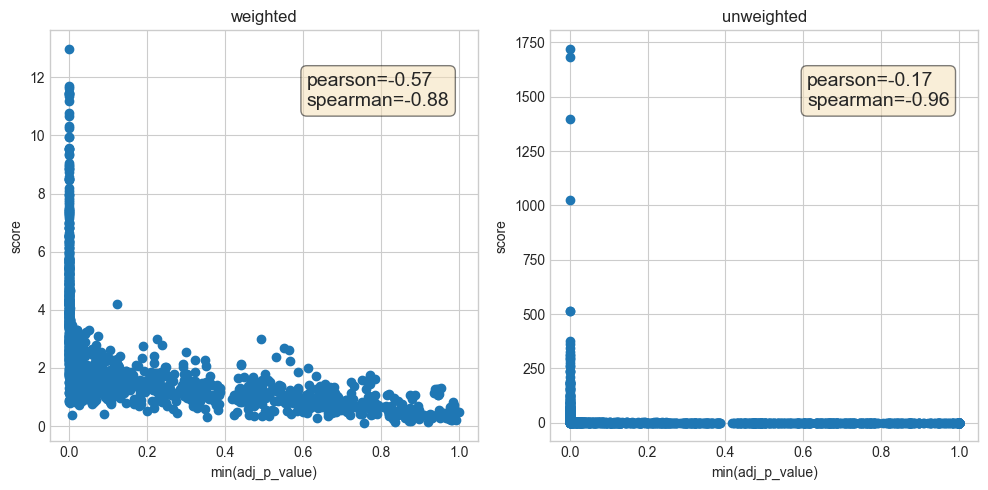

In [30]:
correlation_plot("min(adj_p_value)")

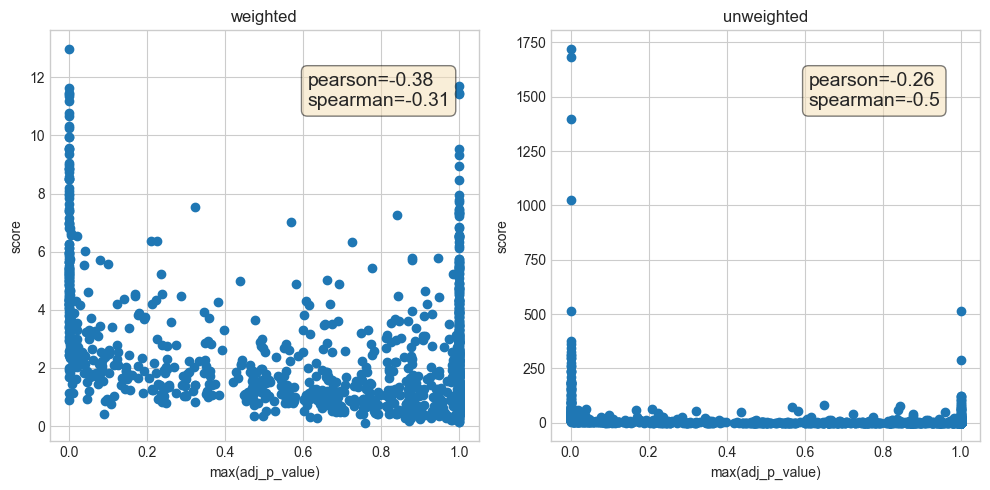

In [31]:
correlation_plot("max(adj_p_value)")

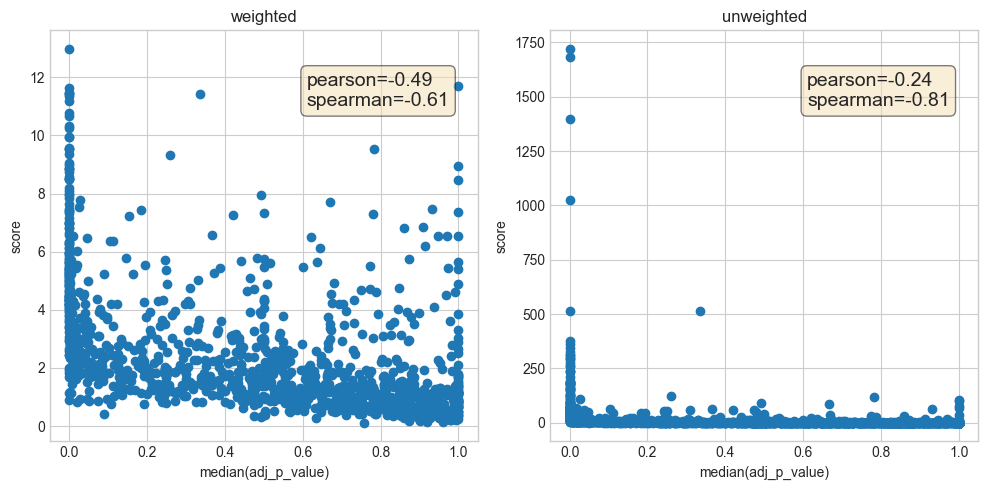

In [32]:
correlation_plot("median(adj_p_value)")

#### How do the scores correlate with the logOR?

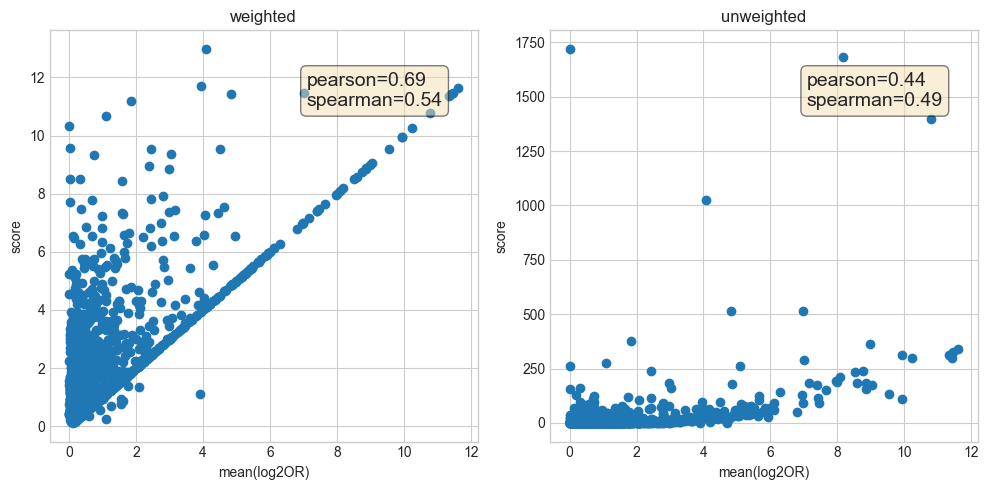

In [33]:
correlation_plot("mean(log2OR)")

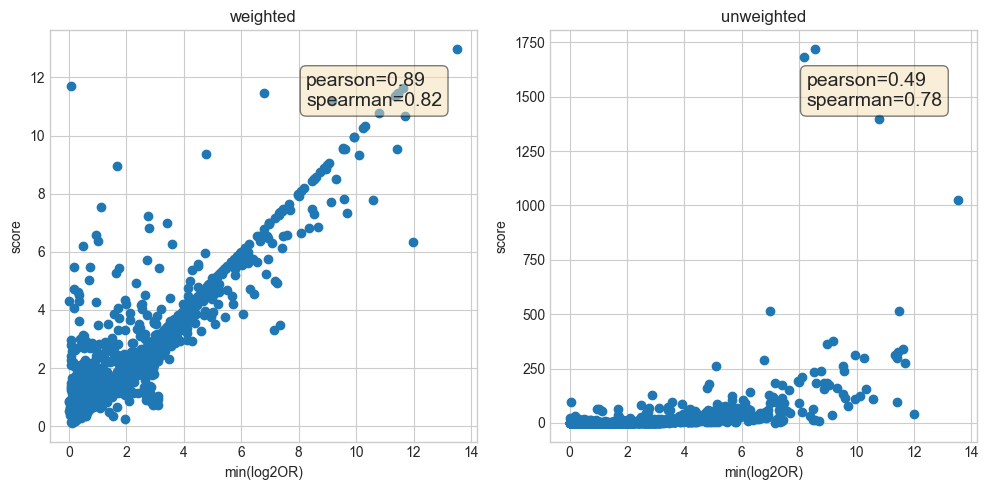

In [34]:
correlation_plot("min(log2OR)")

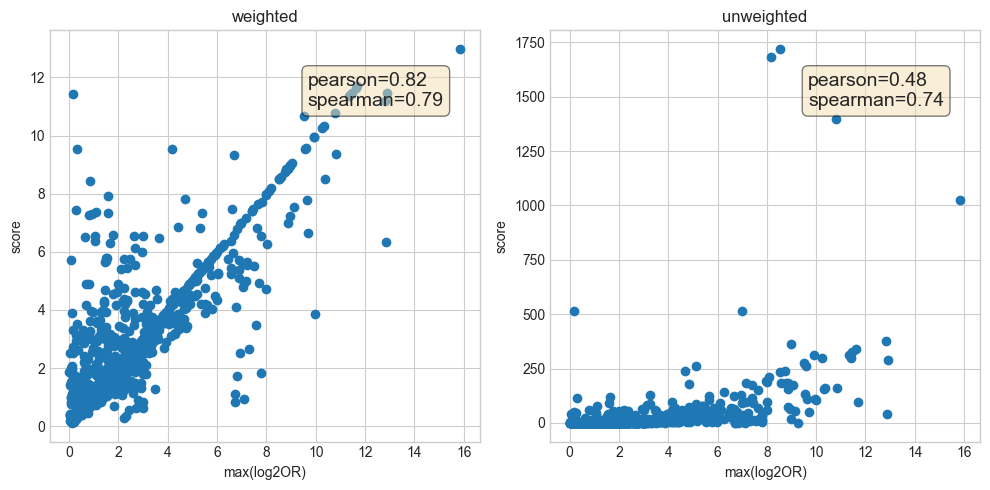

In [35]:
correlation_plot("max(log2OR)")

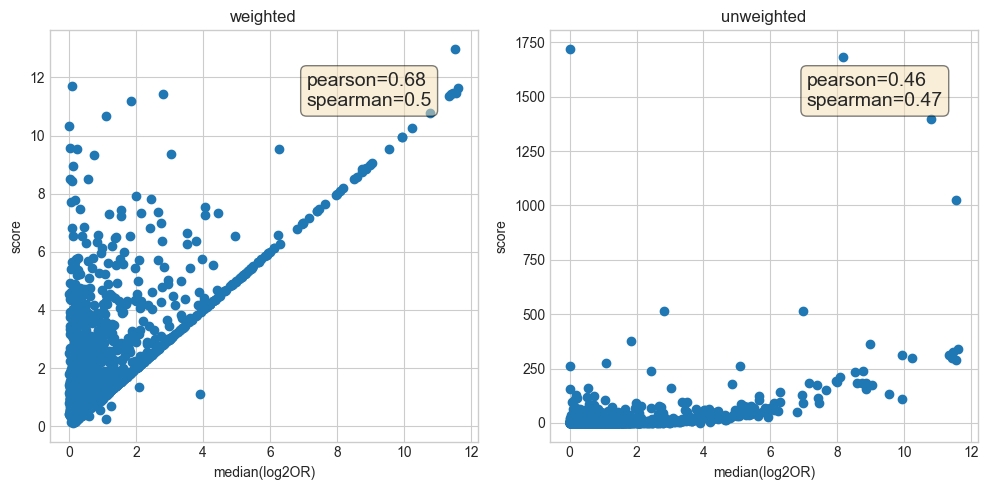

In [36]:
correlation_plot("median(log2OR)")

In [97]:
#res.loc[:,["score",'n_events', 'n_coor_events','mean(log2OR)','mean(adj_p_value)']]
#axes = pd.plotting.scatter_matrix(res.loc[:,["score",'n_events', 'n_coor_events','mean(log2OR)','mean(adj_p_value)']])

## Which are the most commonly coordinated genes in tissue?

In [125]:
gene_stats_dict={}

for k,tbl in tissue_dict.items():
    
    gene_stats_dict[k]=all_genes_stats(tbl)

/scratch/local/ipykernel_81101/3439413962.py:17: RuntimeWarning: invalid value encountered in double_scalars
  score=sum(s)/sum(np.log10(p))
/scratch/local/ipykernel_81101/3439413962.py:17: RuntimeWarning: invalid value encountered in double_scalars
  score=sum(s)/sum(np.log10(p))
/scratch/local/ipykernel_81101/3439413962.py:17: RuntimeWarning: invalid value encountered in double_scalars
  score=sum(s)/sum(np.log10(p))
/scratch/local/ipykernel_81101/3439413962.py:17: RuntimeWarning: invalid value encountered in double_scalars
  score=sum(s)/sum(np.log10(p))
/scratch/local/ipykernel_81101/3439413962.py:17: RuntimeWarning: invalid value encountered in double_scalars
  score=sum(s)/sum(np.log10(p))
/scratch/local/ipykernel_81101/3439413962.py:17: RuntimeWarning: invalid value encountered in double_scalars
  score=sum(s)/sum(np.log10(p))
/scratch/local/ipykernel_81101/3439413962.py:17: RuntimeWarning: invalid value encountered in double_scalars
  score=sum(s)/sum(np.log10(p))
/scratch/loca

In [122]:
gene_stats(tissue_dict["adrenal gland"],"ENSG00000072778.19")

('ENSG00000072778.19',
 'ACADVL',
 8.094091579716242,
 1,
 1,
 8.094091579716242,
 8.094091579716242,
 8.094091579716242,
 8.094091579716242,
 1e-20,
 1e-20,
 1e-20,
 1e-20)

In [108]:
tbl=tissue_dict["adrenal gland"][tissue_dict["adrenal gland"].gene_id=="ENSG00000072778.19"]

In [110]:
tbl.adj_p_value

397    0.0
Name: adj_p_value, dtype: float64

In [112]:
x=tbl.adj_p_value
x

397    0.0
Name: adj_p_value, dtype: float64

In [117]:
no_zeros=x#[x!=0]

    

In [118]:
no_zeros if len(no_zeros)!=0 else 2

397    0.0
Name: adj_p_value, dtype: float64

In [123]:
tissue_dict["adrenal gland"]

,gene_id,gene_name,strand,ase1_type,ase2_type,ase1_start,ase1_end,ase2_start,ase2_end,p_value,...,stat,log2OR,priA_priB,priA_altB,altA_priB,altA_altB,priA_priB_trID,priA_altB_trID,altA_priB_trID,altA_altB_trID
0,ENSG00000157617.16,C2CD2,-,PAS,TSS,41885109,41889344,41953369,41954032,2.218510e-05,...,0.179646,-2.476771,7,226,25,145,"[136, 137, 134, 133, 27, 145, 143, 142, 141, 1...","[19, 3, 17, 26, 2, 103, 139, 138, 135, 130, 12...","[10, 125, 32, 23, 8, 4, 132, 131, 129, 128, 12...","[0, 5, 121, 72, 45, 127, 126, 122, 66, 46, 33,..."
1,ENSG00000157617.16,C2CD2,-,PAS,TSS,41911319,41912440,41953369,41954032,4.979284e-02,...,0.322936,-1.630681,12,327,5,44,"[125, 32, 23, 134, 133, 132, 131, 129, 124, 14...","[19, 0, 17, 5, 2, 121, 103, 72, 45, 135, 130, ...","[136, 137, 27, 143, 142, 116, 113, 110, 94, 87...","[3, 26, 139, 138, 16, 15, 119, 112, 107, 96, 8..."
2,ENSG00000157617.16,C2CD2,-,PAS,TSS,41949678,41953151,41953369,41954032,1.000000e+00,...,inf,29.608632,1,204,0,167,"[124, 110, 108, 94, 88, 71, 11]","[0, 3, 17, 26, 5, 2, 121, 103, 72, 45, 139, 13...",[],[19]
3,ENSG00000160310.17,PRMT2,+,ES,PAS,46635763,46636895,46664294,46665698,6.337037e-01,...,1.194089,0.255910,101,70,29,24,"[6, 0, 10, 26, 231, 131, 106, 25, 671, 667, 66...","[1, 20, 283, 126, 81, 74, 21, 5, 684, 679, 670...","[23, 77, 103, 96, 71, 33, 8, 683, 676, 674, 66...","[4, 14, 275, 102, 79, 677, 673, 652, 651, 650,..."
4,ENSG00000160310.17,PRMT2,+,ES,PAS,46635763,46636895,46658744,46661269,7.538886e-01,...,1.116071,0.158429,95,76,28,25,"[1, 0, 20, 10, 26, 283, 231, 131, 126, 81, 74,...","[6, 106, 25, 646, 623, 581, 564, 531, 497, 496...","[4, 14, 275, 103, 102, 96, 79, 33, 8, 683, 677...","[23, 77, 71, 674, 638, 637, 627, 573, 557, 515..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1861,ENSG00000138496.16,PARP9,-,5AS,TSS,122556121,122558433,122564110,122564447,1.396017e-01,...,2.280303,1.189226,86,12,22,7,"[6, 34, 2, 0, 33, 290, 68, 289, 287, 116, 77, ...","[15, 30, 18, 427, 411, 399, 387, 383, 351, 326...","[26, 35, 32, 22, 459, 456, 447, 443, 432, 417,...","[29, 92, 85, 430, 426, 283, 264, 144, 138, 134..."
1862,ENSG00000114626.17,ABTB1,+,3AS,5AS,127673081,127674390,127674418,127674544,1.388636e-07,...,0.000000,-35.434787,18,76,11,0,"[1, 90, 78, 60, 8, 338, 335, 331, 323, 298, 29...","[4, 272, 92, 275, 274, 222, 205, 121, 71, 29, ...","[3, 42, 273, 7, 332, 328, 322, 318, 305, 289, ...","[321, 314, 306, 302, 288, 250, 182, 151, 142, ..."
1863,ENSG00000041880.14,PARP3,+,IR,TSS,51944578,51944777,51942269,51942708,1.000000e+00,...,1.011364,0.016302,89,44,12,6,"[6, 15, 13, 191, 190, 188, 183, 119, 89, 19, 2...","[1, 4, 74, 5, 184, 182, 75, 27, 237, 231, 228,...","[101, 189, 187, 186, 185, 95, 87, 42, 17, 14, ...","[30, 62, 7, 0, 232, 230, 224, 223, 218, 216, 1..."
1864,ENSG00000041880.14,PARP3,+,IR,TSS,51944578,51944777,51942294,51943046,8.066580e-01,...,0.862500,-0.213404,69,64,10,8,"[1, 15, 4, 74, 5, 191, 190, 188, 184, 183, 182...","[6, 13, 119, 89, 238, 235, 234, 225, 222, 219,...","[30, 189, 95, 62, 42, 17, 7, 0, 232, 230, 224,...","[101, 187, 186, 185, 87, 14, 8, 233, 210, 209,..."


# What is the distance between event pairs?

## By sample types

In [29]:
figures="figures/sample_type/"
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 200
plt.style.use("seaborn-whitegrid")

In [21]:
from isotools._utils import _interval_dist as dist

In [23]:
def event_pair_distance(coor_tbl,significance=0.05):
    
    pairs=list(itertools.combinations_with_replacement(("ES","3AS", "5AS","IR","ME", "TSS", "PAS"),2))
    
    data={"distance":[],"type":[],"coordination":[]}
    
    for p in tqdm(pairs):
        for i,r in coor_tbl.iterrows():
            if p == (r.ase1_type,r.ase2_type) or p == (r.ase2_type,r.ase1_type):
                data["distance"].append(dist([r.ase1_start,r.ase1_end],[r.ase2_start,r.ase2_end]))
                data["type"].append('\n'.join(p))
                data["coordination"].append("coordinated" if r.adj_p_value<significance else "uncoordinated")
    
    return pd.DataFrame(data)

#### sketches

In [24]:
distances=event_pair_distance(coor_tissue)

  0%|          | 0/28 [00:00<?, ?it/s]

In [25]:
min(distances.distance)

2

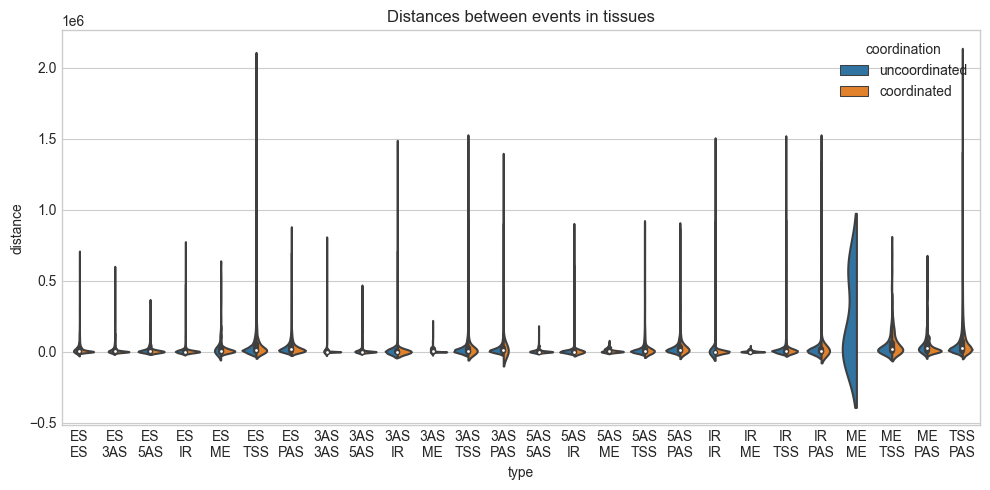

In [28]:
fig,ax=plt.subplots(figsize=(10,5))

sns.violinplot(data=distances,x="type",y="distance",hue="coordination",ax=ax,split=True)
ax.set_title("Distances between events in tissues")

fig.tight_layout()
plt.savefig(figures+"dist_violin_tissue.png")

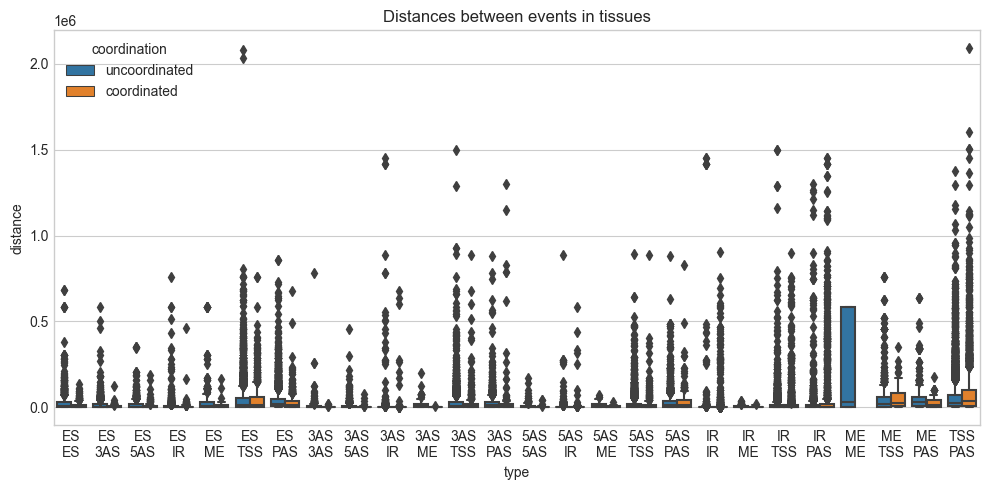

In [29]:
fig,ax=plt.subplots(figsize=(10,5))

sns.boxplot(data=distances,x="type",y="distance",hue="coordination",ax=ax)
ax.set_title("Distances between events in tissues")

fig.tight_layout()

In [37]:
distances["logdist"]=np.log10(distances.distance)

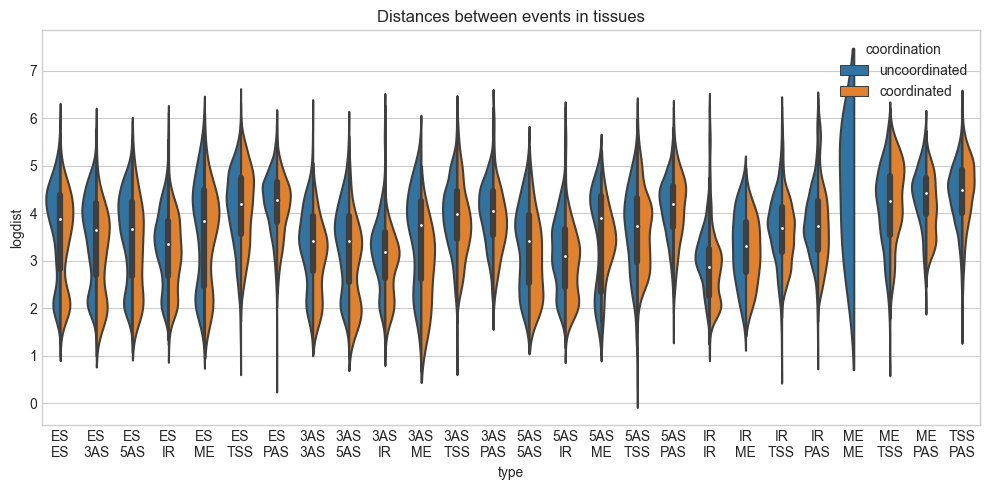

In [38]:
fig,ax=plt.subplots(figsize=(10,5))

sns.violinplot(data=distances,x="type",y="logdist",hue="coordination",ax=ax,split=True)
ax.set_title("Distances between events in tissues")

fig.tight_layout()

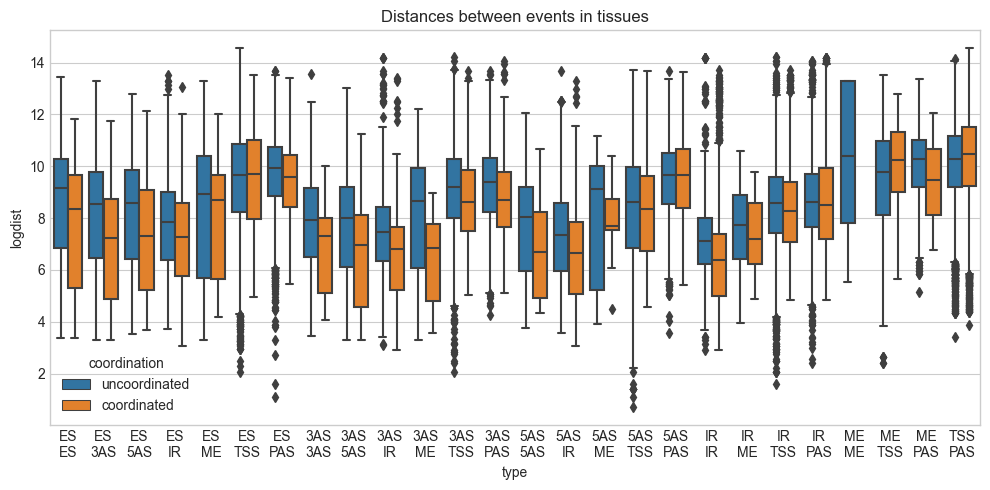

In [32]:
fig,ax=plt.subplots(figsize=(10,5))

sns.boxplot(data=distances,x="type",y="logdist",hue="coordination",ax=ax)
ax.set_title("Distances between events in tissues")

fig.tight_layout()

#### answers

Boxplots are not informative at all and violin plots look little informative. I will try to order the types by relative effect, so that it will be easier for us to discern them.

In [24]:
from scipy.stats import rankdata

def relative_effect(x1,x2):
    
    n1=len(x1)
    n2=len(x2)
    
    if n1==0 or n2==0:
        return 0
        
    x=x1+x2
    
    r=rankdata(x)
    r1=sum(r[0:n1])/n1
    r2=sum(r[n1:])/n2
    
    p=((r2-r1)/(n1+n2))+.5
    return p

In [25]:
def ordviolin(data,title="",ax=None):
    
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
        
    effects=[]
    
    types=list(set(data.type))
    
    pdata=pd.DataFrame({"distance":[],"type":[],"coordination":[]})
    
    for p in types:
        
        temp=data[data.type==p]
        coor=list(temp[temp.coordination=="coordinated"].distance)
        uncoor=list(temp[temp.coordination=="uncoordinated"].distance)
    
        if len(coor)!=0 and len(uncoor)!=0:
            pdata=pd.concat([pdata,temp])
            effects.append((relative_effect(coor,uncoor),p))
        
    effects.sort(reverse=True)
    order=[p for e,p in effects]
    res_eff={p:e for e,p in effects}
    
    pdata["logdist"]=np.log10(pdata.distance)
    
    sns.violinplot(data=pdata,x="type",y="logdist",hue="coordination",ax=ax,split=True,
                   order=order,hue_order=["uncoordinated","coordinated"])
    ax.set_title(f"Distances between events in {title} ordered by relative effect")
    
    return res_eff

NameError: name 'distances' is not defined

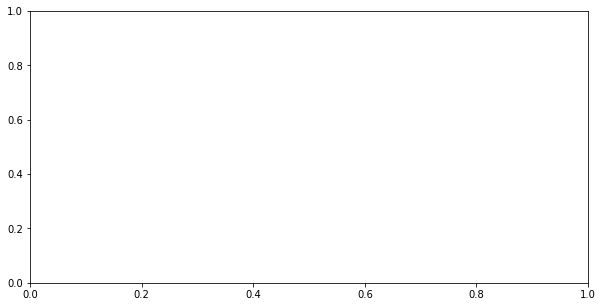

In [26]:
fig,ax=plt.subplots(figsize=(10,5))

ordviolin(distances,ax=ax,title="tissue")

fig.tight_layout()

In [27]:
dist_dict={}

for k,t in tabl_dict.items():
    dist_dict[k]=event_pair_distance(t)

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

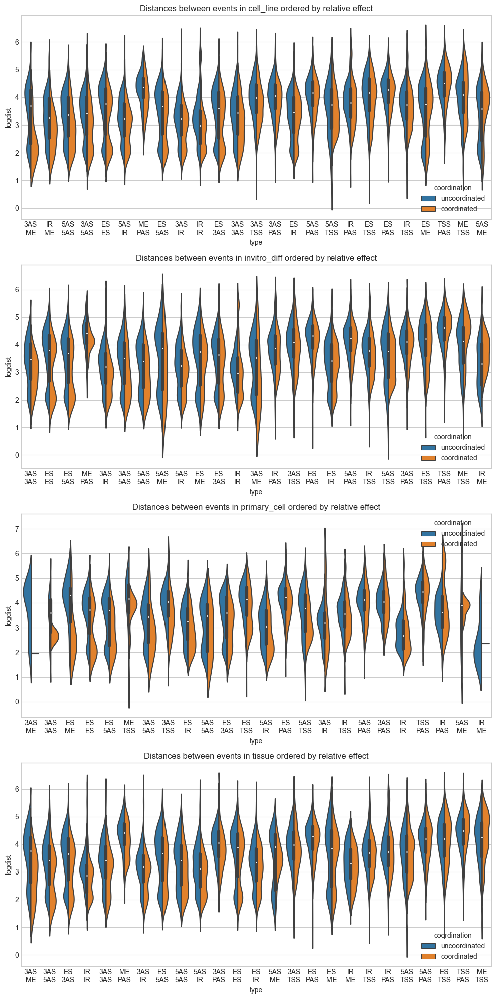

In [30]:
fig,axs=plt.subplots(figsize=(10,5*4),nrows=4,ncols=1)

rel_eff={}
i=0

for k,data in dist_dict.items():
        
    rel_eff[k]=ordviolin(data,ax=axs[i],title=k)
    i+=1
    

fig.tight_layout()
plt.savefig(f"{figures}dist_violin_ordered_grouped.png")

In [63]:
rel_eff

{'cell_line': {'3AS\nME': 0.7754545454545454,
  'IR\nME': 0.6762349799732976,
  '5AS\n5AS': 0.6538814707120175,
  '3AS\n5AS': 0.6509002147168059,
  'ES\nES': 0.6499180827104943,
  '5AS\nIR': 0.6355636184461019,
  'ME\nPAS': 0.6321821080804054,
  'ES\n5AS': 0.6264491764491764,
  '3AS\nIR': 0.6203102236305361,
  'IR\nIR': 0.6152091898296016,
  'ES\n3AS': 0.6111155574709105,
  '3AS\n3AS': 0.606359649122807,
  '3AS\nTSS': 0.5832252000899854,
  '3AS\nPAS': 0.5787724842240237,
  'ES\nIR': 0.5669234153102979,
  '5AS\nPAS': 0.5656356035169311,
  '5AS\nTSS': 0.551026862255448,
  'IR\nPAS': 0.5474871438408417,
  'ES\nTSS': 0.5472840611253859,
  'ES\nPAS': 0.5470584494053297,
  'IR\nTSS': 0.5356595064513273,
  'ES\nME': 0.5078014184397164,
  'TSS\nPAS': 0.47293641315671564,
  'ME\nTSS': 0.47007380823401945,
  '5AS\nME': 0.4545717592592593},
 'invitro_diff': {'3AS\n3AS': 0.6704737183646983,
  'ES\nES': 0.6654870969516892,
  'ES\n5AS': 0.6608037209302325,
  'ME\nPAS': 0.660785659493722,
  '3AS\nIR'

Build a dataframe with ASE types pairs as columns, sample types/tissues as rows, and relative effects as entries. Exclude ME-ME and ME-PAS

In [31]:
types=['5AS\nME','IR\nIR','5AS\nIR','ES\n3AS','ES\nES','ES\nTSS','ES\nPAS','3AS\n3AS','IR\nME','3AS\nTSS','5AS\nTSS',
       '5AS\n5AS','IR\nPAS','3AS\nPAS','3AS\nME','ES\nME','3AS\n5AS','TSS\nPAS','3AS\nIR','ES\nIR','5AS\nPAS','ES\n5AS',
       'IR\nTSS','ME\nTSS']

In [38]:
df_dict={}

for k,l in rel_eff.items():
    df_dict[k]=[l.get(t) for t in types]
    
df_dict
df=pd.DataFrame(df_dict,index=types)
df=df.transpose()
df

,5AS\nME,IR\nIR,5AS\nIR,ES\n3AS,ES\nES,ES\nTSS,ES\nPAS,3AS\n3AS,IR\nME,3AS\nTSS,...,3AS\nME,ES\nME,3AS\n5AS,TSS\nPAS,3AS\nIR,ES\nIR,5AS\nPAS,ES\n5AS,IR\nTSS,ME\nTSS
cell_line,0.454572,0.615209,0.635564,0.611116,0.649918,0.547284,0.547058,0.606360,0.676235,0.583225,...,0.775455,0.507801,0.650900,0.472936,0.620310,0.566923,0.565636,0.626449,0.535660,0.470074
invitro_diff,0.627451,0.591217,0.616705,0.596690,0.665487,0.543516,0.563144,0.670474,0.340196,0.563228,...,0.588141,0.597811,0.646160,0.450161,0.656309,0.562605,0.561717,0.660804,0.551852,0.391019
primary_cell,0.375000,0.525551,0.619723,0.624888,0.708978,0.621745,0.617019,0.772277,0.200000,0.658156,...,0.950000,0.769231,0.661538,0.506930,0.579713,0.645380,0.547896,0.707710,0.563418,0.692759
tissue,0.574324,0.639481,0.610450,0.651555,0.596996,0.496147,0.568565,0.630933,0.552685,0.571719,...,0.734244,0.560191,0.671935,0.461274,0.628643,0.580482,0.500391,0.615922,0.538684,0.440320


## by tissue type

In [101]:
figures="figures/tissue/"
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 200
plt.style.use("seaborn-whitegrid")

In [60]:
dist_dict_tissue={}

for k,t in tissue_dict.items():
    dist_dict_tissue[k]=event_pair_distance(t)

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

/scratch/local/ipykernel_113678/150053152.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=plt.subplots(figsize=(10,5))


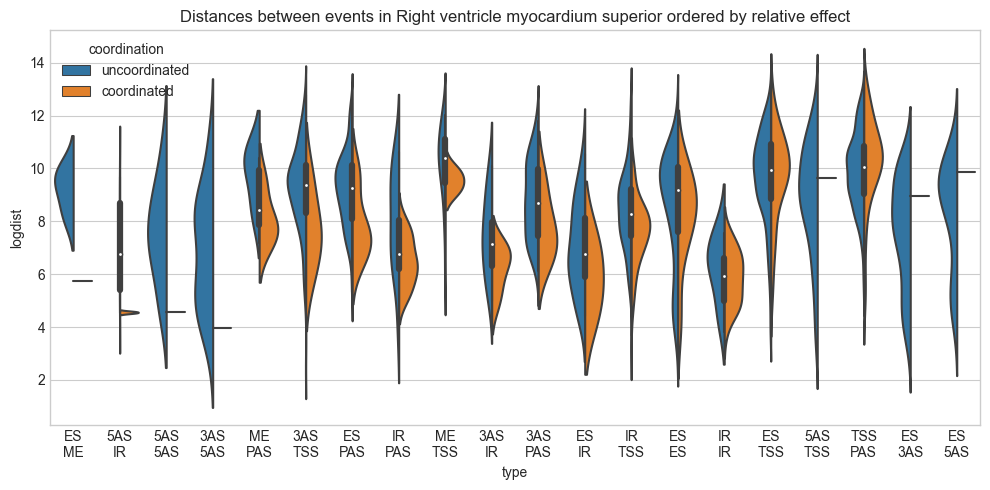

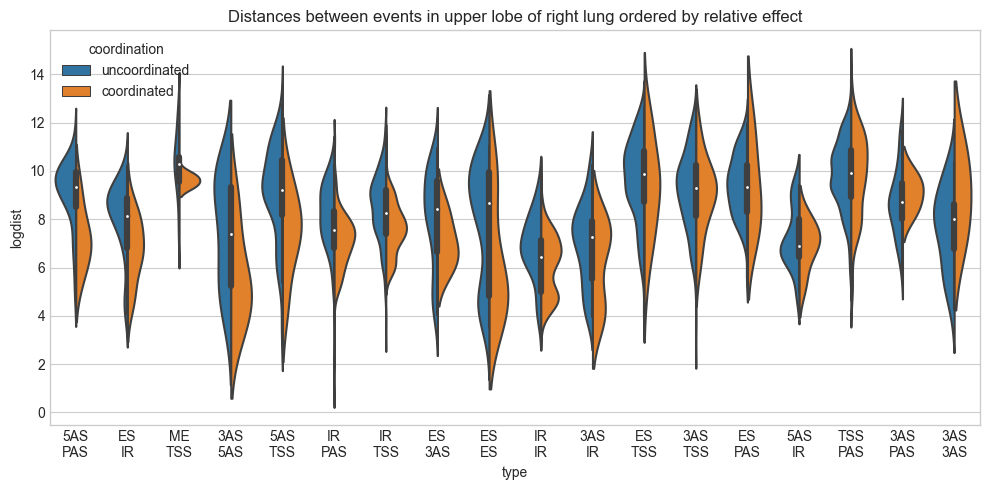

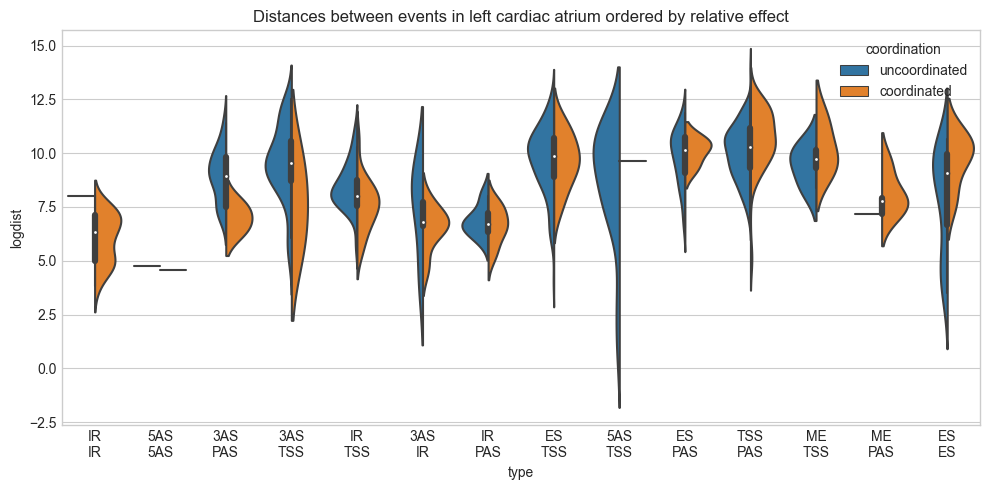

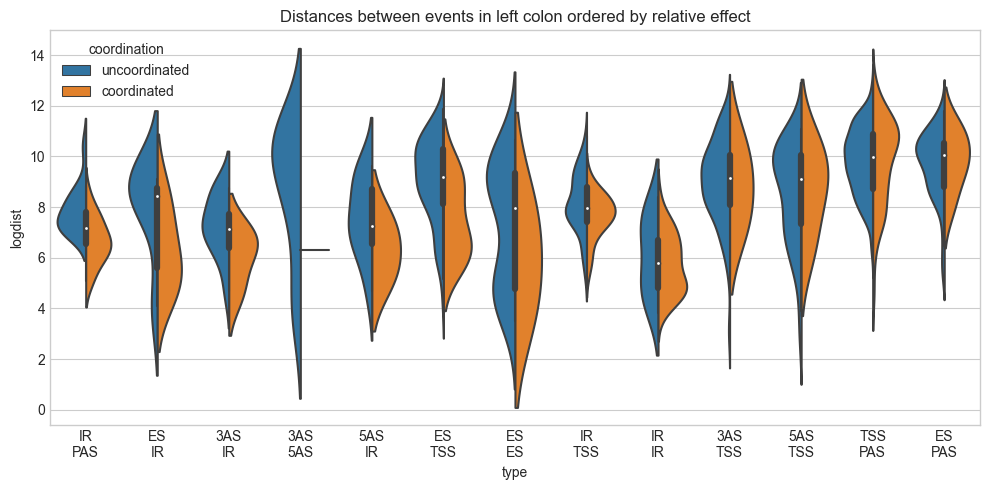

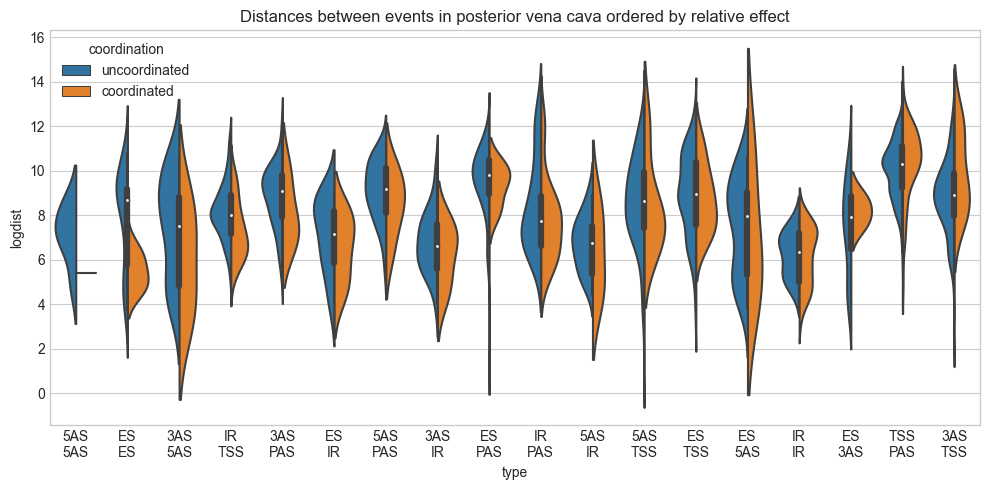

...

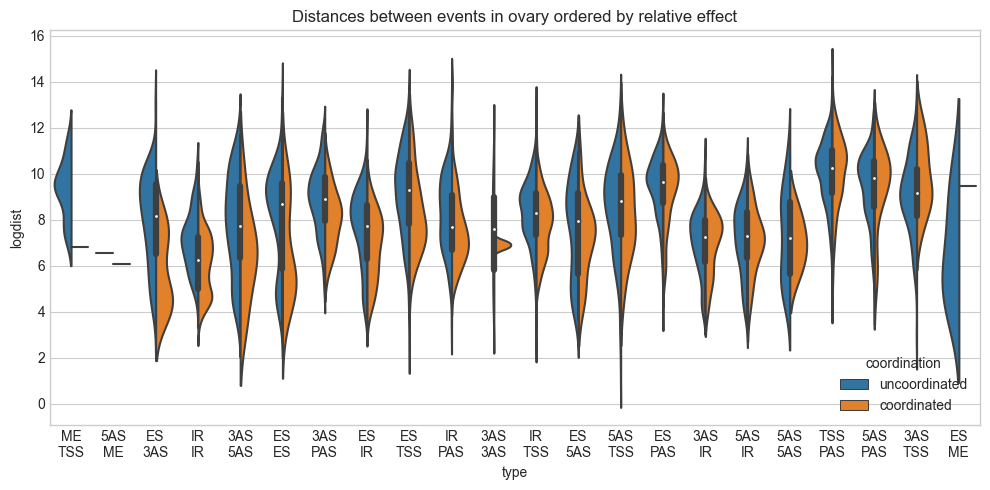

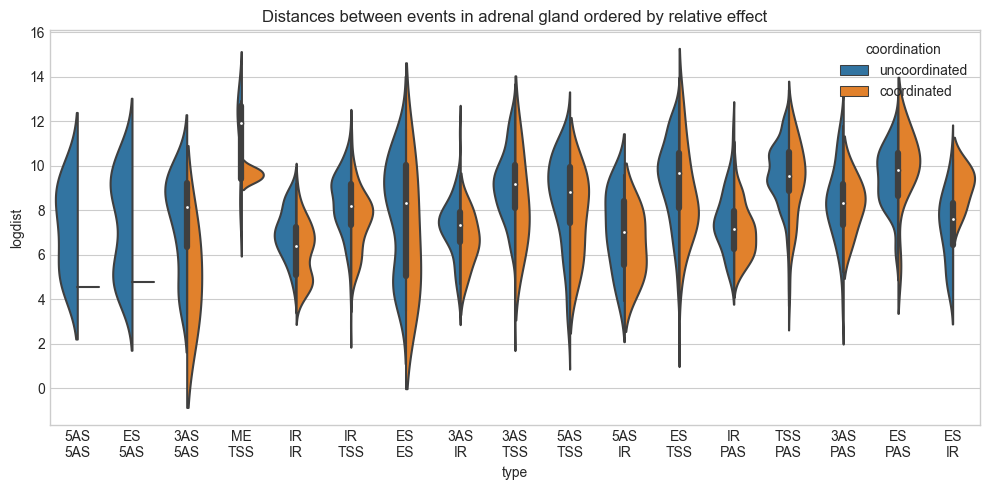

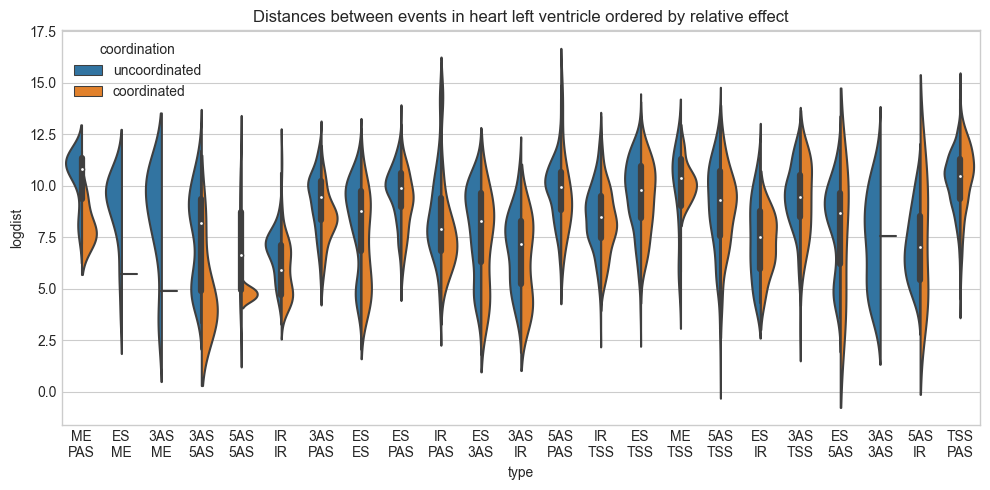

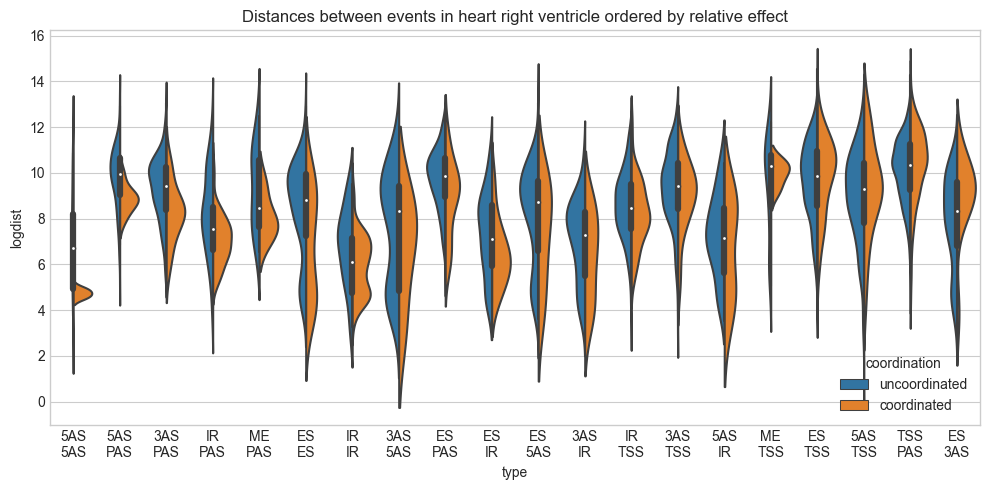

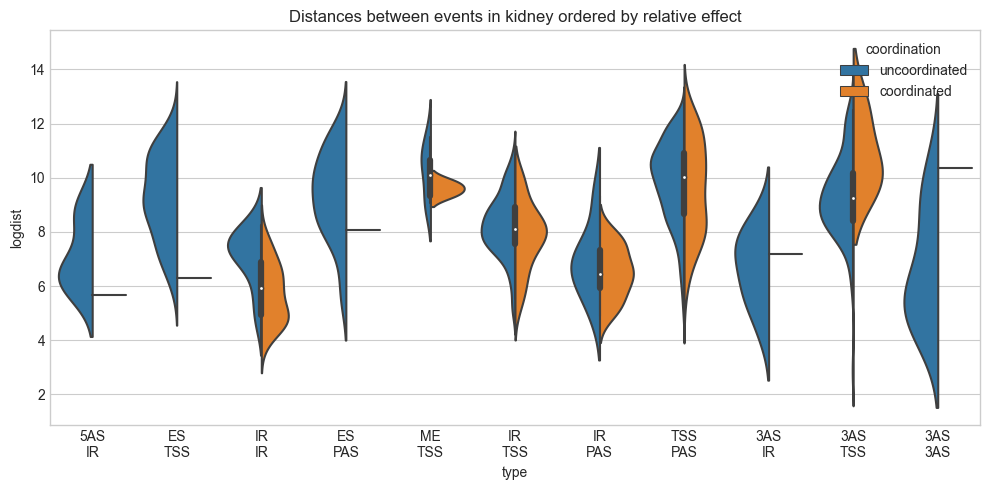

In [102]:
for k,data in dist_dict_tissue.items():
    
    fig,ax=plt.subplots(figsize=(10,5))
    
    ordviolin(data,ax=ax,title=k)
    
    fig.tight_layout()
    plt.savefig(f"{figures}dist_violin_ordered_{k}.png")

# Are the same genes involved in IR involved in other events as well?

In [140]:
def something(tbl_dict):
    
    ir,noir=[],[]
    for i,r in tbl_dict.iterrows():
        if r.adj_p_value>=0.05:
            continue
        t1,t2=r.ase1_type,r.ase2_type
        if "IR" in (t1,t2):
            ir.append(r.gene_name)
        else:
            noir.append(r.gene_name)
    ir=set(ir)
    noir=set(noir)
    
    print(f"Genes with at least one coordinated IR (IR):  {len(ir)}")
    print(f"Events with no coordinated IR (noIR):  {len(noir)}")
    print(f"Intersection IR-noIR:  {len(ir & noir)}")
    print(f"Only IR :  {len(ir - noir)}")
    print(f"Only noIR:  {len(noir-ir)}")
    print(f"Proportion onlyIR to only noIR:  {round(len(ir - noir)/len(noir-ir),2)}")
    print(f"Symmetric difference IR-noIR:  {len(ir ^ noir)}")
    

    return ir,noir

In [141]:
ir,noir=something(coor_tissue)

Genes with at least one coordinated IR (IR):  1656
Events with no coordinated IR (noIR):  4138
Intersection IR-noIR:  1058
Only IR :  598
Only noIR:  3080
Proportion onlyIR to only noIR:  0.19
Symmetric difference IR-noIR:  3678


In [142]:
for k,tbl in tabl_dict.items():
    print(f"=== {k} ===\n")
    something(tbl)
    print("\n")

=== cell_line ===

Genes with at least one coordinated IR (IR):  2188
Events with no coordinated IR (noIR):  4462
Intersection IR-noIR:  1378
Only IR :  810
Only noIR:  3084
Proportion onlyIR to only noIR:  0.26
Symmetric difference IR-noIR:  3894


=== invitro_diff ===

Genes with at least one coordinated IR (IR):  1181
Events with no coordinated IR (noIR):  2993
Intersection IR-noIR:  678
Only IR :  503
Only noIR:  2315
Proportion onlyIR to only noIR:  0.22
Symmetric difference IR-noIR:  2818


=== primary_cell ===

Genes with at least one coordinated IR (IR):  271
Events with no coordinated IR (noIR):  703
Intersection IR-noIR:  113
Only IR :  158
Only noIR:  590
Proportion onlyIR to only noIR:  0.27
Symmetric difference IR-noIR:  748


=== tissue ===

Genes with at least one coordinated IR (IR):  1656
Events with no coordinated IR (noIR):  4138
Intersection IR-noIR:  1058
Only IR :  598
Only noIR:  3080
Proportion onlyIR to only noIR:  0.19
Symmetric difference IR-noIR:  3678




In [143]:
for k,tbl in tissue_dict.items():
    print(f"=== {k} ===\n")
    something(tbl)
    print("\n")

=== Right ventricle myocardium superior ===

Genes with at least one coordinated IR (IR):  29
Events with no coordinated IR (noIR):  76
Intersection IR-noIR:  6
Only IR :  23
Only noIR:  70
Proportion onlyIR to only noIR:  0.33
Symmetric difference IR-noIR:  93


=== upper lobe of right lung ===

Genes with at least one coordinated IR (IR):  119
Events with no coordinated IR (noIR):  148
Intersection IR-noIR:  29
Only IR :  90
Only noIR:  119
Proportion onlyIR to only noIR:  0.76
Symmetric difference IR-noIR:  209


=== left cardiac atrium ===

Genes with at least one coordinated IR (IR):  15
Events with no coordinated IR (noIR):  61
Intersection IR-noIR:  4
Only IR :  11
Only noIR:  57
Proportion onlyIR to only noIR:  0.19
Symmetric difference IR-noIR:  68


=== left colon ===

Genes with at least one coordinated IR (IR):  43
Events with no coordinated IR (noIR):  91
Intersection IR-noIR:  11
Only IR :  32
Only noIR:  80
Proportion onlyIR to only noIR:  0.4
Symmetric difference IR-noI

# On which exons are introns usually retained?

In [8]:
isoseq.gene_table()[isoseq.gene_table().n_transcripts>500]

,chr,start,end,strand,gene_name,n_transcripts
64,chr21,37073225,37203112,+,ENSG00000182670.13,1556
1996,chr21,44300050,44327376,+,ENSG00000141959.16,1397
2147,chr21,33503930,33543491,-,ENSG00000159131.16,889
2861,chr21,43053190,43076943,-,ENSG00000160200.17,1729
3235,chr21,46235125,46286297,-,ENSG00000160294.10,632
...,...,...,...,...,...,...
690040,chr3,58008399,58172251,+,ENSG00000136068.14,780
690405,chr3,184298708,184309054,+,ENSG00000175166.16,1336
691278,chr3,46668996,46693704,-,ENSG00000178038.16,853
692816,chr3,11272308,11557665,+,ENSG00000197548.12,576


#### Median approach

In [21]:
g=isoseq["ENSG00000175166.16"]

In [23]:
sg=g.segment_graph

In [24]:
sb=[r for r in sg.find_splice_bubbles(types=("IR",))]

In [25]:
event=sb[100]
start=sg[event[2]].start #event start
end=sg[event[3]].end # event end

n_exons_u=[]
n_exons_d=[]
for trid in event[1]:
    exons=g.transcripts[trid]["exons"]
    exons_u=[e for e in exons if e[1]<=start] # exons upstream of the event
    exons_d=[e for e in exons if e[0]>=end] # exons downstream of the event
    n_exons_u.append(len(exons_u))
    n_exons_d.append(len(exons_d))

In [61]:
data=[]
for g in isoseq.iter_genes(progress_bar=True,region="chr21"):
    
    sg=g.segment_graph
    
    for event in sg.find_splice_bubbles(types=("IR",)):
        
        start=sg[event[2]].start #event start
        end=sg[event[3]].end # event end
        
        n_exons_u=[]
        n_exons_d=[]
        
        for trid in event[1]:
            exons=g.transcripts[trid]["exons"]
            exons_u=[e for e in exons if e[1]<=start] # exons upstream of the event
            exons_d=[e for e in exons if e[0]>=end] # exons downstream of the event
            
            n_exons_u.append(len(exons_u))
            n_exons_d.append(len(exons_d))
            
        if g.strand=="+":
            data.append((g.id,g.name,g.strand,math.floor(np.median(n_exons_d)),math.floor(np.median(n_exons_u))))
        else:
            data.append((g.id,g.name,g.strand,math.floor(np.median(n_exons_u)),math.floor(np.median(n_exons_d))))

100%|██████████████████████████████████| 8911/8911 [00:05<00:00, 1559.38genes/s]


In [62]:
df=pd.DataFrame(data,columns=["gene_id","gene_name","strand","median_ex_d","median_ex_u"])df

,gene_id,gene_name,strand,median_ex_d,median_ex_u
0,PB_novel_382483,PB_novel_382483,+,2,1
1,ENSG00000280594.1,BTG3-AS1,+,0,0
2,ENSG00000182670.13,TTC3,+,9,0
3,ENSG00000182670.13,TTC3,+,14,0
4,ENSG00000182670.13,TTC3,+,23,0
...,...,...,...,...,...
9378,ENSG00000154639.18,CXADR,+,0,6
9379,ENSG00000154639.18,CXADR,+,0,6
9380,ENSG00000154639.18,CXADR,+,0,5
9381,ENSG00000154639.18,CXADR,+,0,8


<AxesSubplot:xlabel='median_ex_d', ylabel='Density'>

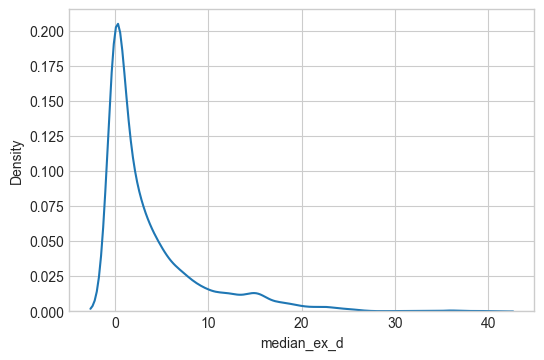

In [66]:
sns.kdeplot(data=df,x="median_ex_d")

<AxesSubplot:xlabel='median_ex_d', ylabel='strand'>

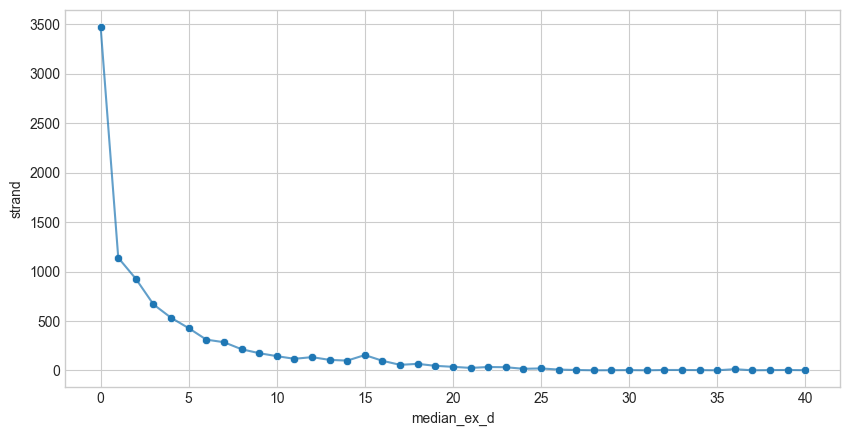

In [77]:
fig,ax=plt.subplots(figsize=(10,5))

sns.scatterplot(data=df.groupby(["median_ex_d"]).count(),x="median_ex_d",y="strand",ax=ax)
sns.lineplot(data=df.groupby(["median_ex_d"]).count(),x="median_ex_d",y="strand",ax=ax,alpha=0.7)

Let's wrap this up in a function.

In [80]:
def count_exons_up(isoseq,types=("IR",),progress_bar=True,region=None):
    
    data=[]
    
    for g in isoseq.iter_genes(progress_bar=progress_bar,region=region):
        sg=g.segment_graph
        
        for event in sg.find_splice_bubbles(types=types):
            
            start=sg[event[2]].start #event start
            end=sg[event[3]].end # event end
            
            n_exons_u=[]
            n_exons_d=[]
            n_exons=[]
            
            for trid in event[1]:
                exons=g.transcripts[trid]["exons"]
                exons_u=[e for e in exons if e[1]<=start] # exons upstream of the event
                exons_d=[e for e in exons if e[0]>=end] # exons downstream of the event
                
                n_exons_u.append(len(exons_u))
                n_exons_d.append(len(exons_d))
                n_exons.append(len(exons))
                
            if g.strand=="+":
                data.append((g.id,g.name,g.strand,math.floor(np.median(n_exons_d)),np.median(n_exons)))
                
            else:
                data.append((g.id,g.name,g.strand,math.floor(np.median(n_exons_u)),np.median(n_exons)))
                
    df=pd.DataFrame(data,columns=["gene_id","gene_name","strand","median_ex_d","median_ex_n"])
    return df

In [84]:
df=count_exons_up(isoseq,types=("IR",))

 81%|████████████████████████▏     | 560296/695092 [05:22<01:17, 1739.15genes/s]


KeyboardInterrupt: 

In [85]:
exons_counts={}

for t in ("IR","ES","5AS","3AS","ME"):
    df=count_exons_up(isoseq,types=(t,))
    exons_counts[t]=df

100%|██████████████████████████████| 695092/695092 [11:25<00:00, 1014.04genes/s]


In [95]:
def plot_exons_d(df,ax=None,tag=""):
    
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
        
    sns.scatterplot(data=df.groupby(["median_ex_d"]).count(),x="median_ex_d",y="strand",ax=ax)
    sns.lineplot(data=df.groupby(["median_ex_d"]).count(),x="median_ex_d",y="strand",ax=ax,alpha=0.7)
    tag=f"of {tag} events"
    ax.set_title(f"Median number of exons downstream {tag}")
    ax.set_ylabel("count")
    fig.tight_layout()

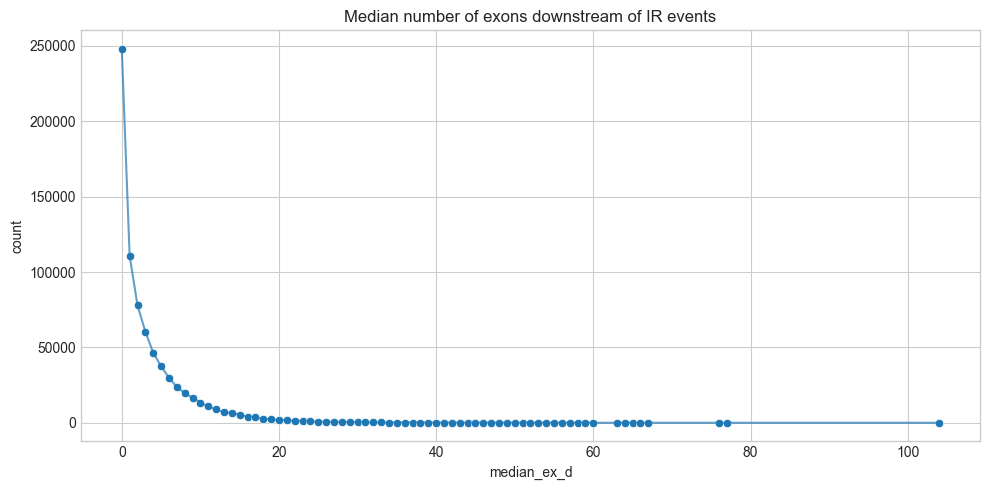

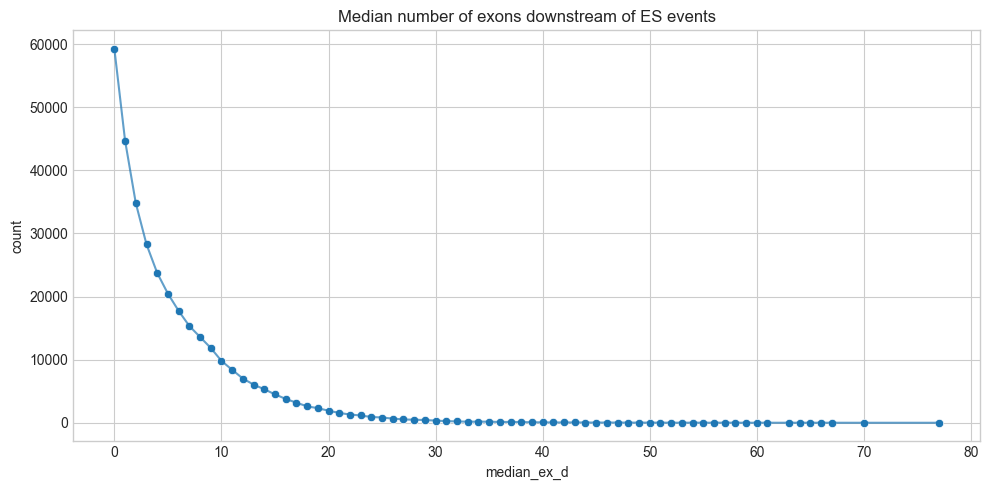

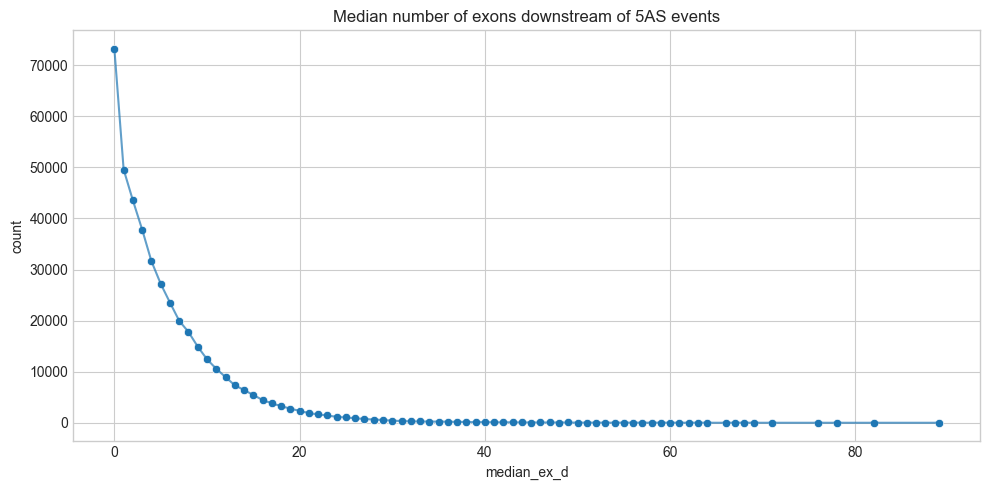

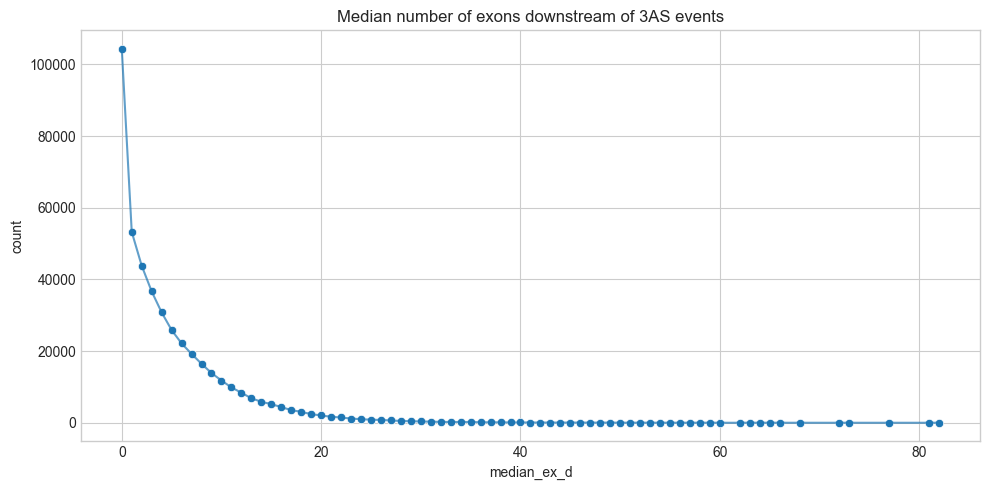

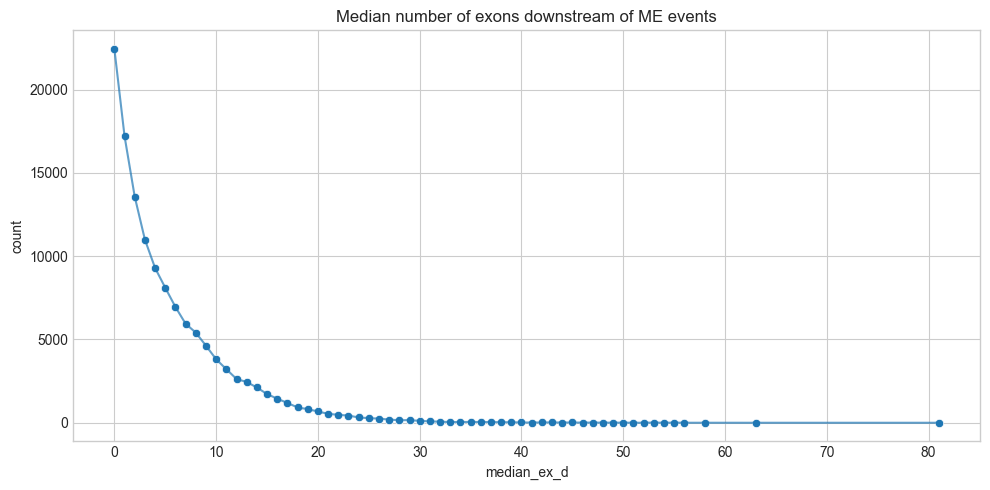

In [97]:
figures="./figures/exon_counts/"
for t,df in exons_counts.items():
    plot_exons_d(df,tag=t)
    plt.savefig(figures+f"median_ex_count_{t}.png")

#### no median approach

In [35]:
data=[]
#for g in isoseq.iter_genes(progress_bar=True,
samples=None
min_total=100
min_alt_fraction=.1
for g in isoseq.iter_genes(progress_bar=True,region="chr21"):
     
    if samples is None:
            cov = g.coverage.sum(axis=0)
    else:
        try:
            # Fast mode when testing several genes
            cov = g.coverage[samples].sum(0)
        except IndexError:
            # Fall back to looking up the sample indices
            from isotools._transcriptome_stats import _check_groups
            _, _, groups = _check_groups(g._transcriptome, [samples], 1)
            cov = g.coverage[groups[0]].sum(0)
                
    sg=g.segment_graph
        
    events=sg.find_splice_bubbles(types=("IR",))
    events = [e for e in events if _filter_event(cov, e, min_total=min_total, min_alt_fraction=min_alt_fraction)]
    for event in events:
        
        start=sg[event[2]].start #event start
        end=sg[event[3]].end # event end
        middle=(start+end)/2
        
        for trid in event[1]:
            exons=g.transcripts[trid]["exons"]
            
            #compute the normalized position of the transcript
            tr_start=exons[0][0]
            tr_end=exons[-1][1]
            norm_pos=(middle-tr_start)/(tr_end-tr_start)
            
            #compute the number of exons downstream and upstream 
            exons_u=[e for e in exons if e[1]<=start] # exons upstream of the event
            exons_d=[e for e in exons if e[0]>=end] # exons downstream of the event
            
            if g.strand=="+":
                data.append((g.id,g.name,g.strand,len(exons_d),len(exons_u),len(exons),start,end,trid,norm_pos,cov[trid]))
                
            else:
                data.append((g.id,g.name,g.strand,len(exons_u),len(exons_d),len(exons),start,end,trid,1-norm_pos,cov[trid]))
            

100%|██████████████████████████████████| 8911/8911 [00:03<00:00, 2328.30genes/s]


In [47]:
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 200
plt.style.use("seaborn-whitegrid")

In [37]:
s=exons[0][0]
e=exons[-1][1]
e-s
(middle-s)/(e-s)

0.7633031139140717

In [39]:
df=pd.DataFrame(data,columns=["gene_id","gene_name","strand","n_ex_d","n_ex_u","n_ex","start","end","trid","norm_pos","coverage"])


Some novel genes with low coverage normalize beyond one. Their coverage is low and therefore we discard them from the dataset.

In [40]:
df[df.norm_pos>1]

,gene_id,gene_name,strand,n_ex_d,n_ex_u,n_ex,start,end,trid,norm_pos,coverage


In [159]:
isoseq["PB_novel_48464"].transcripts[3]["coverage"]

{'lower_lobe_of_right_lung_ENCFF767KXS': 1,
 'endodermal_cell_ENCFF940WVU': 1,
 'K562_ENCFF661OEY': 1,
 'chondrocyte_ENCFF545CXA': 1,
 'WTC11_ENCFF373TKM': 1,
 'WTC11_ENCFF388HXU': 1,
 'mammary_epithelial_cell_ENCFF903XBV': 1,
 'progenitor_cell_of_endocrine_pancreas_ENCFF509GHY': 1,
 'right_cardiac_atrium_ENCFF911RNV': 1,
 'H9_ENCFF292UIE': 1,
 'HL-60_ENCFF600MGT': 1}

In [160]:
df=df[df.norm_pos<=1]

In [55]:
y,x=np.histogram(df.n_ex_d,bins=range(40),weights=df.coverage)

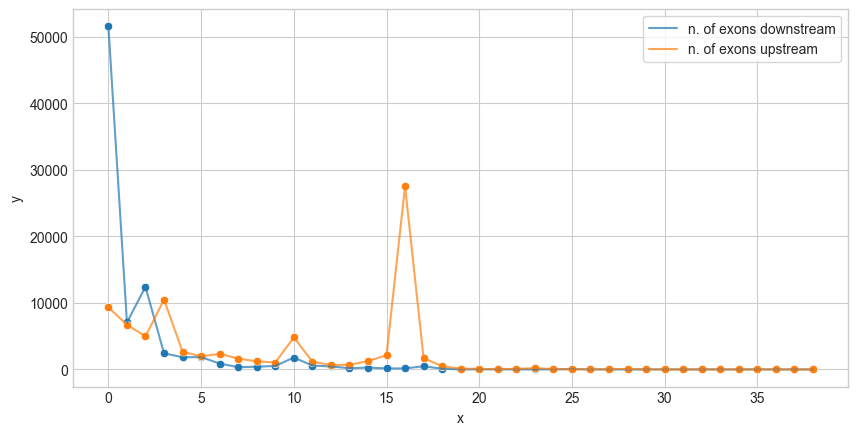

In [66]:
fig,ax=plt.subplots(figsize=(10,5))

y,x=np.histogram(df.n_ex_d,bins=range(40),weights=df.coverage)
y1,x1=np.histogram(df.n_ex_u,bins=range(40),weights=df.coverage)

df_temp=pd.DataFrame({"x":x[:-1],"y":y})
df_temp1=pd.DataFrame({"x":x1[:-1],"y":y1})

sns.scatterplot(data=df_temp,x="x",y="y",ax=ax)
sns.lineplot(data=df_temp,x="x",y="y",ax=ax,alpha=0.7,label="n. of exons downstream")
sns.scatterplot(data=df_temp1,x="x",y="y",ax=ax)
sns.lineplot(data=df_temp1,x="x",y="y",ax=ax,alpha=0.7,label="n. of exons upstream")
ax.legend(frameon=True)

<AxesSubplot:xlabel='norm_pos', ylabel='Density'>

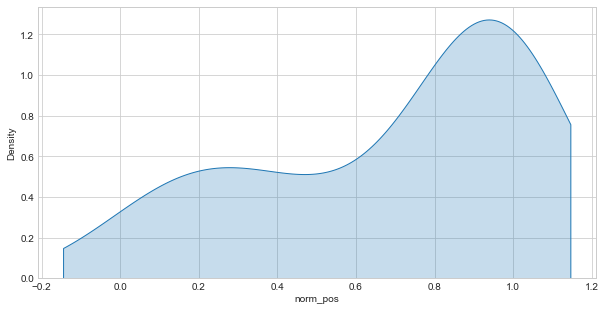

In [41]:
fig,ax=plt.subplots(figsize=(10,5))

sns.kdeplot(data=df,x="norm_pos",ax=ax,fill=True,weights="coverage")

In [67]:
def count_exons_up(isoseq,types=("IR",),progress_bar=True,region=None,samples=None,min_total=100,min_alt_fraction=.1):
    
    data=[]
    
    for g in isoseq.iter_genes(progress_bar=progress_bar,region=region):
        sg=g.segment_graph
        
        if samples is None:
            cov = g.coverage.sum(axis=0)
            
        else:
            try:
                # Fast mode when testing several genes
                cov = g.coverage[np.array(samples)].sum(0)
                
            except IndexError:
                # Fall back to looking up the sample indices
                from isotools._transcriptome_stats import _check_groups
                _, _, groups = _check_groups(g._transcriptome, [samples], 1)
                cov = g.coverage[np.array(groups[0])].sum(0)
                
        sg=g.segment_graph
        
        events=sg.find_splice_bubbles(types=types)
        events = [e for e in events if _filter_event(cov, e, min_total=min_total, min_alt_fraction=min_alt_fraction)]
        
        for event in events:
            
            start=sg[event[2]].start #event start
            end=sg[event[3]].end # event end
            middle=(start+end)/2
            
            for trid in event[1]:
                exons=g.transcripts[trid]["exons"]
                
                #compute the normalized position of the transcript
                tr_start=exons[0][0]
                tr_end=exons[-1][1]
                norm_pos=(middle-tr_start)/(tr_end-tr_start)
                
                #compute the number of exons downstream and upstream 
                exons_u=[e for e in exons if e[1]<=start] # exons upstream of the event
                exons_d=[e for e in exons if e[0]>=end] # exons downstream of the event
                
            if g.strand=="+":
                data.append((g.id,g.name,g.strand,len(exons_d),len(exons_u),len(exons),start,end,trid,norm_pos,cov[trid]))
            else:
                data.append((g.id,g.name,g.strand,len(exons_u),len(exons_d),len(exons),start,end,trid,1-norm_pos,cov[trid]))
                
    df=pd.DataFrame(data,columns=["gene_id","gene_name","strand","n_ex_d","n_ex_u","n_ex","start","end","trid","norm_pos","coverage"])
    print(f"{sum(df.norm_pos>1)} datapoints dropped due abnormal position upstream.")
    df=df[df.norm_pos<=1]
    print(f"{sum(df.norm_pos<0)} datapoints dropped due abnormal position downstream.")
    df=df[df.norm_pos>=0]
    return df

In [70]:
def plot_exons_d(df,ax=None,tag=""):
    
    if ax is None:
        fig,ax=plt.subplots(figsize=(10,5))
    
    y1,x1=np.histogram(df.n_ex_d,bins=range(40),weights=df.coverage)
    y2,x2=np.histogram(df.n_ex_u,bins=range(40),weights=df.coverage)
    
    df_temp1=pd.DataFrame({"x":x1[:-1],"y":y1})
    df_temp2=pd.DataFrame({"x":x2[:-1],"y":y2})

    sns.scatterplot(data=df_temp,x="x",y="y",ax=ax)
    sns.lineplot(data=df_temp,x="x",y="y",ax=ax,alpha=0.7,label="n. of exons downstream")
    sns.scatterplot(data=df_temp1,x="x",y="y",ax=ax)
    sns.lineplot(data=df_temp1,x="x",y="y",ax=ax,alpha=0.7,label="n. of exons upstream")
    ax.legend(frameon=True)
    tag=f"of {tag} events"
    ax.set_title(f"Number of exons downstream {tag}")
    ax.set_ylabel("count")
    ax.set_xlabel("n_exons")
    fig.tight_layout()

In [71]:
tbl_path="./tables/exon_counts/"
files=[x.name for x in Path(tbl_path).iterdir()]

exons_counts={}

for t in ("IR","ES","5AS","3AS","ME"):
    
    fname=f"exon_count_{t}.csv"
    
    if fname not in files:
        df=count_exons_up(isoseq,types=(t,),min_total=5,min_alt_fraction=.01)
        exons_counts[t]=df
        df.to_csv(tbl_path+fname,index=False)
        
    else:
        exons_counts[t]=pd.read_csv(tbl_path+fname)

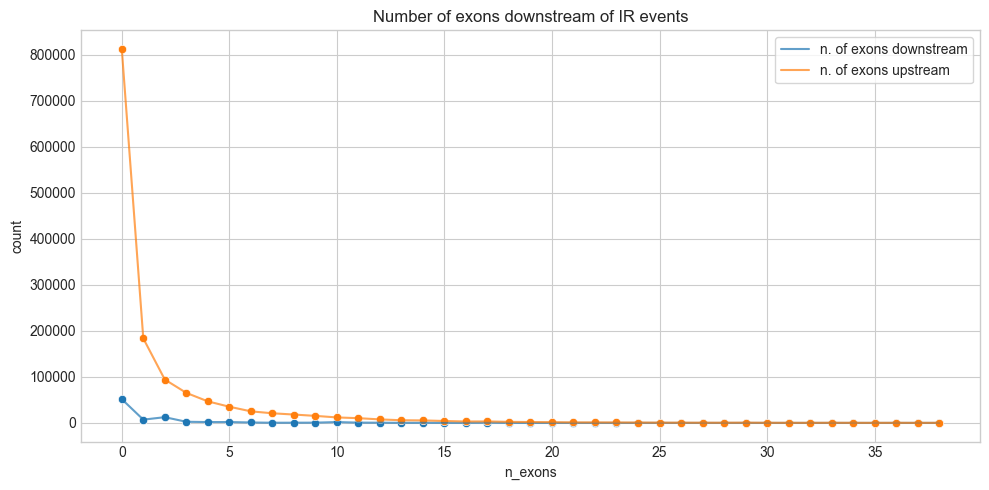

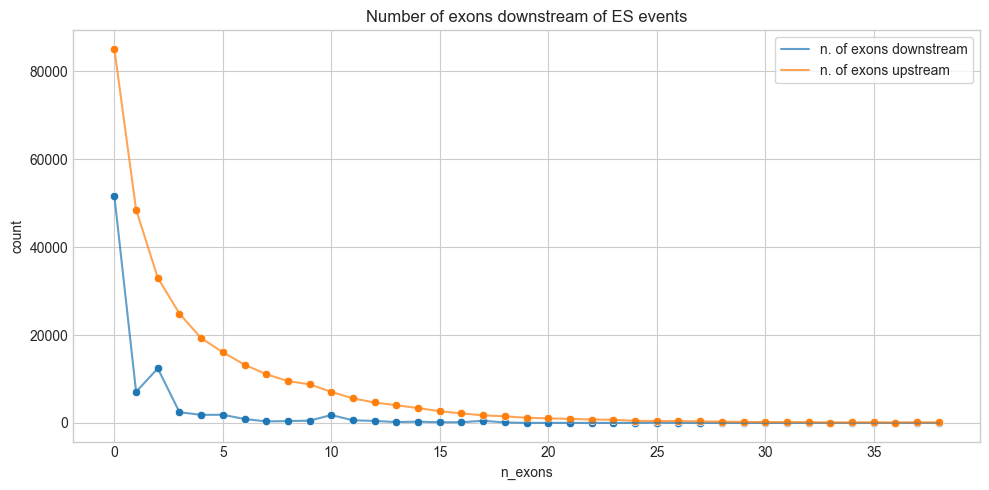

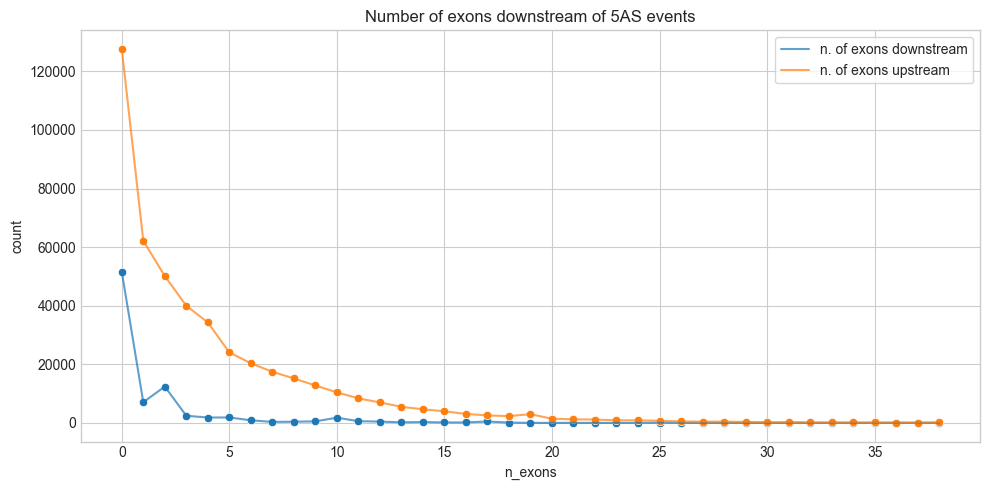

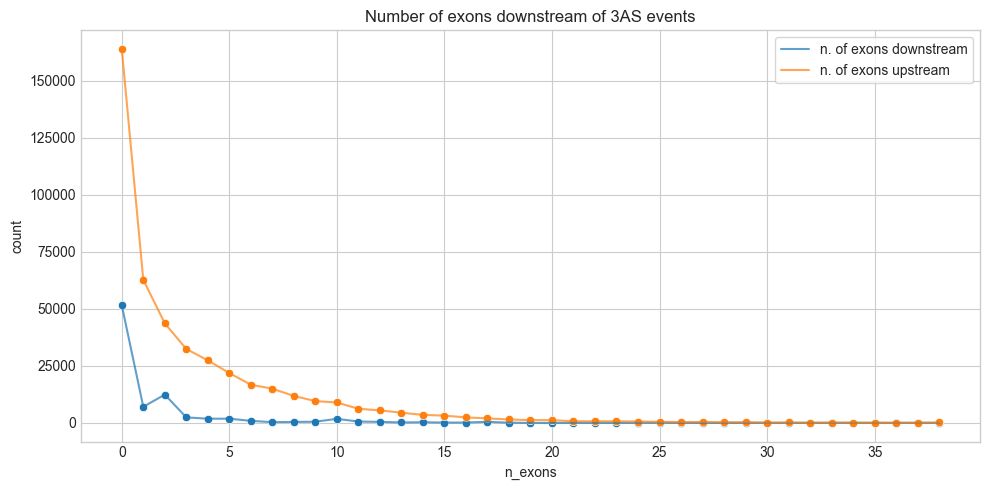

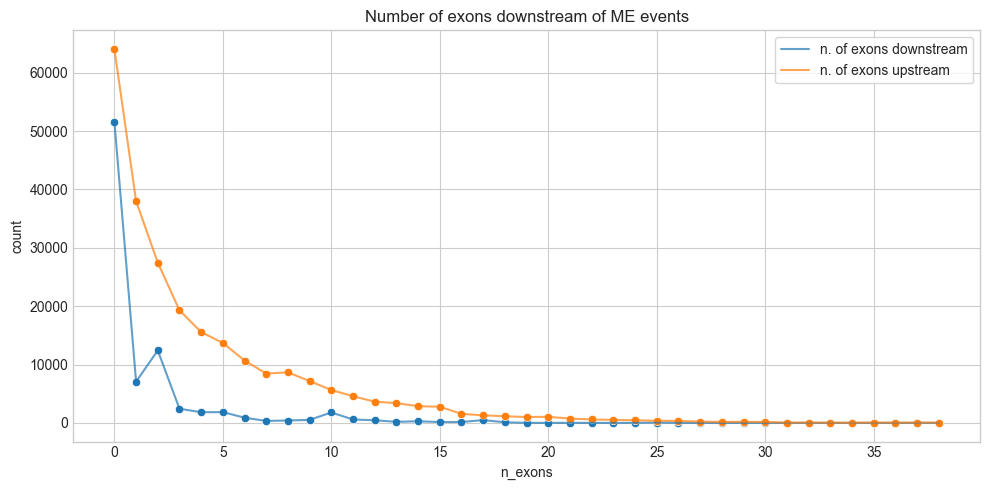

In [72]:
figures="./figures/exon_counts/"
for t,df in exons_counts.items(): 
    plot_exons_d(df,tag=t)
    plt.savefig(figures+f"ex_count_{t}.png")

In [73]:
#for t,df in exons_counts.items():
 #   for d,u in zip(df.n_ex_d,df.n_ex):
  #      sns.kdeplot(df.n_ex_d/df.n_ex_u)

In [76]:
for t in ("IR","ES","5AS","3AS","ME"):
    exons_counts[t]["frac"]=((exons_counts[t].n_ex_d+0.1)/(exons_counts[t].n_ex_u+0.1)*exons_counts[t].coverage)

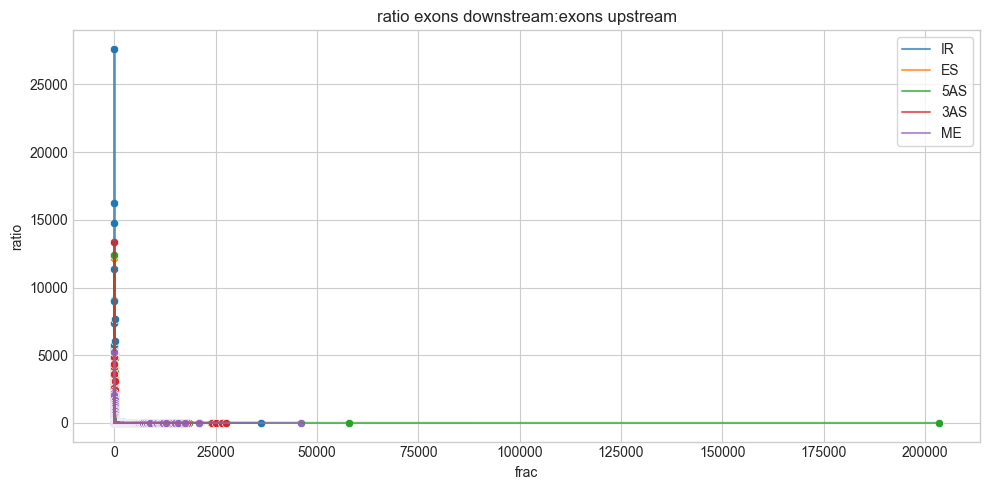

In [101]:
fig,ax=plt.subplots(figsize=(10,5))
for t,df in exons_counts.items():
    #y,x=np.histogram(df.n_ex_d,bins=range(40),weights=df.coverage)
    sns.scatterplot(data=df.groupby(["frac"]).count(),x="frac",y="strand",ax=ax)
    sns.lineplot(data=df.groupby(["frac"]).count(),x="frac",y="strand",ax=ax,alpha=0.7,label=t)
ax.legend(frameon=True)
ax.set_title(f"ratio exons downstream:exons upstream")
ax.set_ylabel("ratio")
fig.tight_layout()

plt.savefig(figures+f"ex_ratio.png")

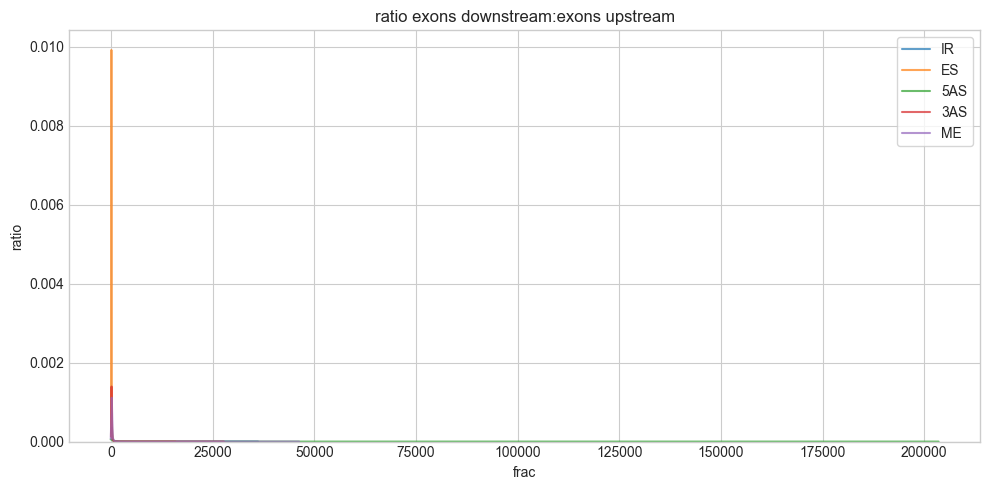

In [78]:
fig,ax=plt.subplots(figsize=(10,5))
for t,df in exons_counts.items():
    #sns.scatterplot(data=df.groupby(["frac"]).count(),x="frac",y="strand",ax=ax)
    sns.kdeplot(data=df,x="frac",ax=ax,alpha=0.7,label=t)
ax.legend(frameon=True)
ax.set_title(f"ratio exons downstream:exons upstream")
ax.set_ylabel("ratio")
fig.tight_layout()


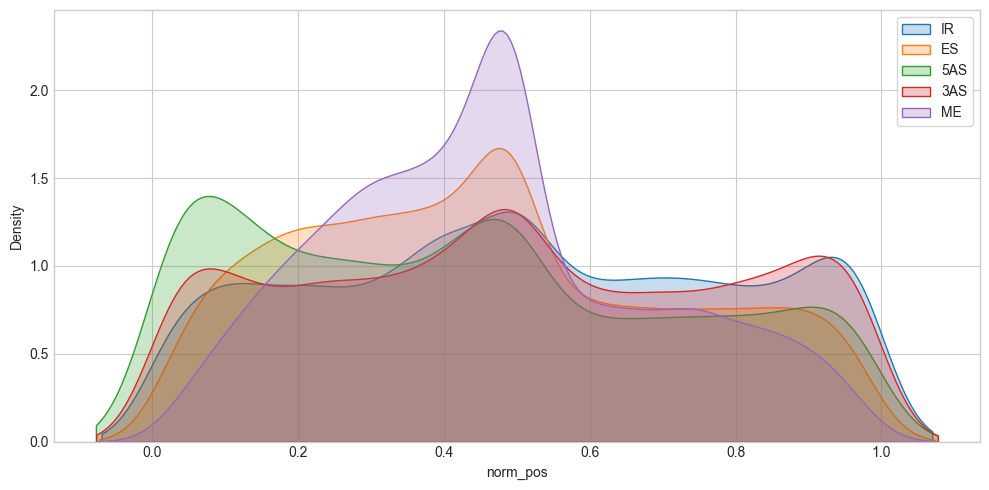

In [80]:
fig,ax=plt.subplots(figsize=(10,5))

for t,df in exons_counts.items():
    sns.kdeplot(data=df,x="norm_pos",ax=ax,fill=True,label=t,weights="coverage")

ax.legend(frameon=True)
fig.tight_layout()

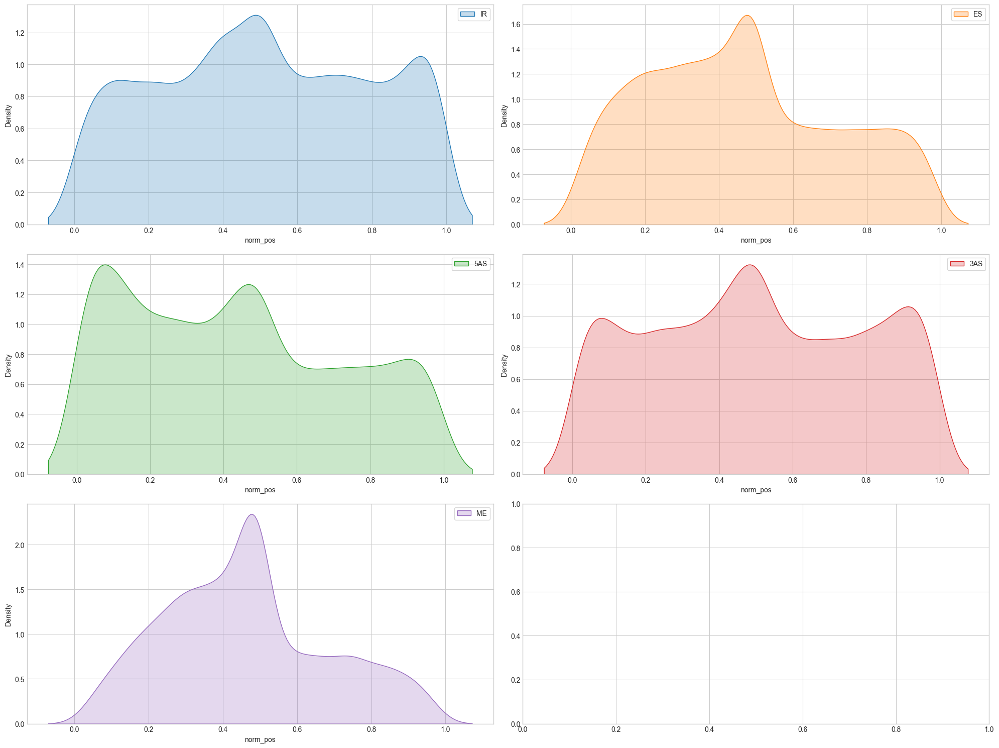

In [81]:
fig,axs=plt.subplots(figsize=(10*2,5*3),ncols=2,nrows=3)

indeces=list(itertools.product([0,1,2],[0,1]))
colors=sns.color_palette()
i=0

for t,df in exons_counts.items():
    ax=axs[indeces[i]]
    sns.kdeplot(data=df,x="norm_pos",ax=ax,fill=True,label=t,color=colors[i],weights="coverage")
    i+=1
    ax.legend(frameon=True)
    fig.tight_layout()

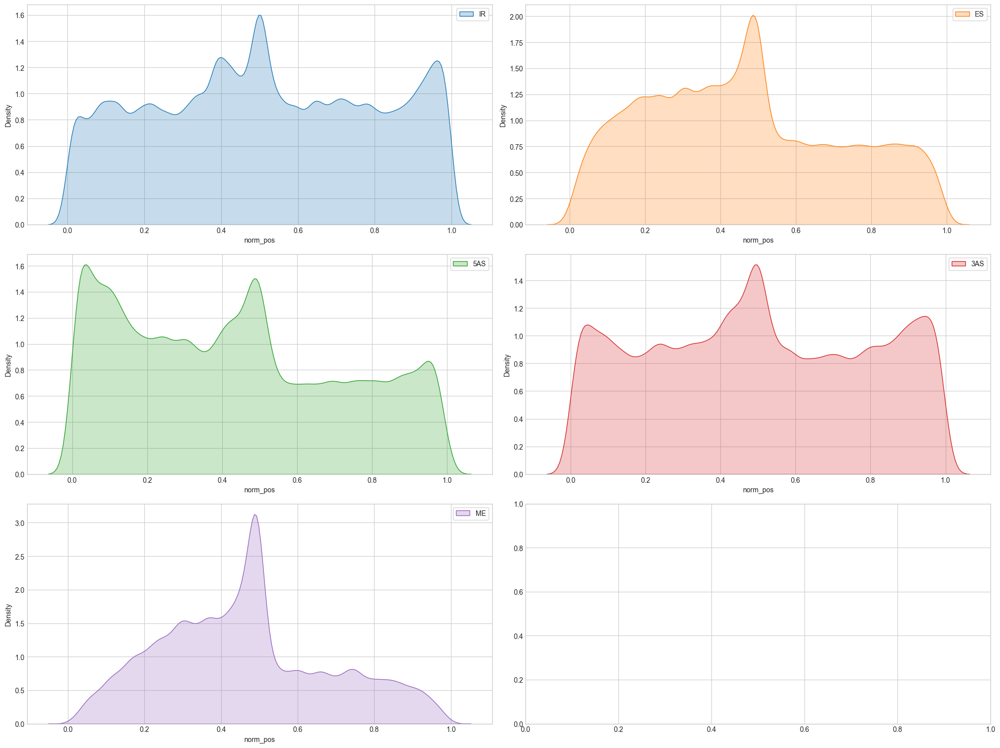

In [94]:
fig,axs=plt.subplots(figsize=(10*2,5*3),ncols=2,nrows=3)

indeces=list(itertools.product([0,1,2],[0,1]))
colors=sns.color_palette()
i=0

for t,df in exons_counts.items():
    ax=axs[indeces[i]]
    re_df=reindex_df(df,"coverage")
    sns.kdeplot(data=re_df,x="norm_pos",ax=ax,fill=True,label=t,color=colors[i])
    i+=1
    ax.legend(frameon=True)
    fig.tight_layout()

In [82]:
dfg=pd.DataFrame({"gene_id":[],"gene_name":[],"strand":[],"n_ex_d":[],"n_ex":[],"start":[],"end":[],"trid":[],"type":[]})
for t,df in exons_counts.items():
    df["type"]=t
    dfg=pd.concat([dfg,df])
dfg=dfg.reset_index(drop=True)

In [86]:
def reindex_df(df, weight_col):
    """expand the dataframe to prepare for resampling
    result is 1 row per count per sample"""
    df = df.reindex(df.index.repeat(df[weight_col]))
    df.reset_index(drop=True, inplace=True)
    return(df)

In [87]:
dfg=reindex_df(dfg,"coverage")

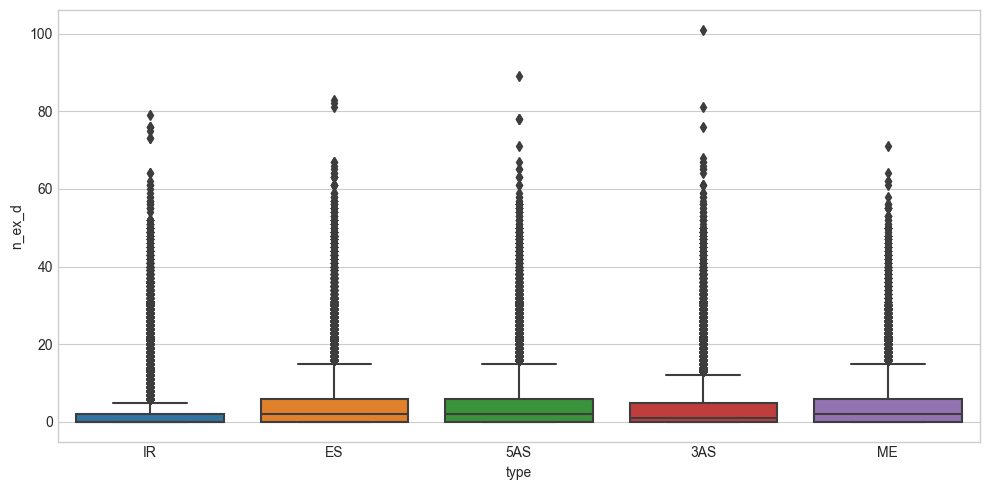

In [89]:
fig,ax=plt.subplots(figsize=(10,5))
sns.boxplot(data=dfg,x="type",y="n_ex_d",ax=ax)
fig.tight_layout()

In [90]:
dfg["log(n_ex_d)"]=np.log10(dfg.n_ex_d+1)

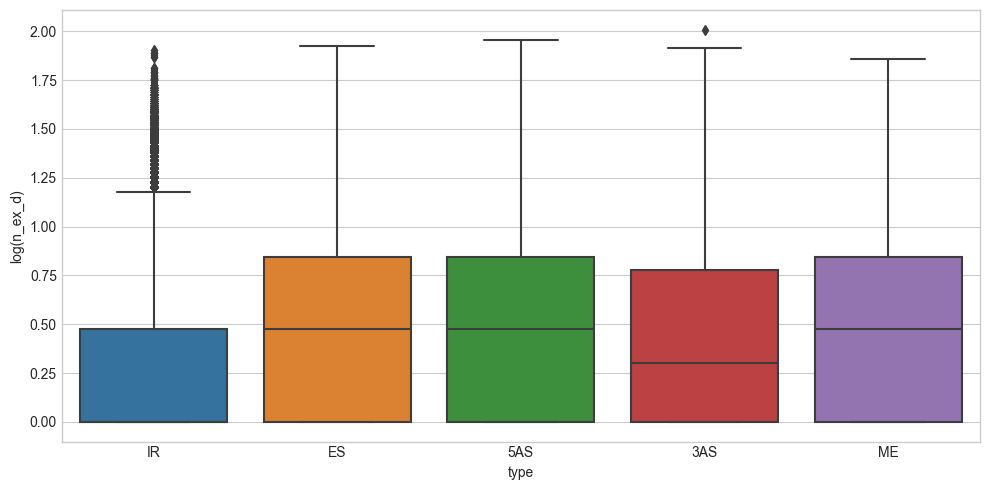

In [91]:
fig,ax=plt.subplots(figsize=(10,5))
sns.boxplot(data=dfg,x="type",y="log(n_ex_d)",ax=ax,saturation=0.7)
fig.tight_layout()

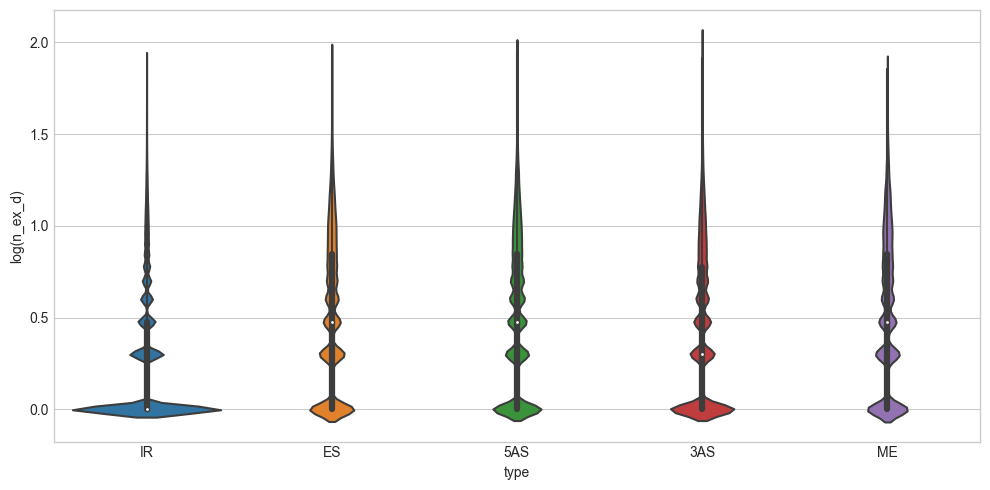

In [92]:
fig,ax=plt.subplots(figsize=(10,5))
sns.violinplot(data=dfg,x="type",y="log(n_ex_d)",ax=ax)
fig.tight_layout()

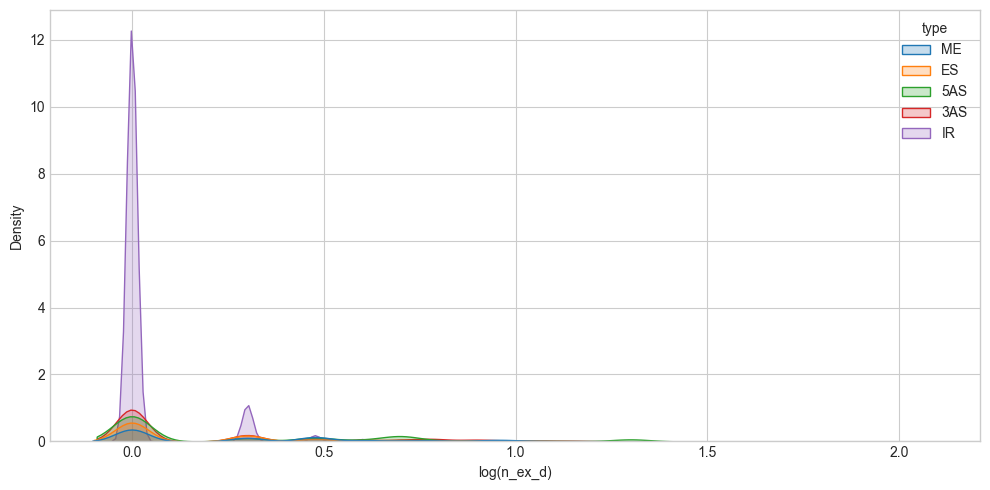

In [95]:
fig,ax=plt.subplots(figsize=(10,5))
sns.kdeplot(data=dfg,x="log(n_ex_d)",hue="type",ax=ax,hue_order=["ME","ES","5AS","3AS","IR"],fill=True,weights="coverage")
fig.tight_layout()

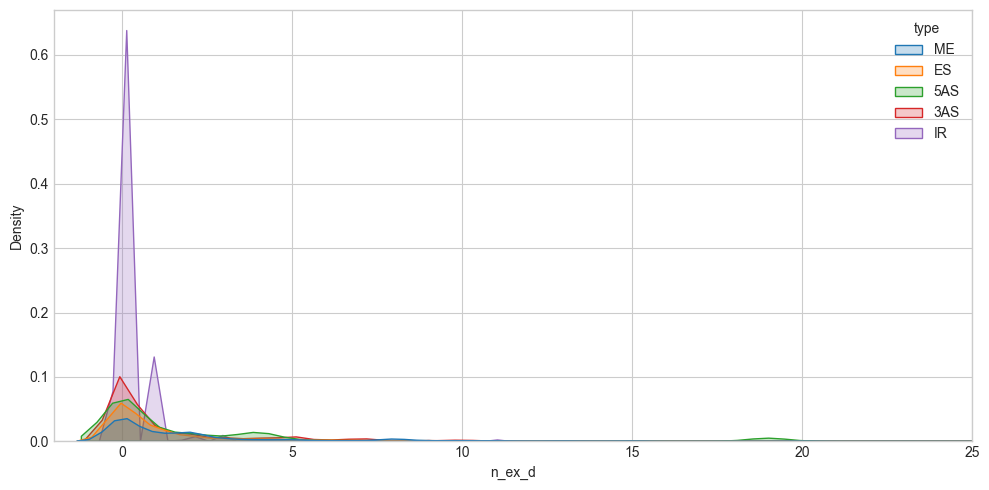

In [96]:
fig,ax=plt.subplots(figsize=(10,5))
ax.set_xlim([-2,25])
sns.kdeplot(data=dfg,x="n_ex_d",hue="type",ax=ax,hue_order=["ME","ES","5AS","3AS","IR"],fill=True,weights="coverage")
fig.tight_layout()

#### by chromosome

What if we again look at the same results but divided by chromosome?

In [139]:
chromosomes=["chr"+str(n) for n in range(1,23)]
chromosomes.extend(["chrX","chrY"])
chromosomes

['chr1',
 'chr2',
 'chr3',
 'chr4',
 'chr5',
 'chr6',
 'chr7',
 'chr8',
 'chr9',
 'chr10',
 'chr11',
 'chr12',
 'chr13',
 'chr14',
 'chr15',
 'chr16',
 'chr17',
 'chr18',
 'chr19',
 'chr20',
 'chr21',
 'chr22',
 'chrX',
 'chrY']

In [145]:
tbl_path="./tables/exon_counts/"
files=[x.name for x in Path(tbl_path).iterdir()]

exons_counts_chr={}

for t in ("IR",): #"ES","5AS","3AS","ME"):
    for chrom in chromosomes:
        fname=f"exon_count_{t}_{chrom}.csv"
        
        if fname not in files:
            df=count_exons_up(isoseq,types=(t,),region=chrom)
            exons_counts_chr[t+chrom]=df
            df.to_csv(tbl_path+fname,index=False)
            
        else:
            exons_counts_chr[t+chrom]=pd.read_csv(tbl_path+fname)

/scratch/local/ipykernel_69442/3436746700.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=plt.subplots(figsize=(10,5))


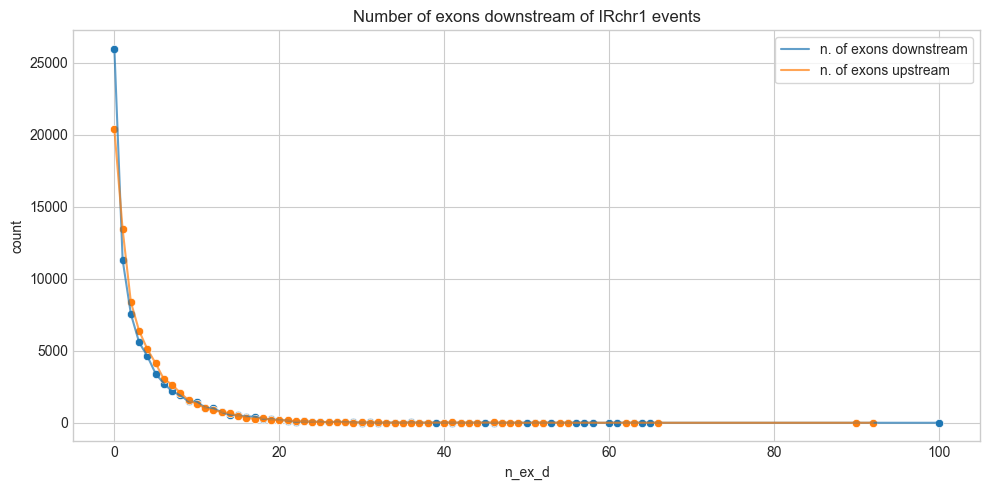

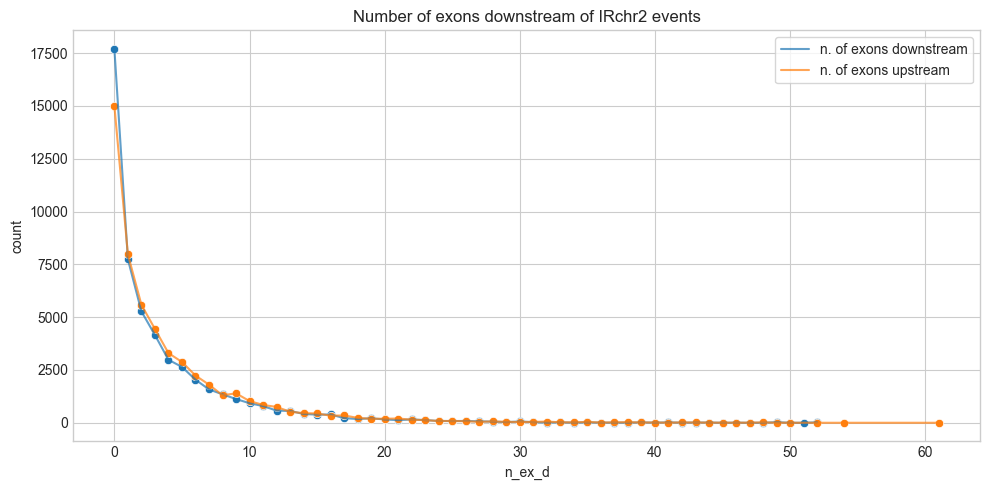

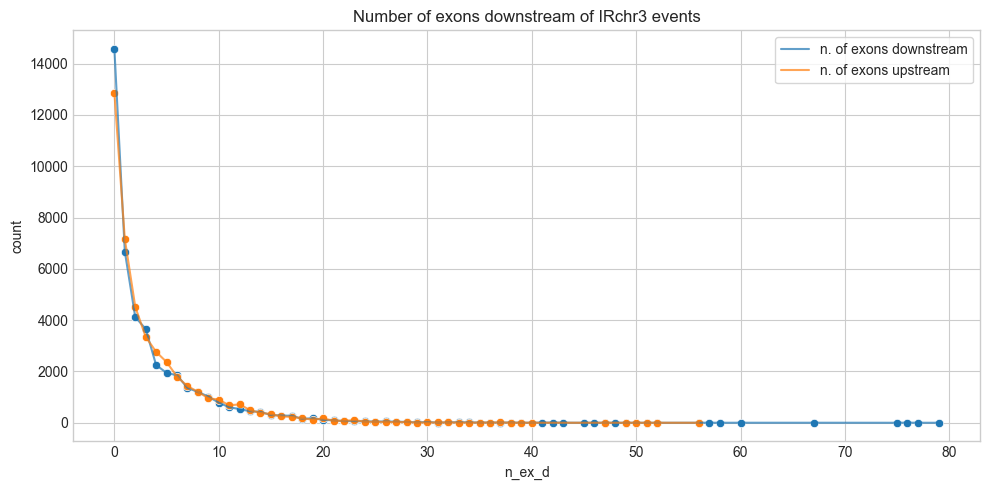

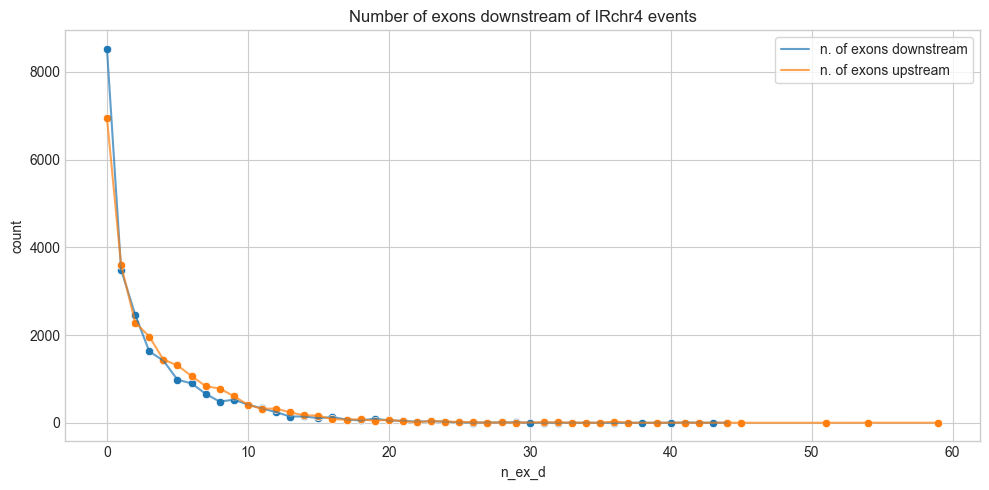

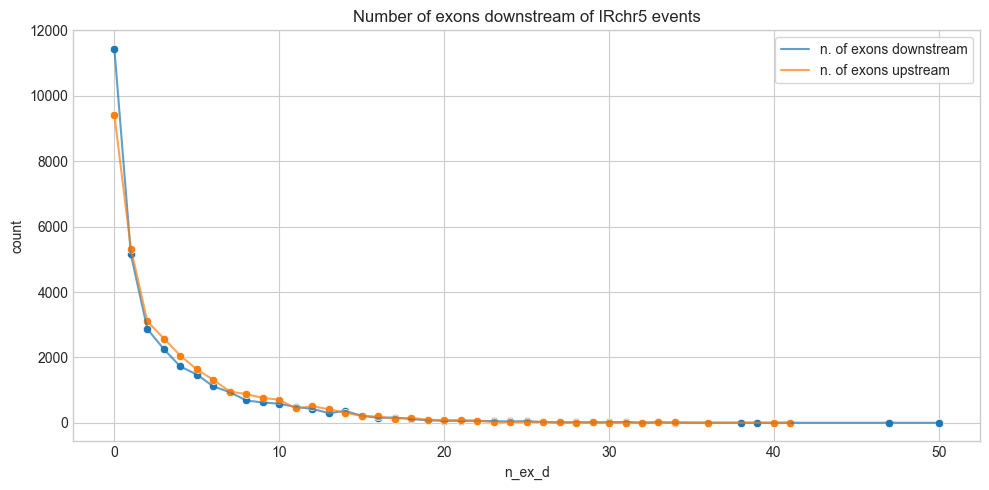

...

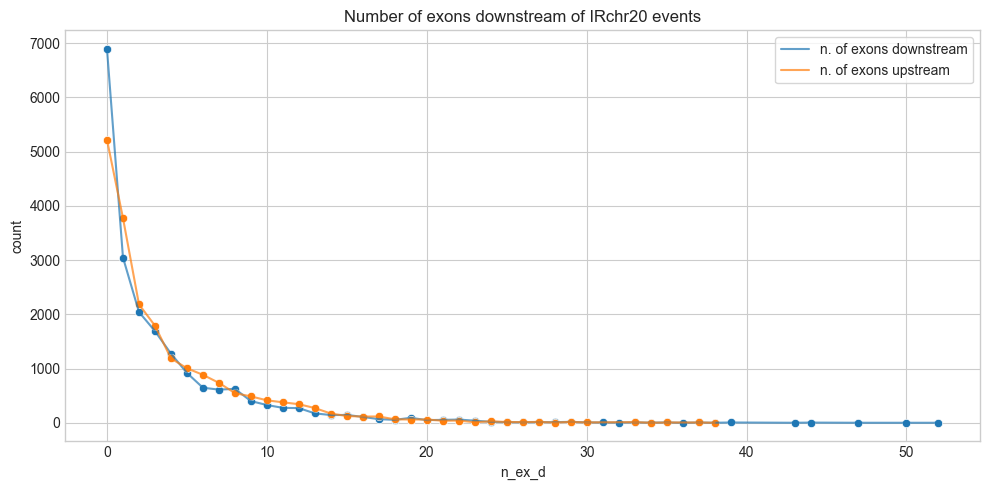

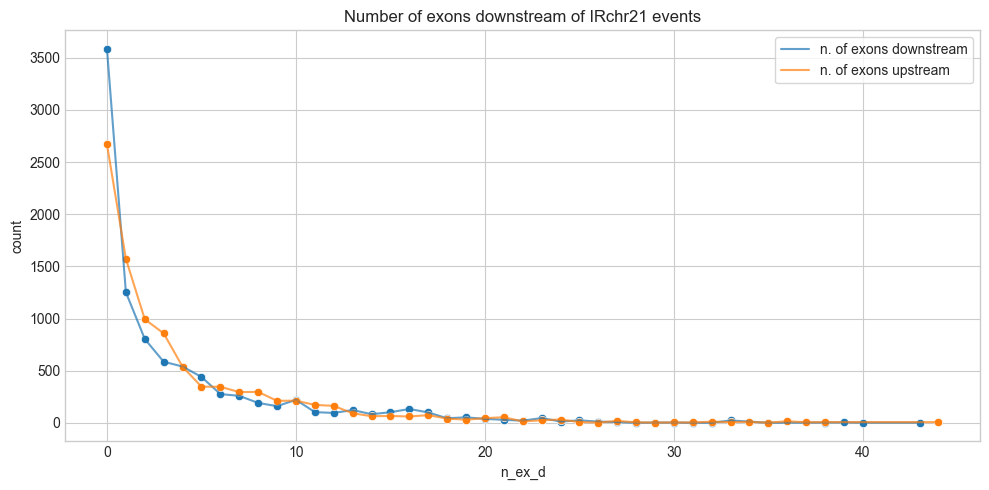

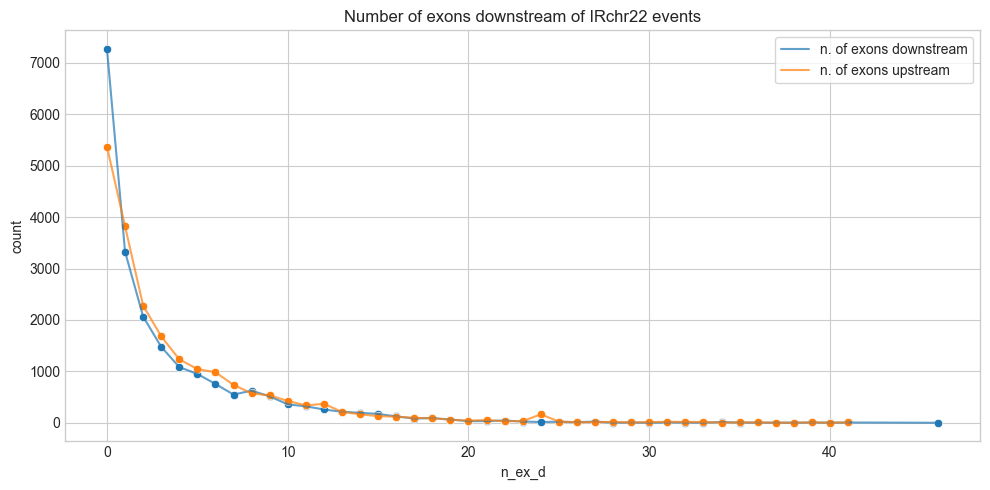

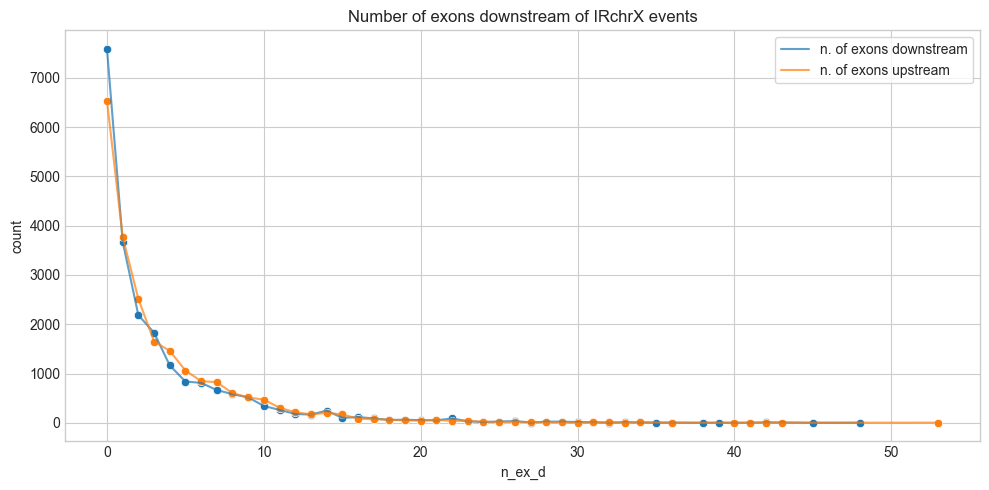

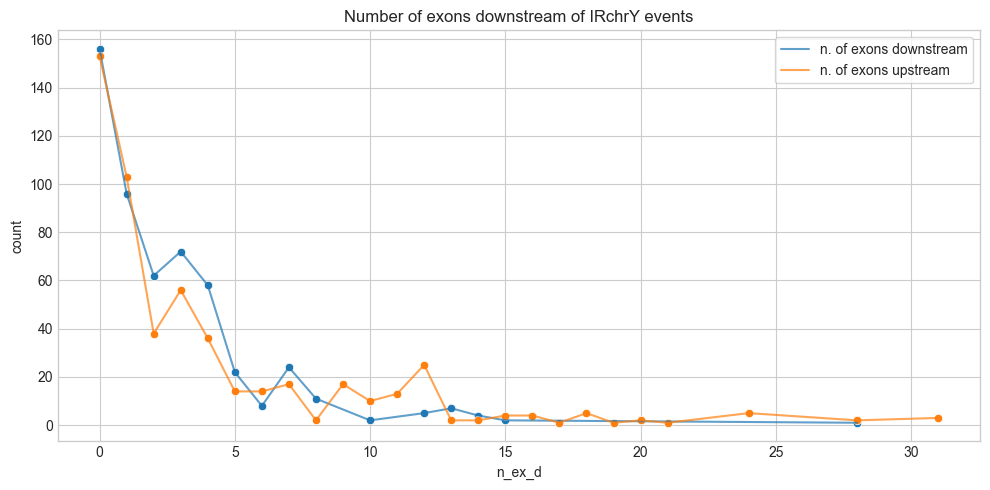

In [ ]:
for t,df in exons_counts_chr.items(): 
    plot_exons_d(df,tag=t)

In [147]:
exons_counts_chr.keys()

dict_keys(['IRchr1', 'IRchr2', 'IRchr3', 'IRchr4', 'IRchr5', 'IRchr6', 'IRchr7', 'IRchr8', 'IRchr9', 'IRchr10', 'IRchr11', 'IRchr12', 'IRchr13', 'IRchr14', 'IRchr15', 'IRchr16', 'IRchr17', 'IRchr18', 'IRchr19', 'IRchr20', 'IRchr21', 'IRchr22', 'IRchrX', 'IRchrY'])

#### by sample type

In [97]:
stypes={}

for stype in ('cell line', 'in vitro differentiated cells', 'primary cell', 'tissue'):
    stypes[stype]=list(stbl.name[stbl.sample_type==stype])


In [98]:
tbl_path="./tables/exon_counts/"
files=[x.name for x in Path(tbl_path).iterdir()]

exons_counts_st={}

for t in ("IR","ES","5AS","3AS","ME"):
    for stype,samples in stypes.items():
        s=stype.replace(" ","_")
        fname=f"exon_count_{t}_{s}.csv"
        
        if fname not in files:
            df=count_exons_up(isoseq,types=(t,),samples=samples,min_total=5,min_alt_fraction=.01)
            exons_counts_st[(t,s)]=df
            df.to_csv(tbl_path+fname,index=False)
            
        else:
            exons_counts_st[(t,s)]=pd.read_csv(tbl_path+fname)

100%|███████████████████████████████| 695092/695092 [30:56<00:00, 374.41genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [28:15<00:00, 410.04genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [22:57<00:00, 504.50genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [31:48<00:00, 364.27genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [30:32<00:00, 379.38genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [28:19<00:00, 409.03genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [22:59<00:00, 503.73genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [32:02<00:00, 361.51genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [30:32<00:00, 379.36genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [28:17<00:00, 409.37genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [23:01<00:00, 502.99genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [32:03<00:00, 361.43genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [30:34<00:00, 378.93genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [27:43<00:00, 417.92genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [22:27<00:00, 515.80genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [30:49<00:00, 375.83genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [36:28<00:00, 317.57genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [34:59<00:00, 331.13genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [29:57<00:00, 386.73genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [38:51<00:00, 298.13genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


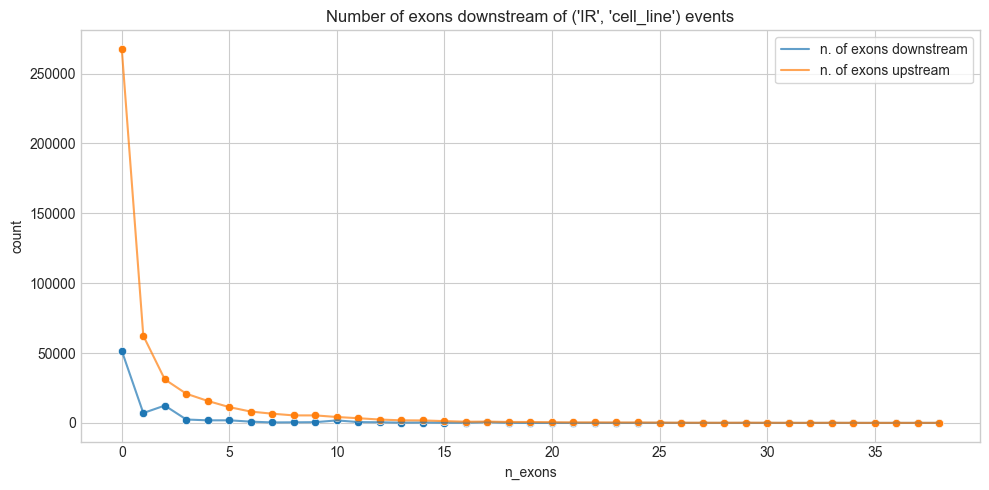

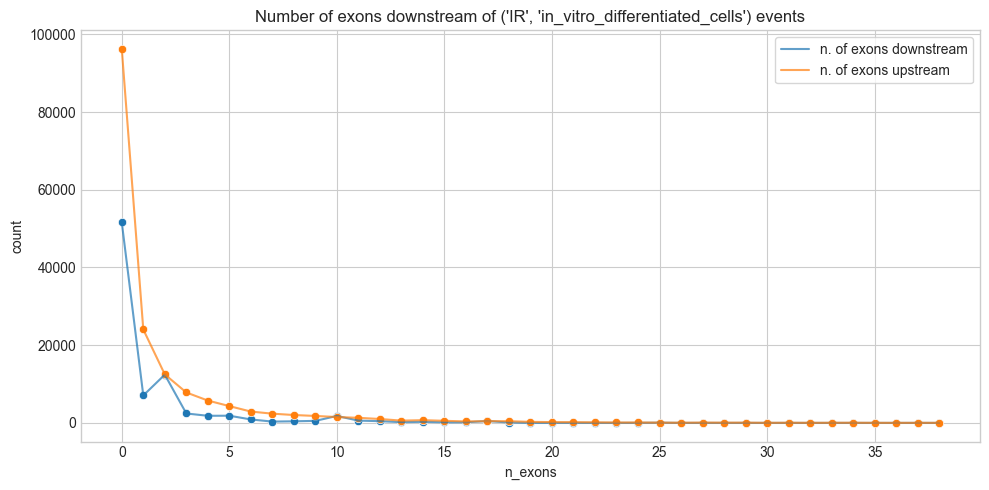

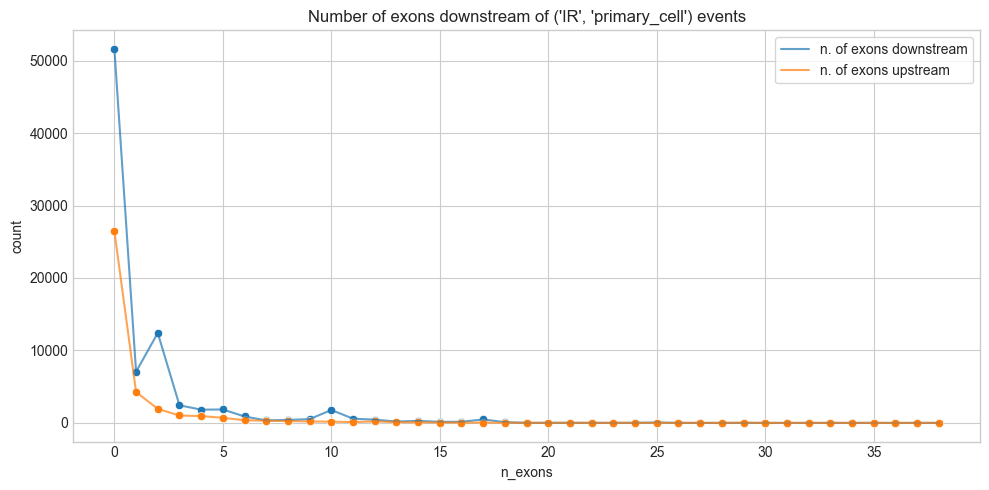

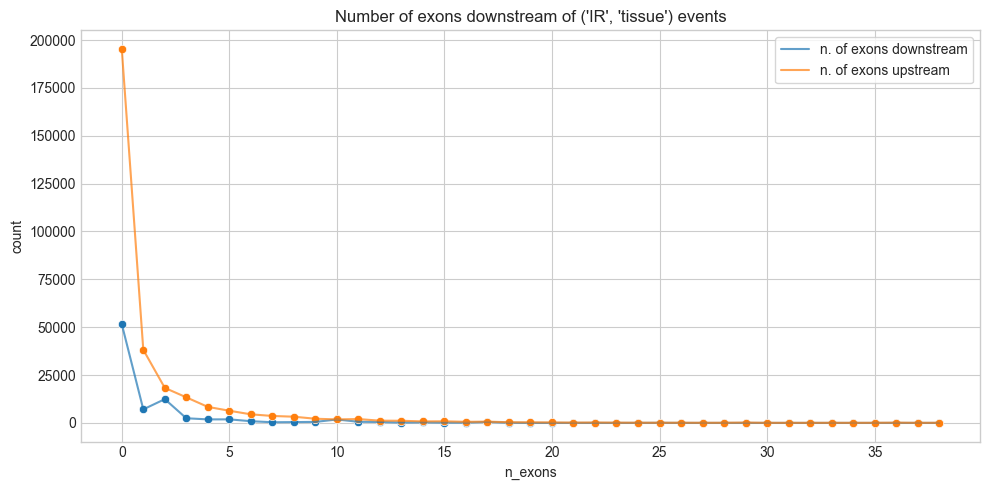

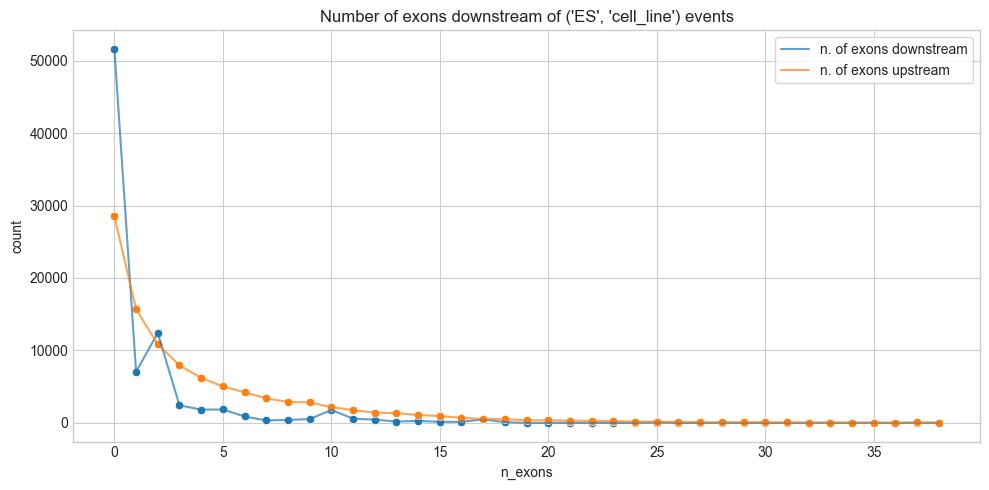

...

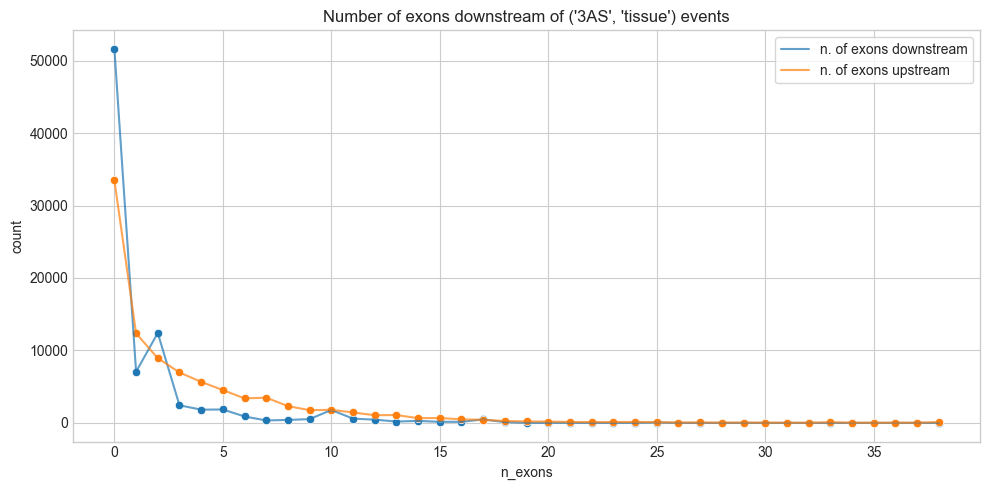

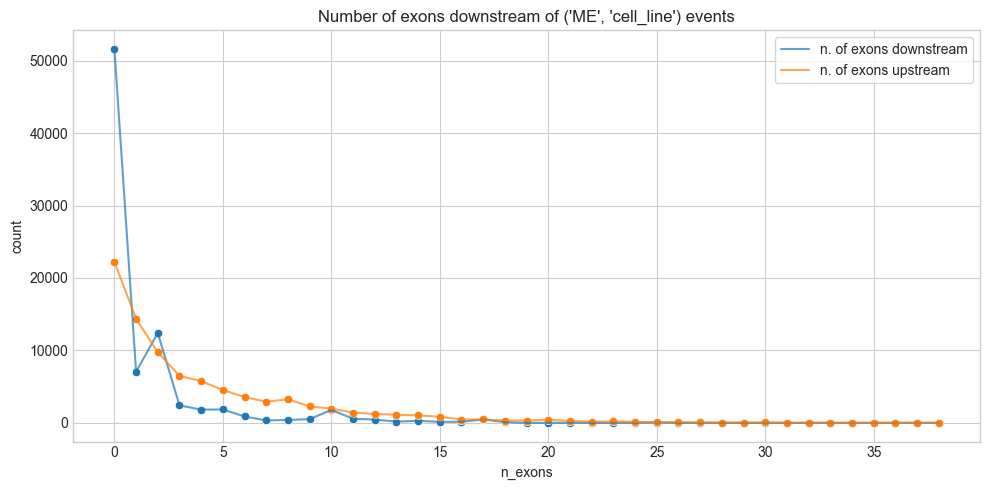

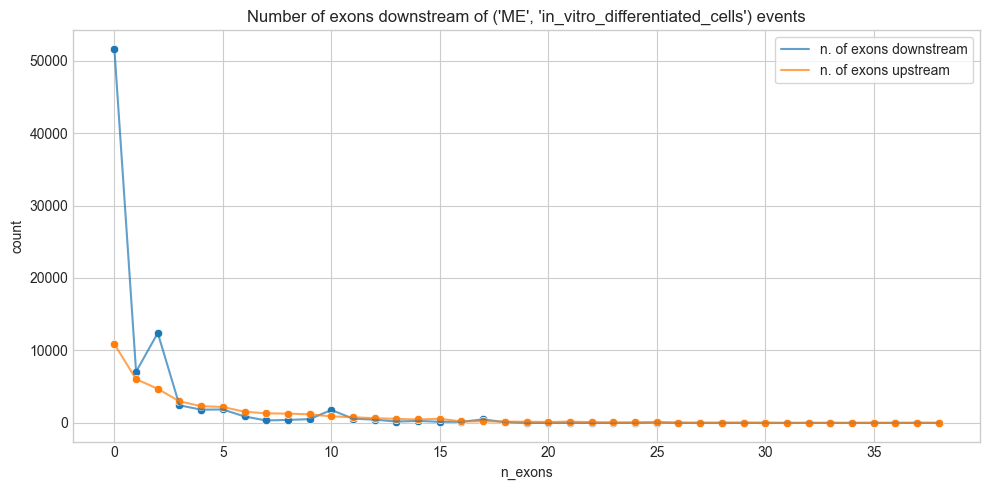

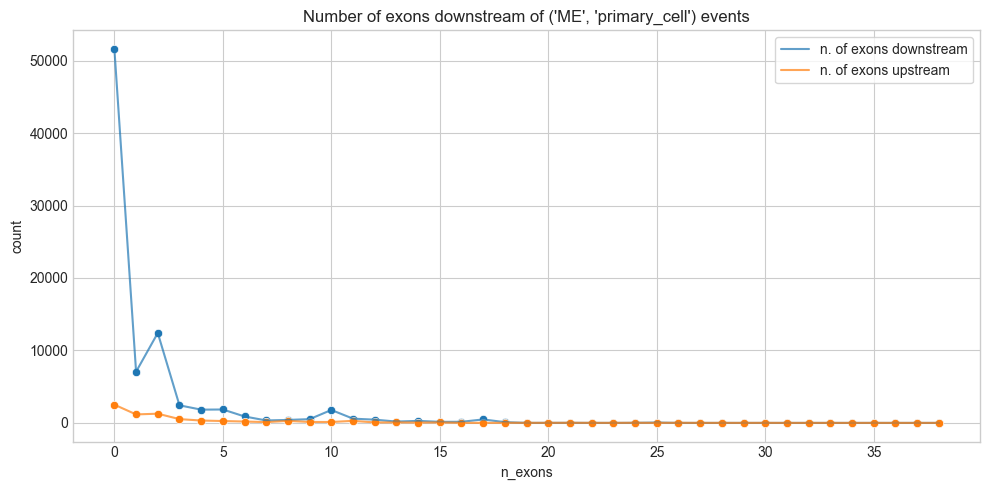

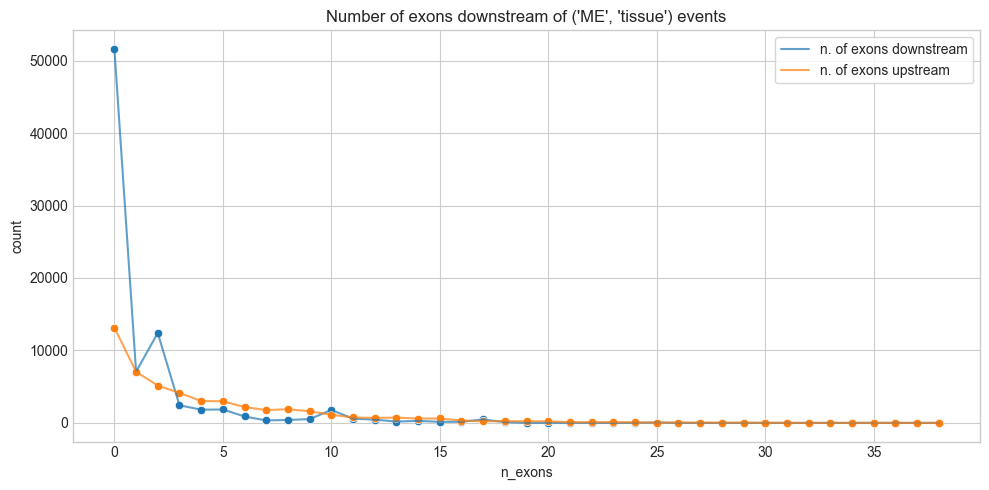

In [99]:
for t,df in exons_counts_st.items(): 
    plot_exons_d(df,tag=t)

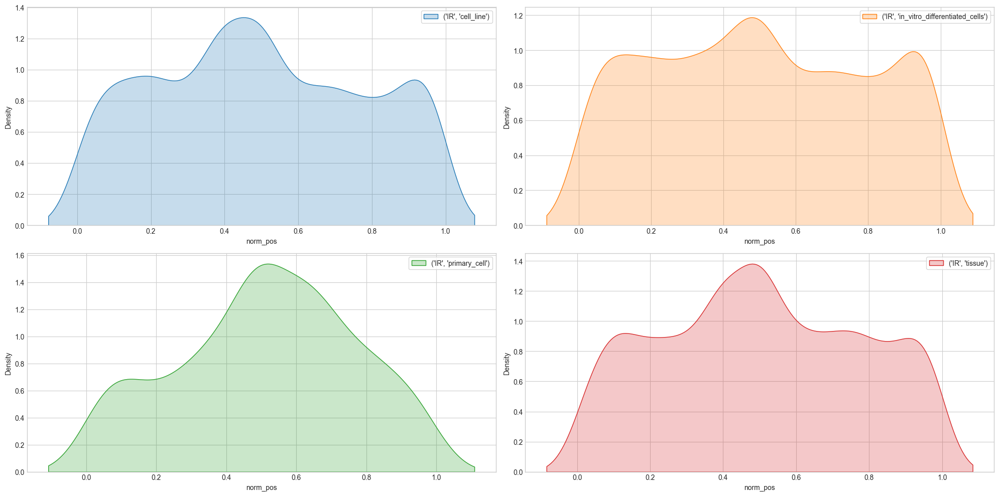

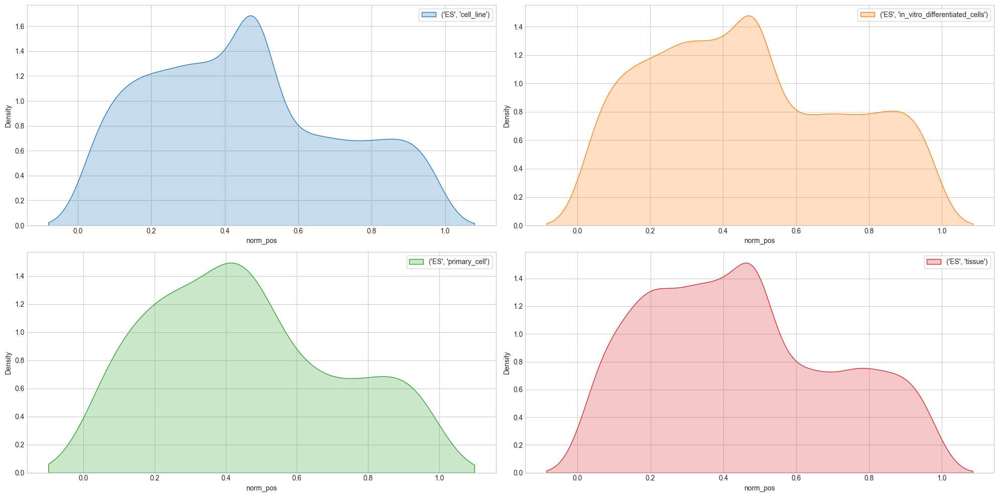

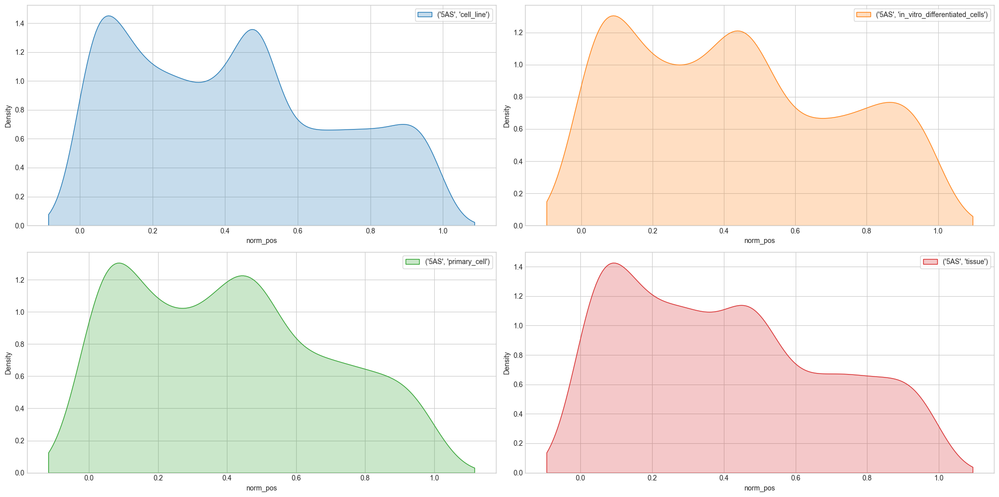

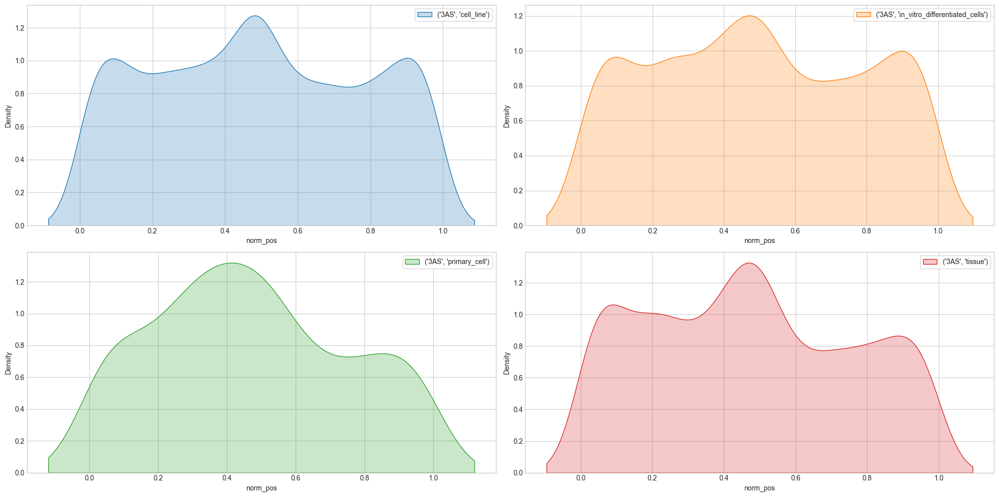

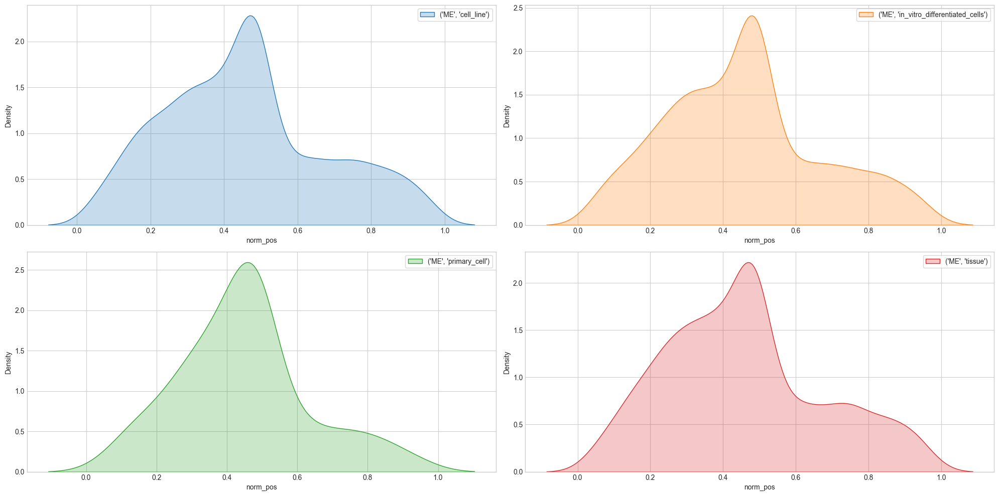

In [103]:
for t in ("IR","ES","5AS","3AS","ME"):
    fig,axs=plt.subplots(figsize=(10*2,5*2),ncols=2,nrows=2)
    indeces=list(itertools.product([0,1],[0,1]))
    colors=sns.color_palette()
    i=0
    for k,df in exons_counts_st.items():
        if t in k:
            ax=axs[indeces[i]]
            sns.kdeplot(data=df,x="norm_pos",ax=ax,fill=True,label=k,color=colors[i],weights="coverage")
            i+=1
            ax.legend(frameon=True)
    fig.tight_layout()

The normalized position of the ASEs on their transcripts does not change significantly across sample types. To be tested with a kruskal wallis test.

What if we repeat the same thing but filtering for those events that are involved in coordination events?

In [22]:
exons_counts_st['IRcell_line']

,gene_id,gene_name,strand,n_ex_d,n_ex_u,n_ex,start,end,trid,norm_pos
0,ENSG00000278817.1,AC007325.4,+,2,0,3,131637,131836,62,0.024590
1,ENSG00000278817.1,AC007325.4,+,2,1,4,131923,132384,56,0.091957
2,ENSG00000278817.1,AC007325.4,+,1,1,3,131923,133560,74,0.194363
3,ENSG00000278817.1,AC007325.4,+,1,1,3,131923,135283,74,0.343799
4,ENSG00000278817.1,AC007325.4,+,1,1,3,131923,135449,74,0.358196
...,...,...,...,...,...,...,...,...,...,...
242736,PB_novel_165141,PB_novel_165141,+,0,0,1,2690,2847,21,0.738184
242737,PB_novel_165141,PB_novel_165141,+,1,0,2,2922,3067,50,0.219704
242738,PB_novel_165141,PB_novel_165141,+,1,0,2,3071,3152,50,0.327937
242739,PB_novel_165141,PB_novel_165141,+,0,0,1,3741,3838,51,0.787459


In [34]:
def make_events_ids(temp):
    
    res=[]
    
    for i,r in temp.iterrows():
        
        altA_ids=r.altA_altB_trID+r.altA_priB_trID
        altB_ids=r.priA_altB_trID+r.altA_altB_trID
        
        preA=':'.join([r.gene_id,r.ase1_type,str(r.ase1_start),str(r.ase1_end)])
        preB=':'.join([r.gene_id,r.ase2_type,str(r.ase2_start),str(r.ase2_end)])
        
        evA_ids=[f"{preA}:{eid}" for eid in altA_ids]
        evB_ids=[f"{preB}:{eid}" for eid in altB_ids]
        
        res.extend(evA_ids)
        res.extend(evB_ids)
        
    return res

In [98]:
sig_ids={}

for k,tab in tabl_dict.items():
    temp=tab[tab.adj_p_value<0.05]
    sig_ids[k]=make_events_ids(temp)

In [99]:
sig_ids['in_vitro_differentiated_cells']=sig_ids['invitro_diff']
sig_ids.pop('invitro_diff')
sig_ids.keys()

dict_keys(['cell_line', 'primary_cell', 'tissue', 'in_vitro_differentiated_cells'])

If not already present, add the events ids.

In [81]:
tbl_path="./tables/exon_counts/"

for k,tab in tqdm(exons_counts_st.items(),total=len(exons_counts_st)):
    t=k[0]
    s=k[1]
    fname=f"exon_count_{t}_{s}.csv"
    ev_ids=[]
    if "ev_id" not in tab.columns:
        print(k)
        for i,r in tqdm(tab.iterrows(),total=tab.shape[0]):
            ev_id=':'.join([r.gene_id,t,str(r.start),str(r.end),str(r.trid)])
            ev_ids.append(ev_id)
        tab["ev_id"]=ev_ids
        df.to_csv(tbl_path+fname,index=False)

  0%|          | 0/20 [00:00<?, ?it/s]

In [135]:
sig_exons_counts_st={}

for k,sig in sig_ids.items():
    print(k)
    print()
    for k2,tab in exons_counts_st.items():
        if k==k2[1]:
            print(k2)
            t=k2[0]
            #sig_it=[eid for eid in sig if t in eid]
            index=tab.ev_id.isin(sig)
            #for i,r in tqdm(tab.iterrows(),total=tab.shape[0]):
             #   value=r.ev_id in sig_it
              #  index.append(value)
            sig_exons_counts_st[k2]=tab[index]
            sig_exons_counts_st[k2].reset_index(drop=True)
    print()


cell_line

('IR', 'cell_line')
('ES', 'cell_line')
('5AS', 'cell_line')
('3AS', 'cell_line')
('ME', 'cell_line')

primary_cell

('IR', 'primary_cell')
('ES', 'primary_cell')
('5AS', 'primary_cell')
('3AS', 'primary_cell')
('ME', 'primary_cell')

tissue

('IR', 'tissue')
('ES', 'tissue')
('5AS', 'tissue')
('3AS', 'tissue')
('ME', 'tissue')

in_vitro_differentiated_cells

('IR', 'in_vitro_differentiated_cells')
('ES', 'in_vitro_differentiated_cells')
('5AS', 'in_vitro_differentiated_cells')
('3AS', 'in_vitro_differentiated_cells')
('ME', 'in_vitro_differentiated_cells')



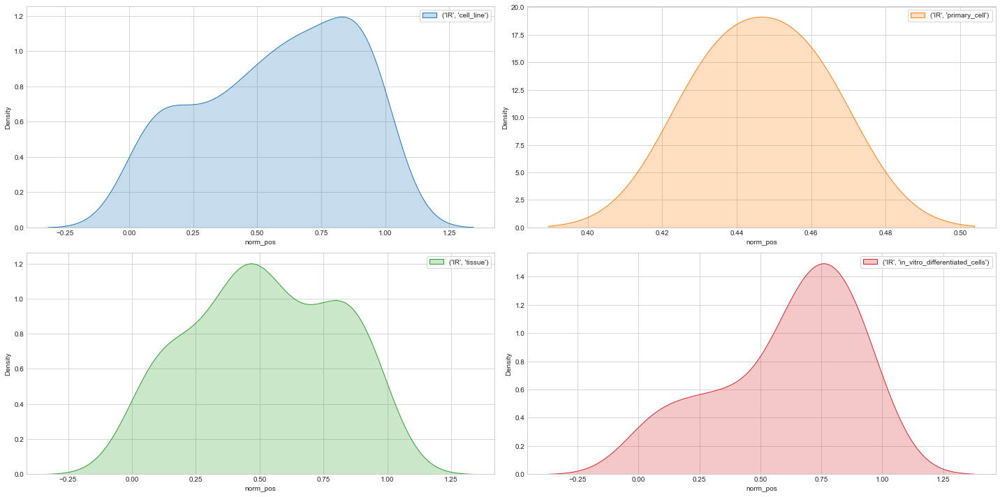

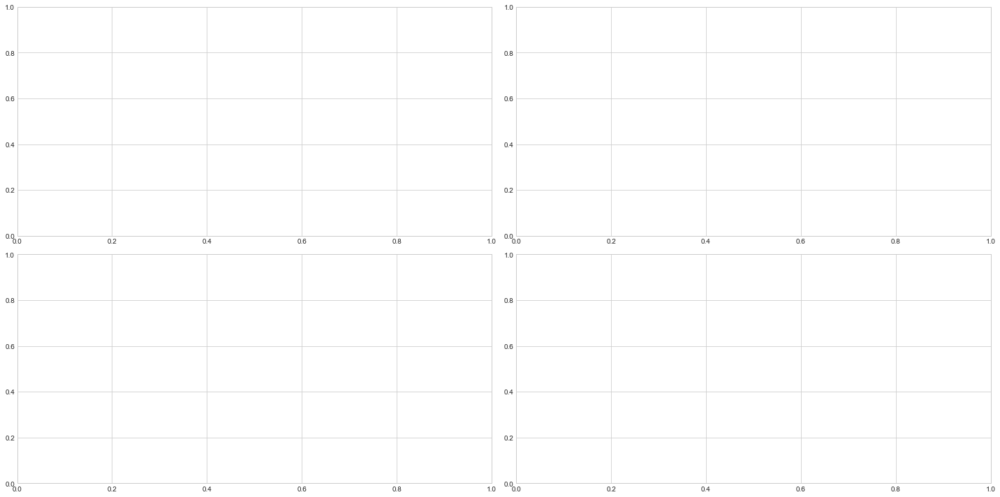

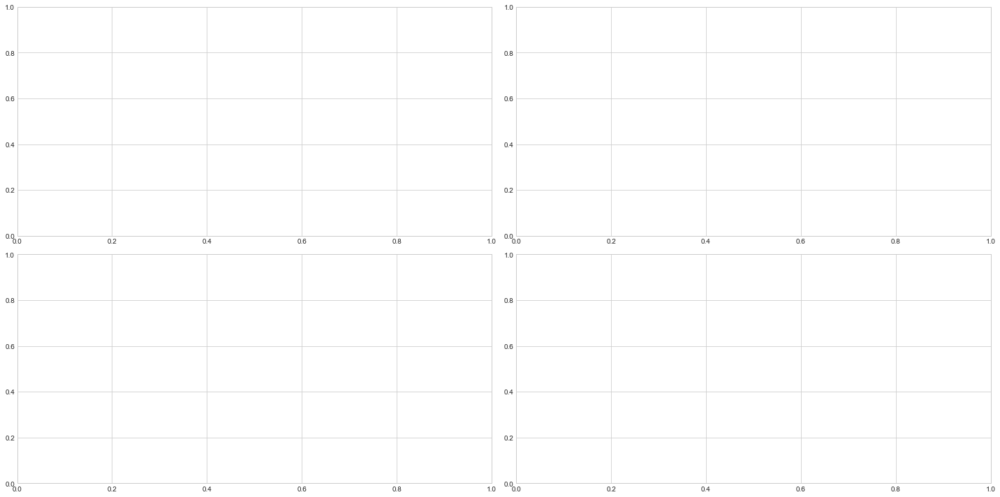

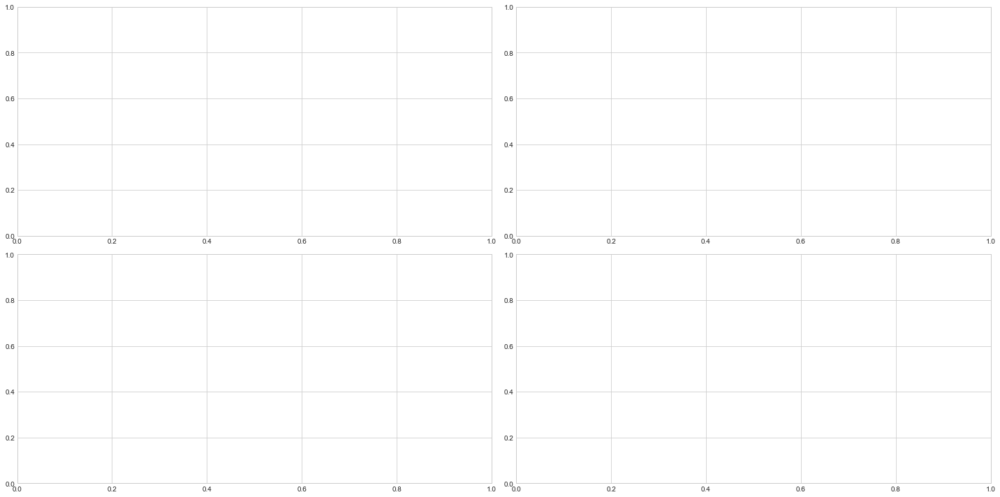

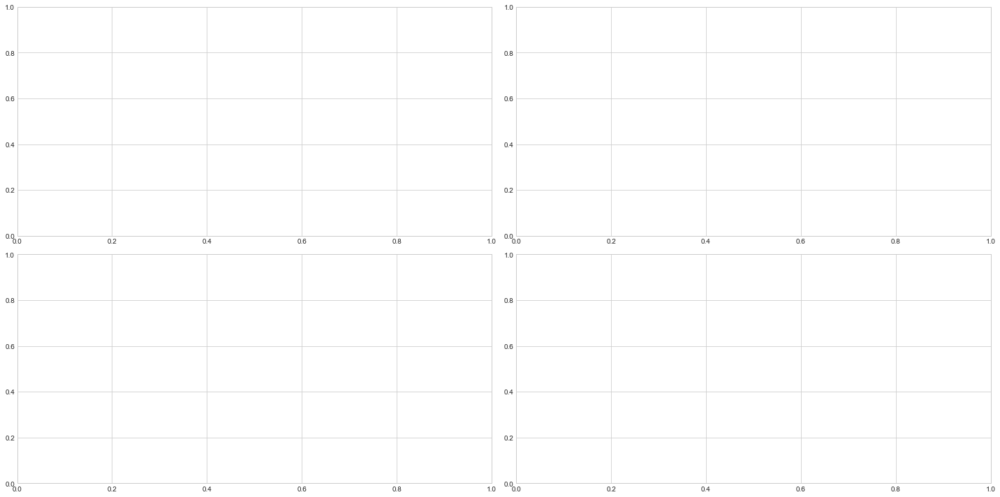

In [142]:
for t in ("IR","ES","5AS","3AS","ME"):
    fig,axs=plt.subplots(figsize=(10*2,5*2),ncols=2,nrows=2)
    indeces=list(itertools.product([0,1],[0,1]))
    colors=sns.color_palette()
    i=0
    for k,df in sig_exons_counts_st.items():
        if t == k[0]:
            ax=axs[indeces[i]]
            if df.shape[0]==0:
                i+=1
                continue
            sns.kdeplot(data=df,x="norm_pos",ax=ax,fill=True,label=k,color=colors[i])
            i+=1
            ax.legend(frameon=True)
    fig.tight_layout()

##### by tissue 

In [34]:
tissue_names=list(set(stbl[stbl.sample_type=="tissue"].sample_subtype))

In [39]:
tissues={}

for tissue in tissue_names:
    tissues[tissue]=list(stbl.name[stbl.sample_subtype==tissue])

In [40]:
tbl_path="./tables/exon_counts/"
files=[x.name for x in Path(tbl_path).iterdir()]

exons_counts_tissue={}

for t in ("IR","ES","5AS","3AS","ME"):
    for tissue,samples in tissues.items():
        s=tissue.replace(" ","_")
        fname=f"exon_count_{t}_{s}.csv"
        
        if fname not in files:
            df=count_exons_up(isoseq,types=(t,),samples=samples,min_total=5,min_alt_fraction=.01)
            exons_counts_tissue[t+s]=df
            df.to_csv(tbl_path+fname,index=False)
            
        else:
            exons_counts_tissue[t+s]=pd.read_csv(tbl_path+fname)

100%|███████████████████████████████| 695092/695092 [23:04<00:00, 502.00genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [22:06<00:00, 524.09genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [21:40<00:00, 534.68genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [21:33<00:00, 537.23genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [21:34<00:00, 537.11genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [22:13<00:00, 521.10genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [21:26<00:00, 540.43genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [20:48<00:00, 556.69genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


100%|███████████████████████████████| 695092/695092 [22:32<00:00, 514.06genes/s]


0 datapoints dropped due abnormal position upstream.
0 datapoints dropped due abnormal position downstream.


 32%|█████████▊                     | 221284/695092 [06:48<14:33, 542.20genes/s]


KeyboardInterrupt: 